In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# Data Processing

# Tag data

In [ ]:
df = pd.read_csv('./user_taggedmovies.dat',sep="\s+", )
df

,userID,movieID,tagID,date_day,date_month,date_year,date_hour,date_minute,date_second
0,75,353,5290,29,10,2006,23,20,15
1,78,4223,5264,16,4,2007,4,43,45
2,127,1343,1544,28,8,2007,3,42,27
3,127,1343,12330,28,8,2007,3,42,27
4,127,2080,1451,28,8,2007,3,42,47
...,...,...,...,...,...,...,...,...,...
47952,71534,7937,306,3,12,2007,3,7,14
47953,71534,8848,331,3,12,2007,3,6,19
47954,71534,8848,427,3,12,2007,3,6,27
47955,71534,25833,7671,3,12,2007,3,7,31


In [ ]:
df.loc[:,'timestamps'] = df.date_year.astype('str')+'_'+ df.date_month.astype('str')+'_'+ df.date_day.astype('str')+'_'+ \
df.date_hour.astype('str')+'_'+df.date_minute.astype('str')+'_'+df.date_second.astype('str')

df.loc[:,'timestamps'] = df.loc[:,'timestamps'].apply(pd.to_datetime,format='%Y_%m_%d_%H_%M_%S')
df['dayofweek_num']=df['timestamps'].dt.dayofweek  
df['weekofyear']=df['timestamps'].dt.weekofyear
df['quarter']=df['timestamps'].dt.quarter
df['days_in_month']=df['timestamps'].dt.days_in_month
df['is_month_start']=df['timestamps'].dt.is_month_start
df['is_month_end']=df['timestamps'].dt.is_month_end
df['is_quarter_start']=df['timestamps'].dt.is_quarter_start
df['is_quarter_end']=df['timestamps'].dt.is_quarter_end
df['is_year_start']=df['timestamps'].dt.is_year_start
df['is_year_end']=df['timestamps'].dt.is_year_end
df['is_leap_year']=df['timestamps'].dt.is_leap_year

/tmp/ipykernel_967545/2200196596.py:6: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['weekofyear']=df['timestamps'].dt.weekofyear


## Statistical Analysis

In [ ]:
len(df.userID.unique()),len(df.movieID.unique()),len(df.tagID.unique())

(2113, 5908, 9079)

In [ ]:
df.loc[:,'y_m'] = [str(df['date_year'][i])+'_'+str(df['date_month'][i]) for i in range(len(df))]

Text(0.5, 1.0, 'Year_month against number of tagging behaviour')

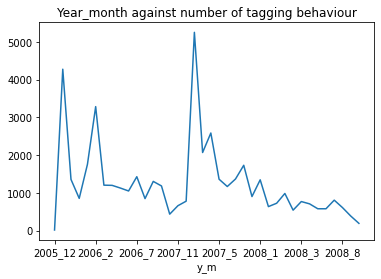

In [ ]:
df.groupby('y_m').count()['userID'].plot()
plt.title('Year_month against number of tagging behaviour')

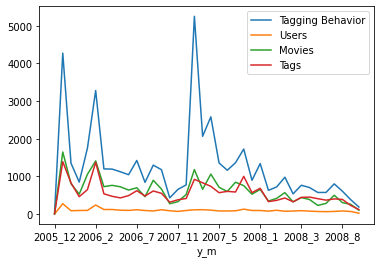

In [ ]:
df.groupby('y_m').count()['userID'].plot()
df.groupby('y_m').userID.nunique().plot()
df.groupby('y_m').movieID.nunique().plot()
df.groupby('y_m').tagID.nunique().plot()
plt.legend(['Tagging Behavior','Users','Movies','Tags'])

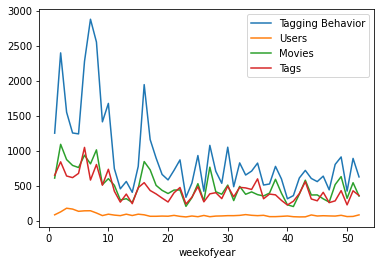

In [ ]:
df.groupby('weekofyear').count()['userID'].plot()
df.groupby('weekofyear').userID.nunique().plot()
df.groupby('weekofyear').movieID.nunique().plot()
df.groupby('weekofyear').tagID.nunique().plot()
plt.legend(['Tagging Behavior','Users','Movies','Tags'])

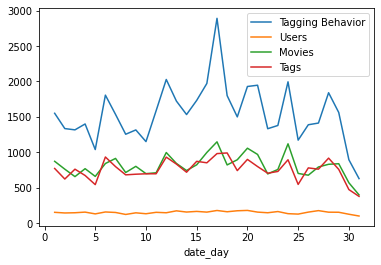

In [ ]:
df.groupby('date_day').count()['userID'].plot()
df.groupby('date_day').userID.nunique().plot()
df.groupby('date_day').movieID.nunique().plot()
df.groupby('date_day').tagID.nunique().plot()
plt.legend(['Tagging Behavior','Users','Movies','Tags'])

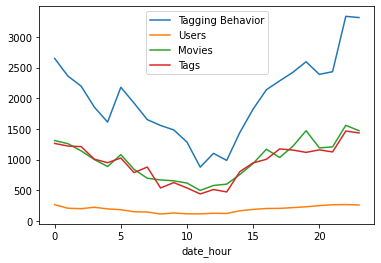

In [ ]:
df.groupby('date_hour').count()['userID'].plot()
df.groupby('date_hour').userID.nunique().plot()
df.groupby('date_hour').movieID.nunique().plot()
df.groupby('date_hour').tagID.nunique().plot()
plt.legend(['Tagging Behavior','Users','Movies','Tags'])

In [ ]:
len(df)/df.userID.nunique()

22.69616658778987

Text(0.5, 1.0, 'Movie_year_month against number of unique tags')

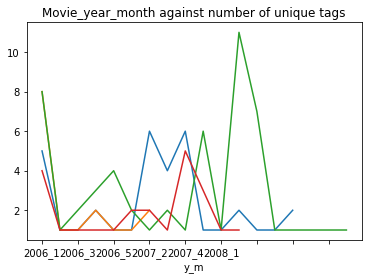

In [ ]:
df[df['movieID']==1247].groupby('y_m').tagID.nunique().plot()
df[df['movieID']==39].groupby('y_m').tagID.nunique().plot()
df[df['movieID']==919].groupby('y_m').tagID.nunique().plot()
df[df['movieID']==910].groupby('y_m').tagID.nunique().plot()
plt.title('Movie_year_month against number of unique tags')

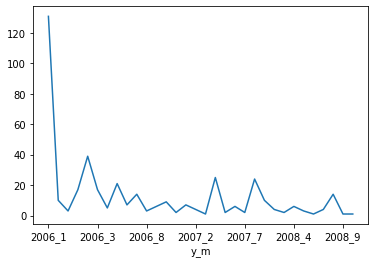

In [ ]:
df[df['tagID']==605].groupby('y_m').movieID.nunique().plot()

## Clustering

https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html#sklearn.cluster.KMeans

https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html#sklearn.decomposition.PCA

https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html#sklearn.cluster.KMeans

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: UserWarning: Attempting to set identical left == right == -0.7526411590934754 results in singular transformations; automatically expanding.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: UserWarning: Attempting to set identical bottom == top == -0.6953959856443584 results in singular transformations; automatically expanding.


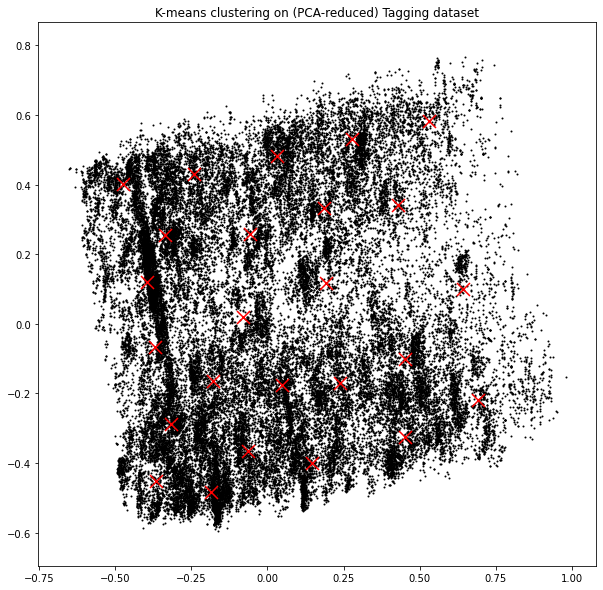

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
scaler = MinMaxScaler()
df_selected = scaler.fit_transform(df.filter(regex="[^time_stamp]"))
df_selected = pd.DataFrame(df_selected)
df_selected.columns = df.filter(regex="[^time_stamp]").columns
vectors = PCA(n_components=2).fit_transform(df_selected) #高维度PCA降维到2维

estimator = KMeans(n_clusters=25,random_state=0)#构造聚类器
estimator.fit(vectors)#聚类
label_pred = estimator.labels_ #获取聚类标签
centroids = estimator.cluster_centers_ #获取聚类中心
inertia = estimator.inertia_ # 获取聚类准则的总和

# Step size of the mesh. Decrease to increase the quality of the VQ.
h = 100     # point in the mesh [x_min, x_max]x[y_min, y_max].

# Plot the decision boundary. For that, we will assign a color to each
x_min, x_max = vectors[:, 0].min() - 0.1, vectors[:, 0].max() + 0.1
y_min, y_max = vectors[:, 1].min() - 0.1, vectors[:, 1].max() + 0.1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Obtain labels for each point in mesh. Use last trained model.
Z = estimator.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(1)
plt.clf()
plt.rcParams["figure.figsize"] = (10, 10)
plt.imshow(Z, interpolation='nearest',
           extent=(xx.min(), xx.max(), yy.min(), yy.max()),
           cmap=plt.cm.Paired,
           aspect='auto', origin='lower')

plt.plot(vectors[:, 0], vectors[:, 1], 'k.', markersize=2)
# Plot the centroids as a white X
centroids = estimator.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1],
            marker='x', s=169, linewidths=3,
            color='red', zorder=10)
plt.title('K-means clustering on (PCA-reduced) Tagging dataset')

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
# plt.xticks(())
# plt.yticks(())
plt.show()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: UserWarning: Attempting to set identical left == right == -0.9421550152618662 results in singular transformations; automatically expanding.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: UserWarning: Attempting to set identical bottom == top == -0.6608927858631737 results in singular transformations; automatically expanding.


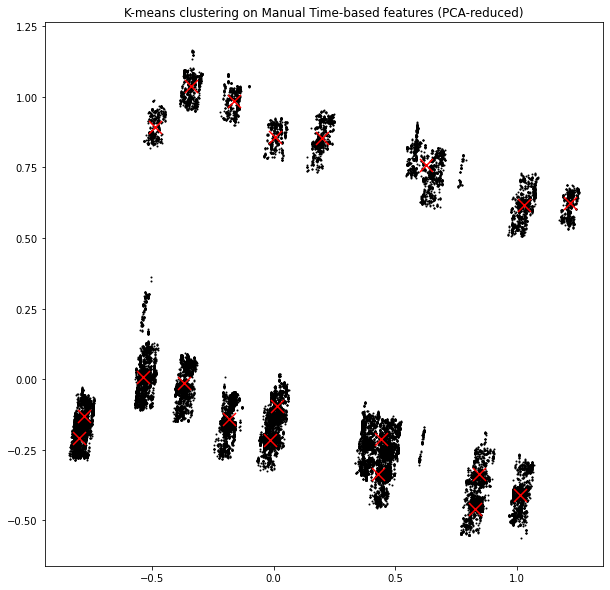

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
scaler = MinMaxScaler()
df_selected = scaler.fit_transform(df.filter(regex="[^time_stamp]").iloc[:,3:])
df_selected = pd.DataFrame(df_selected)
df_selected.columns = df.filter(regex="[^time_stamp]").iloc[:,3:].columns
vectors = PCA(n_components=2).fit_transform(df_selected) #高维度PCA降维到2维

estimator = KMeans(n_clusters=20,random_state=0)#构造聚类器
estimator.fit(vectors)#聚类
label_pred = estimator.labels_ #获取聚类标签
centroids = estimator.cluster_centers_ #获取聚类中心
inertia = estimator.inertia_ # 获取聚类准则的总和

# Step size of the mesh. Decrease to increase the quality of the VQ.
h = 100     # point in the mesh [x_min, x_max]x[y_min, y_max].

# Plot the decision boundary. For that, we will assign a color to each
x_min, x_max = vectors[:, 0].min() - 0.1, vectors[:, 0].max() + 0.1
y_min, y_max = vectors[:, 1].min() - 0.1, vectors[:, 1].max() + 0.1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Obtain labels for each point in mesh. Use last trained model.
Z = estimator.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(1)
plt.clf()
plt.rcParams["figure.figsize"] = (10, 10)
plt.imshow(Z, interpolation='nearest',
           extent=(xx.min(), xx.max(), yy.min(), yy.max()),
           cmap=plt.cm.Paired,
           aspect='auto', origin='lower')

plt.plot(vectors[:, 0], vectors[:, 1], 'k.', markersize=2)
# Plot the centroids as a white X
centroids = estimator.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1],
            marker='x', s=169, linewidths=3,
            color='red', zorder=10)
plt.title('K-means clustering on Manual Time-based features (PCA-reduced)')

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
# plt.xticks(())
# plt.yticks(())
plt.show()


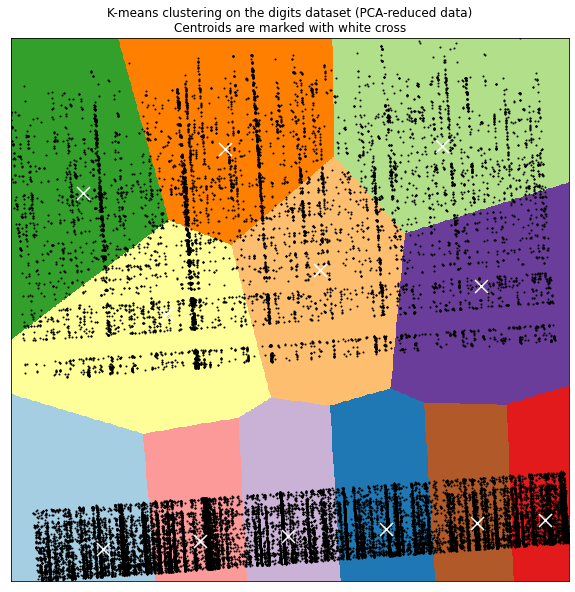

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

vectors = PCA(n_components=2).fit_transform(df.iloc[:,[0,1,2,3]]) #高维度PCA降维到2维

estimator = KMeans(n_clusters=12,random_state=0)#构造聚类器
estimator.fit(vectors)#聚类
label_pred = estimator.labels_ #获取聚类标签
centroids = estimator.cluster_centers_ #获取聚类中心
inertia = estimator.inertia_ # 获取聚类准则的总和

# Step size of the mesh. Decrease to increase the quality of the VQ.
h = 100     # point in the mesh [x_min, x_max]x[y_min, y_max].

# Plot the decision boundary. For that, we will assign a color to each
x_min, x_max = vectors[:, 0].min() - 1, vectors[:, 0].max() + 1
y_min, y_max = vectors[:, 1].min() - 1, vectors[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Obtain labels for each point in mesh. Use last trained model.
Z = estimator.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(1)
plt.clf()
plt.rcParams["figure.figsize"] = (10, 10)
plt.imshow(Z, interpolation='nearest',
           extent=(xx.min(), xx.max(), yy.min(), yy.max()),
           cmap=plt.cm.Paired,
           aspect='auto', origin='lower')

plt.plot(vectors[:, 0], vectors[:, 1], 'k.', markersize=2)
# Plot the centroids as a white X
centroids = estimator.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1],
            marker='x', s=169, linewidths=3,
            color='w', zorder=10)
plt.title('K-means clustering on the digits dataset (PCA-reduced data)\n'
          'Centroids are marked with white cross')

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())
plt.show()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: UserWarning: Attempting to set identical left == right == -0.984489019552266 results in singular transformations; automatically expanding.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: UserWarning: Attempting to set identical bottom == top == -0.6894682761708826 results in singular transformations; automatically expanding.


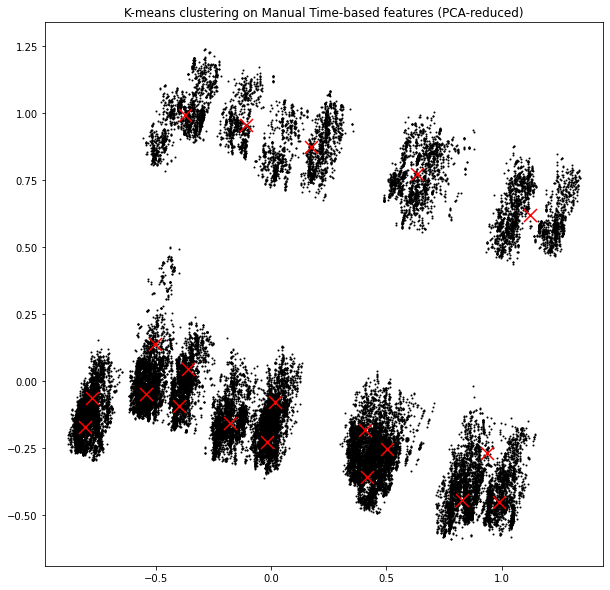

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
scaler = MinMaxScaler()
df_selected = scaler.fit_transform(df.filter(regex="[^time_stamp]"))
df_selected = pd.DataFrame(df_selected)
df_selected.columns = df.filter(regex="[^time_stamp]").columns
vectors = PCA(n_components=2).fit_transform(df_selected) #高维度PCA降维到2维

estimator = KMeans(n_clusters=20,random_state=0)#构造聚类器
estimator.fit(vectors)#聚类
label_pred = estimator.labels_ #获取聚类标签
centroids = estimator.cluster_centers_ #获取聚类中心
inertia = estimator.inertia_ # 获取聚类准则的总和

# Step size of the mesh. Decrease to increase the quality of the VQ.
h = 100     # point in the mesh [x_min, x_max]x[y_min, y_max].

# Plot the decision boundary. For that, we will assign a color to each
x_min, x_max = vectors[:, 0].min() - 0.1, vectors[:, 0].max() + 0.1
y_min, y_max = vectors[:, 1].min() - 0.1, vectors[:, 1].max() + 0.1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Obtain labels for each point in mesh. Use last trained model.
Z = estimator.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(1)
plt.clf()
plt.rcParams["figure.figsize"] = (10, 10)
plt.imshow(Z, interpolation='nearest',
           extent=(xx.min(), xx.max(), yy.min(), yy.max()),
           cmap=plt.cm.Paired,
           aspect='auto', origin='lower')

plt.plot(vectors[:, 0], vectors[:, 1], 'k.', markersize=2)
# Plot the centroids as a white X
centroids = estimator.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1],
            marker='x', s=169, linewidths=3,
            color='red', zorder=10)
plt.title('K-means clustering on Manual Time-based features (PCA-reduced)')

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
# plt.xticks(())
# plt.yticks(())
plt.show()


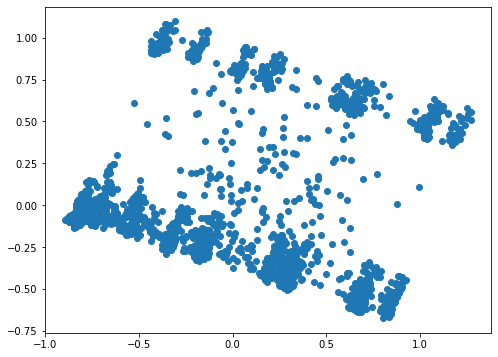

In [ ]:
df_selected = df.filter(regex="[^time_stamp]") # all data
scaler = MinMaxScaler()
df_selected = scaler.fit_transform(df_selected)
df_selected = pd.DataFrame(df_selected)
df_selected.columns = df.filter(regex="[^time_stamp]").columns
df_user = df_selected.groupby('userID').mean()
pca = PCA(n_components=2)
vectors = pca.fit_transform(df_user) 
plt.rcParams["figure.figsize"] = (8, 6)
plt.scatter(vectors[:,0],vectors[:,1])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: UserWarning: Attempting to set identical left == right == -0.993383740717376 results in singular transformations; automatically expanding.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: UserWarning: Attempting to set identical bottom == top == -0.7741933289835057 results in singular transformations; automatically expanding.


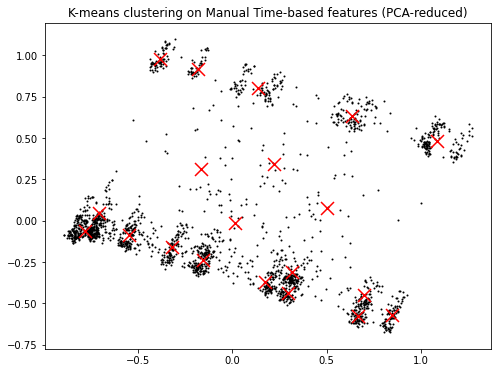

In [ ]:

estimator = KMeans(n_clusters=20,random_state=0)#构造聚类器
estimator.fit(vectors)#聚类
label_pred = estimator.labels_ #获取聚类标签
centroids = estimator.cluster_centers_ #获取聚类中心
inertia = estimator.inertia_ # 获取聚类准则的总和

# Step size of the mesh. Decrease to increase the quality of the VQ.
h = 100     # point in the mesh [x_min, x_max]x[y_min, y_max].

# Plot the decision boundary. For that, we will assign a color to each
x_min, x_max = vectors[:, 0].min() - 0.1, vectors[:, 0].max() + 0.1
y_min, y_max = vectors[:, 1].min() - 0.1, vectors[:, 1].max() + 0.1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Obtain labels for each point in mesh. Use last trained model.
Z = estimator.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(1)
plt.clf()
plt.rcParams["figure.figsize"] = (10, 10)
plt.imshow(Z, interpolation='nearest',
           extent=(xx.min(), xx.max(), yy.min(), yy.max()),
           cmap=plt.cm.Paired,
           aspect='auto', origin='lower')

plt.plot(vectors[:, 0], vectors[:, 1], 'k.', markersize=2)
# Plot the centroids as a white X
centroids = estimator.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1],
            marker='x', s=169, linewidths=3,
            color='red', zorder=10)
plt.title('K-means clustering on Manual Time-based features (PCA-reduced)')

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
# plt.xticks(())
# plt.yticks(())
plt.show()


In [ ]:
dict_userLabel = dict(zip(df.userID.unique(),estimator.labels_))
df.loc[:,'cluster_label'] = [dict_userLabel[i] for i in df.userID]
df.head()

,userID,movieID,tagID,date_day,date_month,date_year,date_hour,date_minute,date_second,timestamps,dayofweek_num,weekofyear,quarter,days_in_month,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,is_leap_year,cluster_label
0,75,353,5290,29,10,2006,23,20,15,2006-10-29 23:20:15,6,43,4,31,False,False,False,False,False,False,False,5
1,78,4223,5264,16,4,2007,4,43,45,2007-04-16 04:43:45,0,16,2,30,False,False,False,False,False,False,False,0
2,127,1343,1544,28,8,2007,3,42,27,2007-08-28 03:42:27,1,35,3,31,False,False,False,False,False,False,False,2
3,127,1343,12330,28,8,2007,3,42,27,2007-08-28 03:42:27,1,35,3,31,False,False,False,False,False,False,False,2
4,127,2080,1451,28,8,2007,3,42,47,2007-08-28 03:42:47,1,35,3,31,False,False,False,False,False,False,False,2


In [ ]:
df.cluster_label.value_counts()

11    8989
19    6185
4     5308
9     4196
13    3237
0     3217
2     3142
16    2278
14    2080
18    1590
1     1281
5     1171
8     1047
7      724
3      721
17     630
6      629
10     591
15     476
12     465
Name: cluster_label, dtype: int64

In [ ]:
df.loc[:,'cluster_label'] = estimator.labels_
df.head()

,userID,movieID,tagID,date_day,date_month,date_year,date_hour,date_minute,date_second,timestamps,dayofweek_num,weekofyear,quarter,days_in_month,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,is_leap_year,cluster_label
0,75,353,5290,29,10,2006,23,20,15,2006-10-29 23:20:15,6,43,4,31,False,False,False,False,False,False,False,13
1,78,4223,5264,16,4,2007,4,43,45,2007-04-16 04:43:45,0,16,2,30,False,False,False,False,False,False,False,6
2,127,1343,1544,28,8,2007,3,42,27,2007-08-28 03:42:27,1,35,3,31,False,False,False,False,False,False,False,1
3,127,1343,12330,28,8,2007,3,42,27,2007-08-28 03:42:27,1,35,3,31,False,False,False,False,False,False,False,18
4,127,2080,1451,28,8,2007,3,42,47,2007-08-28 03:42:47,1,35,3,31,False,False,False,False,False,False,False,1


In [ ]:
df.groupby('y_m').apply(lambda x: list(x['cluster_label']))

y_m
2005_12     [2, 18, 18, 18, 18, 18, 18, 18, 18, 18, 0, 0, 9]
2006_1     [4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, ...
2006_10    [5, 12, 17, 17, 5, 9, 9, 9, 9, 9, 9, 2, 2, 2, ...
2006_11    [5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, ...
2006_12    [17, 17, 11, 17, 17, 17, 17, 17, 17, 17, 17, 1...
2006_2     [0, 0, 0, 0, 0, 0, 4, 11, 11, 11, 11, 11, 11, ...
2006_3     [11, 13, 9, 9, 9, 9, 9, 2, 18, 4, 4, 4, 9, 13,...
2006_4     [9, 0, 0, 9, 0, 0, 0, 2, 4, 9, 0, 13, 13, 13, ...
2006_5     [13, 0, 0, 0, 0, 0, 13, 13, 13, 13, 13, 13, 13...
2006_6     [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...
2006_7     [18, 0, 18, 18, 2, 2, 2, 18, 18, 18, 18, 18, 1...
2006_8     [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 14, 14, 14, ...
2006_9     [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...
2007_1     [19, 19, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 19, 19,...
2007_10    [2, 12, 2, 2, 2, 13, 13, 13, 14, 14, 2, 2, 2, ...
2007_11    [2, 2, 2, 2, 5, 2, 2, 0, 16, 18, 18, 18, 18, 1...
2007_12    [17, 17, 

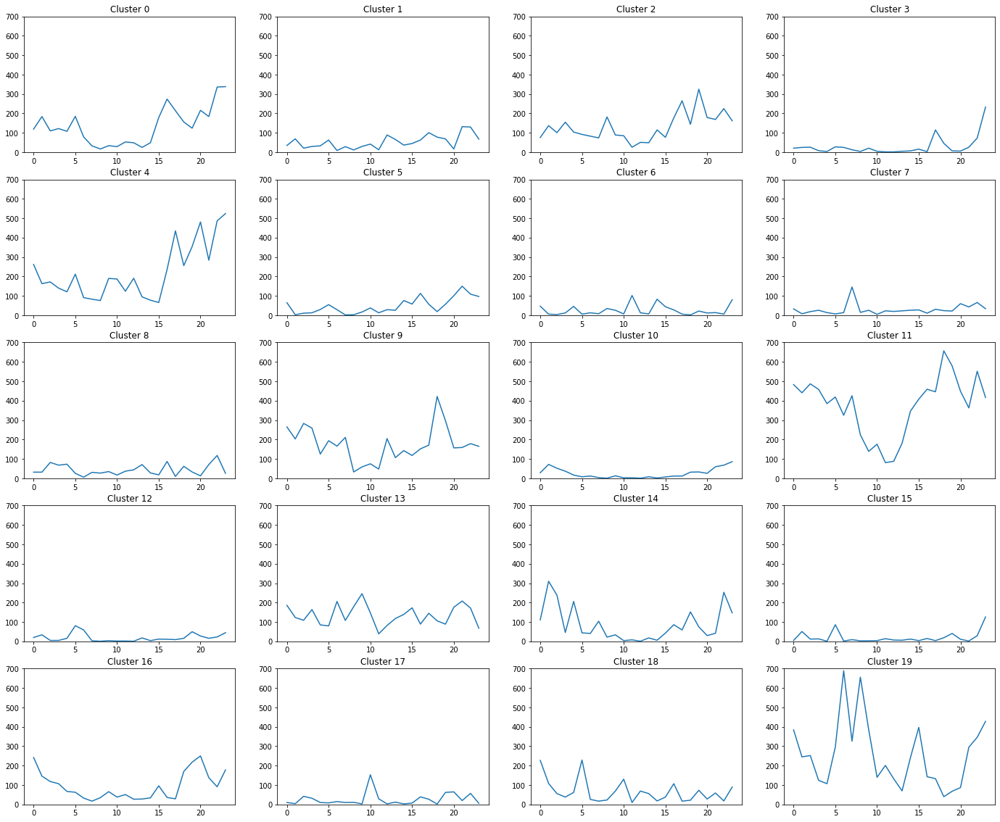

In [ ]:
# cluster by user
plt.figure(1,figsize=(24, 20))
t=0
for i in range(5):
  for j in range(4):
    plt.subplot2grid((5,4), (i,j))
    pic= df[df['cluster_label']==t].groupby('date_hour').userID.count().plot()
    plt.title('Cluster '+ str(t))
    plt.xlabel('')
    plt.ylim(0, 700)
    t += 1

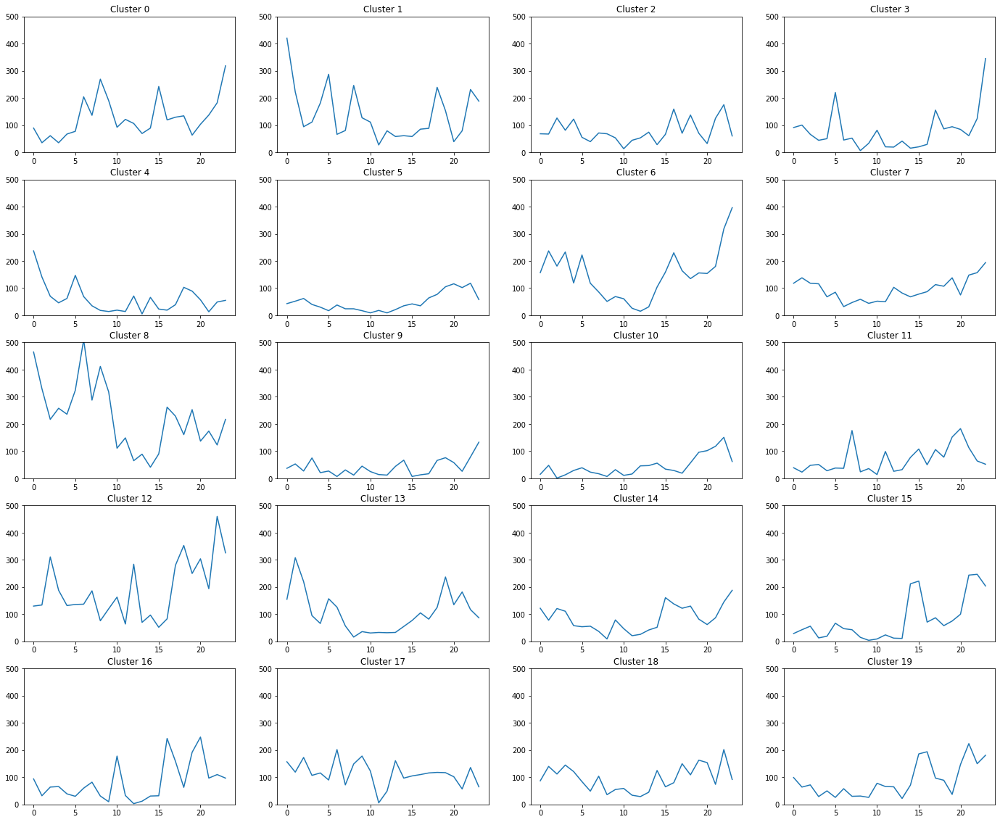

In [ ]:
plt.figure(1,figsize=(24, 20))
t=0
for i in range(5):
  for j in range(4):
    plt.subplot2grid((5,4), (i,j))
    pic= df[df['cluster_label']==t].groupby('date_hour').userID.count().plot()
    plt.title('Cluster '+ str(t))
    plt.xlabel('')
    plt.ylim(0, 500)
    t += 1

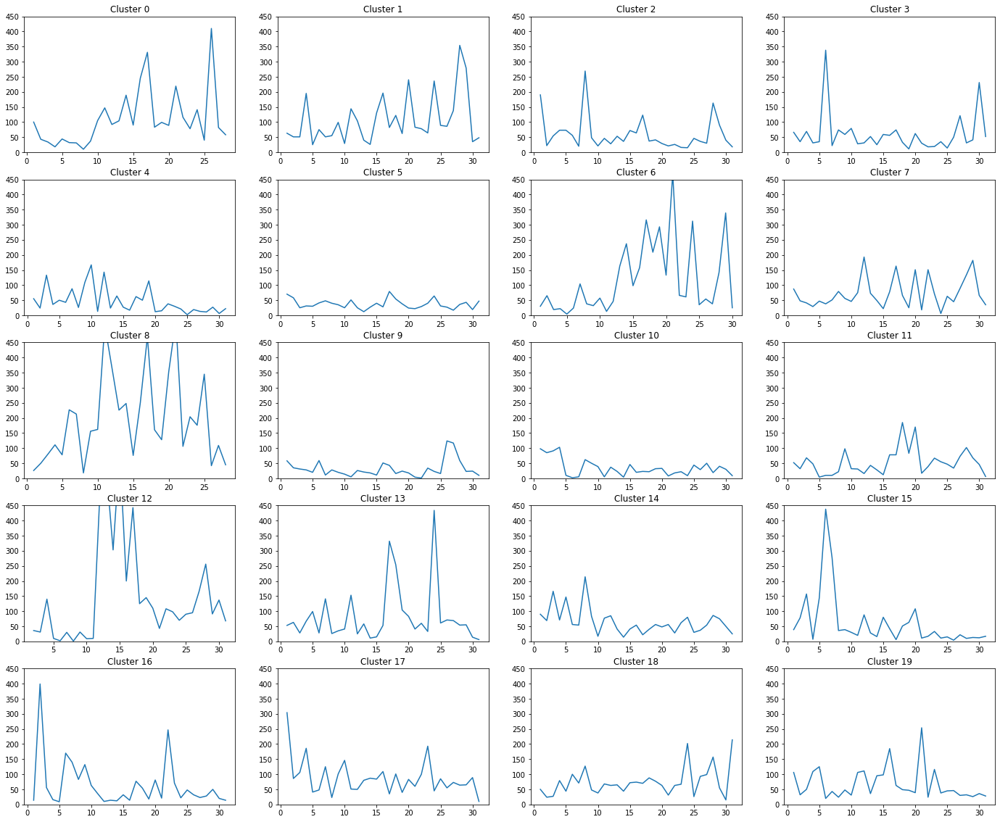

In [ ]:
plt.figure(1,figsize=(24, 20))
t=0
for i in range(5):
  for j in range(4):
    plt.subplot2grid((5,4), (i,j))
    pic= df[df['cluster_label']==t].groupby('date_day').userID.count().plot()
    plt.title('Cluster '+ str(t))
    plt.xlabel('')
    plt.ylim(0, 450)
    t += 1

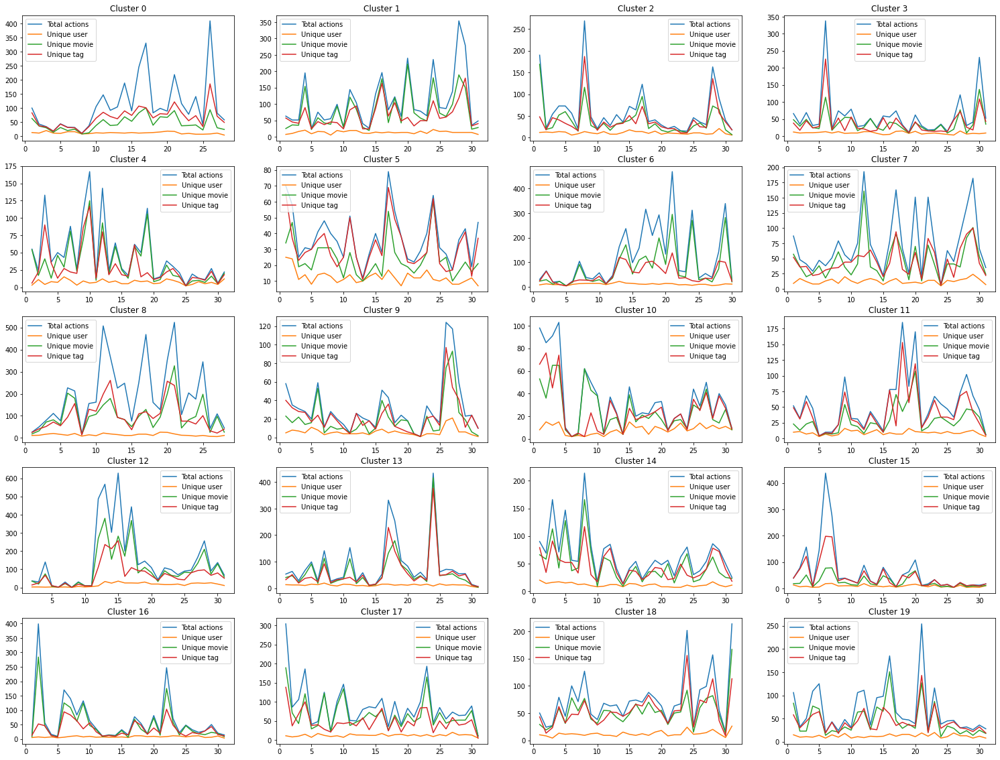

In [ ]:
plt.figure(1,figsize=(26, 20))
t=0
for i in range(5):
  for j in range(4):
    plt.subplot2grid((5,4), (i,j))
    df[df['cluster_label']==t].groupby('date_day').userID.count().plot()
    df[df['cluster_label']==t].groupby('date_day')['userID'].nunique().plot()
    df[df['cluster_label']==t].groupby('date_day')['movieID'].nunique().plot()
    df[df['cluster_label']==t].groupby('date_day')['tagID'].nunique().plot()
    plt.title('Cluster '+ str(t))
    plt.legend(['Total actions','Unique user','Unique movie','Unique tag'])
    plt.xlabel('')
    t += 1

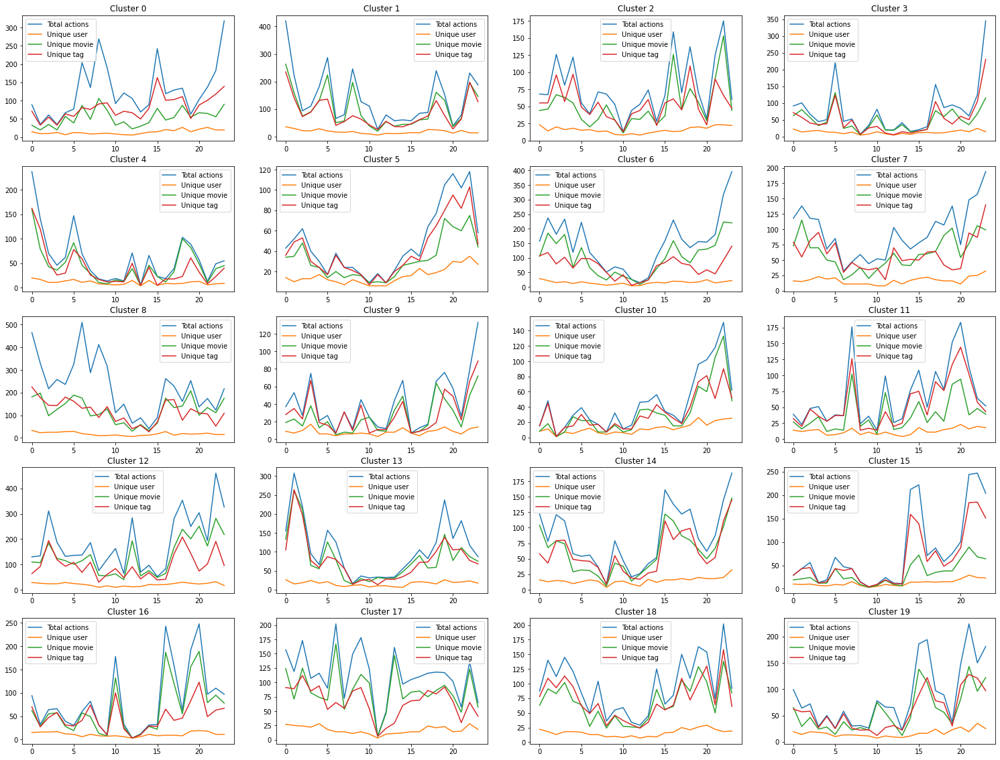

In [ ]:
plt.figure(1,figsize=(26, 20))
t=0
for i in range(5):
  for j in range(4):
    plt.subplot2grid((5,4), (i,j))
    df[df['cluster_label']==t].groupby('date_hour').userID.count().plot()
    df[df['cluster_label']==t].groupby('date_hour')['userID'].nunique().plot()
    df[df['cluster_label']==t].groupby('date_hour')['movieID'].nunique().plot()
    df[df['cluster_label']==t].groupby('date_hour')['tagID'].nunique().plot()
    plt.title('Cluster '+ str(t))
    plt.legend(['Total actions','Unique user','Unique movie','Unique tag'])
    plt.xlabel('')
    t += 1

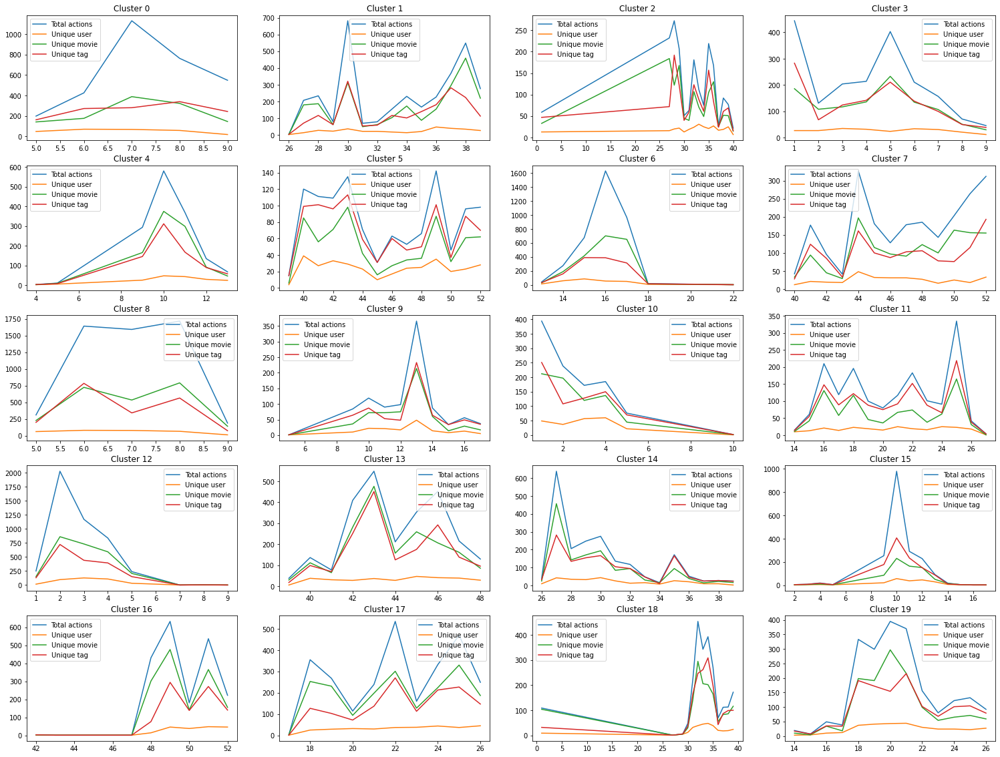

In [ ]:
plt.figure(1,figsize=(26, 20))
t=0
for i in range(5):
  for j in range(4):
    plt.subplot2grid((5,4), (i,j))
    df[df['cluster_label']==t].groupby('weekofyear').userID.count().plot()
    df[df['cluster_label']==t].groupby('weekofyear')['userID'].nunique().plot()
    df[df['cluster_label']==t].groupby('weekofyear')['movieID'].nunique().plot()
    df[df['cluster_label']==t].groupby('weekofyear')['tagID'].nunique().plot()
    plt.title('Cluster '+ str(t))
    plt.legend(['Total actions','Unique user','Unique movie','Unique tag'])
    plt.xlabel('')
    t += 1

cluster by user

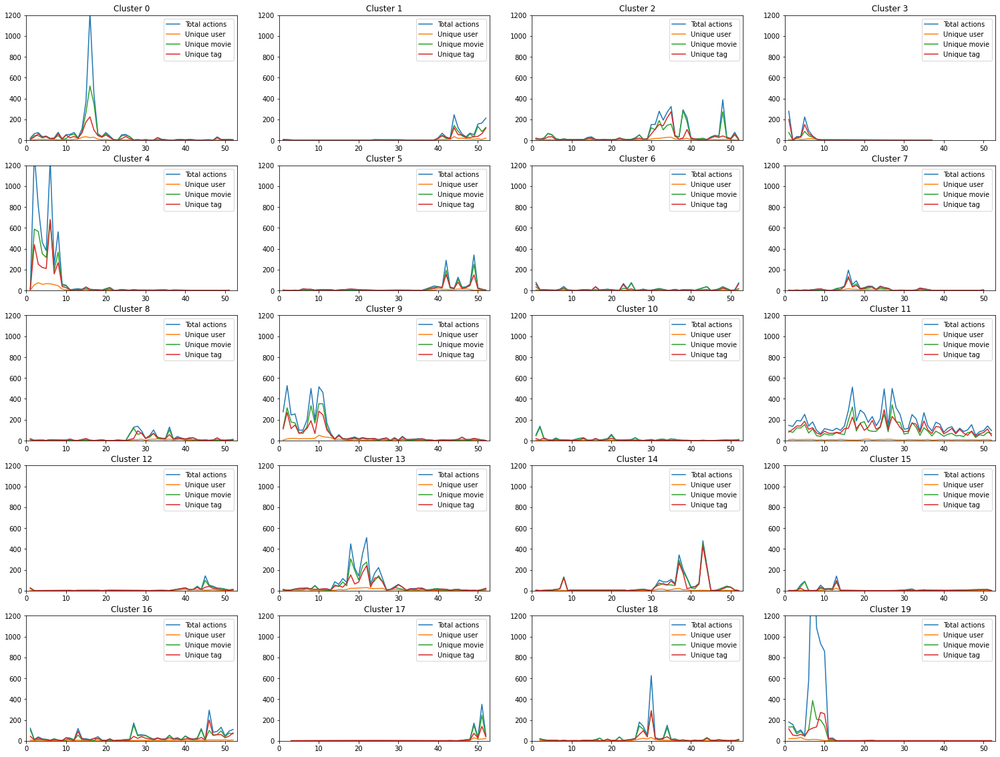

In [ ]:
plt.figure(1,figsize=(26, 20))
t=0
for i in range(5):
  for j in range(4):
    plt.subplot2grid((5,4), (i,j))
    df[df['cluster_label']==t].groupby('weekofyear').userID.count().plot()
    df[df['cluster_label']==t].groupby('weekofyear')['userID'].nunique().plot()
    df[df['cluster_label']==t].groupby('weekofyear')['movieID'].nunique().plot()
    df[df['cluster_label']==t].groupby('weekofyear')['tagID'].nunique().plot()
    plt.title('Cluster '+ str(t))
    plt.legend(['Total actions','Unique user','Unique movie','Unique tag'])
    plt.xlabel('')
    plt.ylim(0, 1200)
    plt.xlim(0, 53)
    t += 1

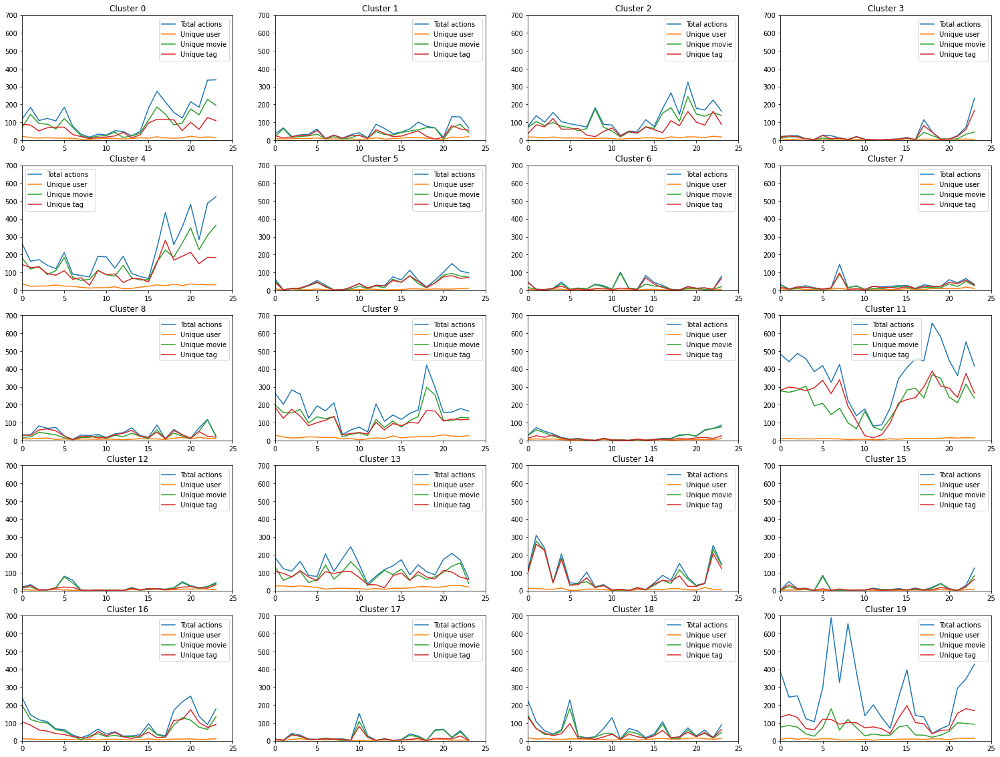

In [ ]:
plt.figure(1,figsize=(26, 20))
t=0
for i in range(5):
  for j in range(4):
    plt.subplot2grid((5,4), (i,j))
    df[df['cluster_label']==t].groupby('date_hour').userID.count().plot()
    df[df['cluster_label']==t].groupby('date_hour')['userID'].nunique().plot()
    df[df['cluster_label']==t].groupby('date_hour')['movieID'].nunique().plot()
    df[df['cluster_label']==t].groupby('date_hour')['tagID'].nunique().plot()
    plt.title('Cluster '+ str(t))
    plt.legend(['Total actions','Unique user','Unique movie','Unique tag'])
    plt.xlabel('')
    plt.ylim(0, 700)
    plt.xlim(0, 25)
    t += 1

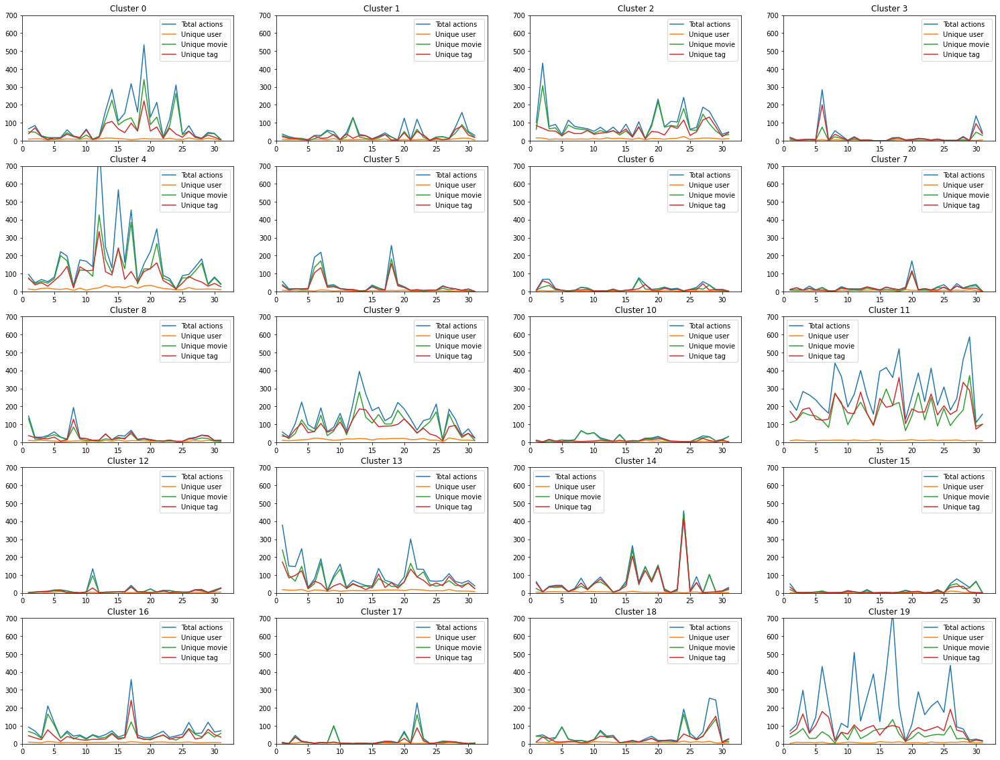

In [ ]:
plt.figure(1,figsize=(26, 20))
t=0
for i in range(5):
  for j in range(4):
    plt.subplot2grid((5,4), (i,j))
    df[df['cluster_label']==t].groupby('date_day').userID.count().plot()
    df[df['cluster_label']==t].groupby('date_day')['userID'].nunique().plot()
    df[df['cluster_label']==t].groupby('date_day')['movieID'].nunique().plot()
    df[df['cluster_label']==t].groupby('date_day')['tagID'].nunique().plot()
    plt.title('Cluster '+ str(t))
    plt.legend(['Total actions','Unique user','Unique movie','Unique tag'])
    plt.xlabel('')
    plt.ylim(0, 700)
    plt.xlim(0, 33)
    t += 1

## Time Series Features

In [ ]:
df.loc[:,'timestamps'] = df.date_year.astype('str')+'_'+ df.date_month.astype('str')+'_'+ df.date_day.astype('str')+'_'+ \
df.date_hour.astype('str')+'_'+df.date_minute.astype('str')+'_'+df.date_second.astype('str')

In [ ]:
df.head()

,userID,movieID,tagID,date_day,date_month,date_year,date_hour,date_minute,date_second,timestamps
0,75,353,5290,29,10,2006,23,20,15,2006_10_29_23_20_15
1,78,4223,5264,16,4,2007,4,43,45,2007_4_16_4_43_45
2,127,1343,1544,28,8,2007,3,42,27,2007_8_28_3_42_27
3,127,1343,12330,28,8,2007,3,42,27,2007_8_28_3_42_27
4,127,2080,1451,28,8,2007,3,42,47,2007_8_28_3_42_47


### Time-Based Features
https://www.analyticsvidhya.com/blog/2019/12/6-powerful-feature-engineering-techniques-time-series/

In [ ]:
df.loc[:,'timestamps'] = df.date_year.astype('str')+'_'+ df.date_month.astype('str')+'_'+ df.date_day.astype('str')+'_'+ \
df.date_hour.astype('str')+'_'+df.date_minute.astype('str')+'_'+df.date_second.astype('str')

df.loc[:,'timestamps'] = df.loc[:,'timestamps'].apply(pd.to_datetime,format='%Y_%m_%d_%H_%M_%S')
df['dayofweek_num']=df['timestamps'].dt.dayofweek  
df['weekofyear']=df['timestamps'].dt.weekofyear
df['quarter']=df['timestamps'].dt.quarter
df['days_in_month']=df['timestamps'].dt.days_in_month
df['is_month_start']=df['timestamps'].dt.is_month_start
df['is_month_end']=df['timestamps'].dt.is_month_end
df['is_quarter_start']=df['timestamps'].dt.is_quarter_start
df['is_quarter_end']=df['timestamps'].dt.is_quarter_end
df['is_year_start']=df['timestamps'].dt.is_year_start
df['is_year_end']=df['timestamps'].dt.is_year_end
df['is_leap_year']=df['timestamps'].dt.is_leap_year

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  """


In [ ]:
# https://towardsdatascience.com/feature-engineering-on-date-time-data-90f6e954e6b8
def daypart(hour):
    if hour in [2,3,4,5]:
        return 0 #"dawn"
    elif hour in [6,7,8,9]:
        return 1 #"morning"
    elif hour in [10,11,12,13]:
        return 2 #"noon"
    elif hour in [14,15,16,17]:
        return 3 #"afternoon"
    elif hour in [18,19,20,21]:
        return 4 #"evening"
    else: return 5 #"midnight"
# utilize it along with apply method
df['day_part'] = df.date_hour.apply(daypart)
# weekend flag
df['is_weekend'] = df['dayofweek_num'].apply(lambda x : 1 if x < 5 else 0)

In [ ]:
df.head()

,userID,movieID,tagID,date_day,date_month,date_year,date_hour,date_minute,date_second,timestamps,dayofweek_num,weekofyear,quarter,days_in_month,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,is_leap_year
0,75,353,5290,29,10,2006,23,20,15,2006-10-29 23:20:15,6,43,4,31,False,False,False,False,False,False,False
1,78,4223,5264,16,4,2007,4,43,45,2007-04-16 04:43:45,0,16,2,30,False,False,False,False,False,False,False
2,127,1343,1544,28,8,2007,3,42,27,2007-08-28 03:42:27,1,35,3,31,False,False,False,False,False,False,False
3,127,1343,12330,28,8,2007,3,42,27,2007-08-28 03:42:27,1,35,3,31,False,False,False,False,False,False,False
4,127,2080,1451,28,8,2007,3,42,47,2007-08-28 03:42:47,1,35,3,31,False,False,False,False,False,False,False


In [ ]:
df.shape

(47957, 21)

#### Selected Time Features

In [ ]:
import pandas as pd
from sklearn.feature_selection import VarianceThreshold
sel = VarianceThreshold(threshold=(.8 * (1 - .8)))
df_selected = pd.DataFrame(sel.fit_transform(df.filter(regex="[^time_stamp]")))
df_selected.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,75,353,5290,29,10,2006,23,20,15,6,43,4,31
1,78,4223,5264,16,4,2007,4,43,45,0,16,2,30
2,127,1343,1544,28,8,2007,3,42,27,1,35,3,31
3,127,1343,12330,28,8,2007,3,42,27,1,35,3,31
4,127,2080,1451,28,8,2007,3,42,47,1,35,3,31


In [ ]:
# df_selected.columns = ['userID','movieID','tagID','date_day','date_mont','date_year','date_hour','date_minute','date_second','dayofweek_num','weekofyear','quarter','days_in_month'	]

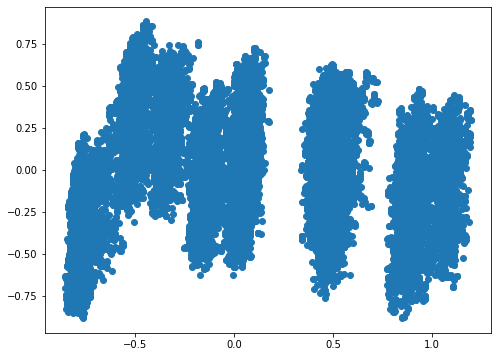

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
scaler = MinMaxScaler()
# df_selected = scaler.fit_transform(df.filter(regex="[^time_stamp]"))
df_selected = scaler.fit_transform(df_selected)
vectors = PCA().fit_transform(df_selected) #高维度PCA降维到2维
plt.rcParams["figure.figsize"] = (8, 6)
plt.scatter(vectors[:,0],vectors[:,1]) # user

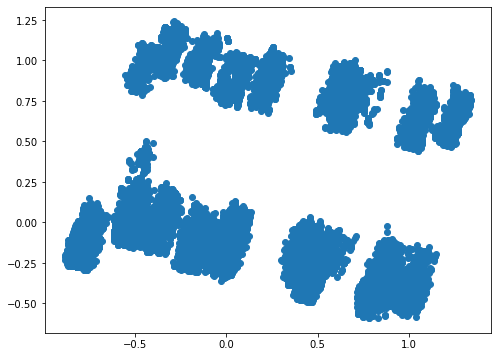

In [ ]:
scaler = MinMaxScaler()
df_selected = scaler.fit_transform(df.filter(regex="[^time_stamp]"))
vectors = PCA().fit_transform(df_selected) #高维度PCA降维到2维
plt.rcParams["figure.figsize"] = (8, 6)
plt.scatter(vectors[:,0],vectors[:,1]) # user

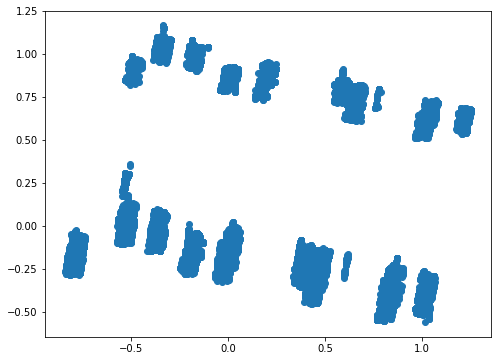

In [ ]:
scaler = MinMaxScaler()
df_selected = scaler.fit_transform(df.filter(regex="[^time_stamp]").iloc[:,3:])
vectors = PCA().fit_transform(df_selected) #高维度PCA降维到2维
plt.rcParams["figure.figsize"] = (8, 6)
plt.scatter(vectors[:,0],vectors[:,1]) # user

### Lag Features
The lag value we choose will depend on the correlation of individual values with its past values.

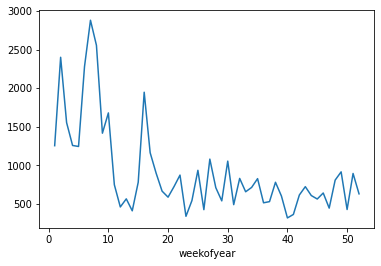

In [ ]:
df_weeks = df.groupby('weekofyear').count()[['userID']] 
df_weeks = df_weeks.rename(columns={'userID':'userCounts'})
df_weeks.userCounts.plot() # counts for each week of year

In [ ]:
# Lag features
df_weeks['lag_1'] = df_weeks['userCounts'].shift(1)
df_weeks['lag_2'] = df_weeks['userCounts'].shift(2)
df_weeks['lag_3'] = df_weeks['userCounts'].shift(3)
df_weeks['lag_4'] = df_weeks['userCounts'].shift(4)
df_weeks['lag_5'] = df_weeks['userCounts'].shift(5)
df_weeks['lag_6'] = df_weeks['userCounts'].shift(6)
df_weeks['lag_7'] = df_weeks['userCounts'].shift(7)
df_weeks = df_weeks[['lag_1', 'lag_2', 'lag_3', 'lag_4', 'lag_5', 'lag_6', 'lag_7', 'userCounts']]
df_weeks.head()

,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,userCounts
weekofyear,,,,,,,,
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1256
2,1256.0,NaN,NaN,NaN,NaN,NaN,NaN,2402
3,2402.0,1256.0,NaN,NaN,NaN,NaN,NaN,1555
4,1555.0,2402.0,1256.0,NaN,NaN,NaN,NaN,1259
5,1259.0,1555.0,2402.0,1256.0,NaN,NaN,NaN,1246


[]

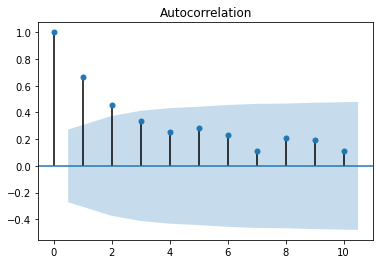

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(df_weeks['userCounts'], lags=10)
# plot_pacf(df_weeks['userCounts'], lags=10)
plt.plot()

### Rolling Window Feature
Recency in an important factor in a time series. Values closer to the current date would hold more information.

In [ ]:
df_weeks['rolling_mean'] = df_weeks['userCounts'].rolling(window=7).mean()
df_weeks.head(10)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,userCounts,rolling_mean
weekofyear,,,,,,,,,
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1256,NaN
2,1256.0,NaN,NaN,NaN,NaN,NaN,NaN,2402,NaN
3,2402.0,1256.0,NaN,NaN,NaN,NaN,NaN,1555,NaN
4,1555.0,2402.0,1256.0,NaN,NaN,NaN,NaN,1259,NaN
5,1259.0,1555.0,2402.0,1256.0,NaN,NaN,NaN,1246,NaN
6,1246.0,1259.0,1555.0,2402.0,1256.0,NaN,NaN,2281,NaN
7,2281.0,1246.0,1259.0,1555.0,2402.0,1256.0,NaN,2882,1840.142857
8,2882.0,2281.0,1246.0,1259.0,1555.0,2402.0,1256.0,2557,2026.000000
9,2557.0,2882.0,2281.0,1246.0,1259.0,1555.0,2402.0,1418,1885.428571


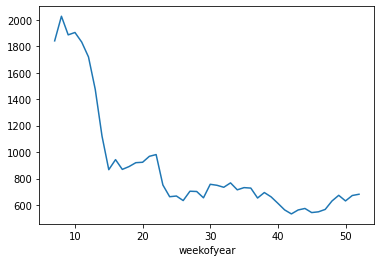

In [ ]:
df_weeks.rolling_mean.plot()

### Expanding Window Feature
The idea behind the expanding window feature is that it takes all the past values into account 累加的window



In [ ]:
df_weeks['expanding_mean'] = df_weeks['userCounts'].expanding(2).mean()
df_weeks.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,lag_1,lag_2,lag_3,lag_4,lag_5,lag_6,lag_7,userCounts,rolling_mean,expanding_mean
weekofyear,,,,,,,,,,
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1256,NaN,NaN
2,1256.0,NaN,NaN,NaN,NaN,NaN,NaN,2402,NaN,1829.000000
3,2402.0,1256.0,NaN,NaN,NaN,NaN,NaN,1555,NaN,1737.666667
4,1555.0,2402.0,1256.0,NaN,NaN,NaN,NaN,1259,NaN,1618.000000
5,1259.0,1555.0,2402.0,1256.0,NaN,NaN,NaN,1246,NaN,1543.600000


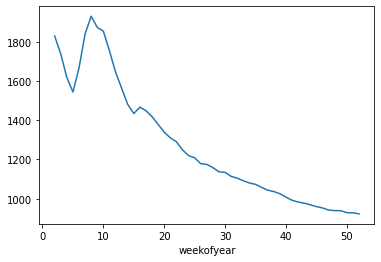

In [ ]:
df_weeks.expanding_mean.plot()

### TSFresh Features

In [ ]:
pip install tsfresh

     |████████████████████████████████| 94 kB 209 kB/s  eta 0:00:01
     |████████████████████████████████| 1.2 MB 31.8 MB/s eta 0:00:01
     |████████████████████████████████| 231 kB 80.2 MB/s eta 0:00:01
     |████████████████████████████████| 113 kB 90.4 MB/s eta 0:00:01
     |████████████████████████████████| 9.4 MB 30.1 MB/s eta 0:00:01
     |████████████████████████████████| 1.3 MB 64.9 MB/s eta 0:00:01
ERROR: tensorflow 2.5.0 has requirement numpy~=1.19.2, but you'll have numpy 1.21.1 which is incompatible.
ERROR: tensorflow-gpu 2.4.1 has requirement gast==0.3.3, but you'll have gast 0.4.0 which is incompatible.
ERROR: tensorflow-gpu 2.4.1 has requirement grpcio~=1.32.0, but you'll have grpcio 1.34.1 which is incompatible.
ERROR: tensorflow-gpu 2.4.1 has requirement h5py~=2.10.0, but you'll have h5py 3.1.0 which is incompatible.
ERROR: tensorflow-gpu 2.4.1 has requirement numpy~=1.19.2, but you'll have numpy 1.21.1 which is incompatible.
ERROR: tensorflow-gpu 2.4.1 has requireme

In [ ]:
pip install -U scipy 

     |████████████████████████████████| 28.4 MB 49 kB/s s eta 0:00:01
ERROR: datashader 0.11.1 has requirement numba!=0.49.*,!=0.50.*,>=0.37.0, but you'll have numba 0.50.1 which is incompatible.
  Attempting uninstall: scipy
    Found existing installation: scipy 1.5.4
    Uninstalling scipy-1.5.4:
      Successfully uninstalled scipy-1.5.4
ERROR: Could not install packages due to an EnvironmentError: [Errno 16] Device or resource busy: '.nfs00000000004124c20000004b'

Note: you may need to restart the kernel to use updated packages.


In [ ]:
from tsfresh import extract_features, select_features
from tsfresh.utilities.dataframe_functions import impute

NvvmError: Failed to compile

<unnamed> (93, 23): parse expected comma after load's type
NVVM_ERROR_COMPILATION

In [ ]:
# only select users with more than 2 items(tagged movie)
filtered_user = df.groupby('userID').count()['movieID']>2
df_filtered = df[df.userID.isin(filtered_user[filtered_user==True].keys())] # df.time_stamp -> df.timestamps
df_filtered.loc[:,'timestamps'] = df_filtered.loc[:,'timestamps'].apply(pd.to_datetime,format='%Y_%m_%d_%H_%M_%S')
df_filtered = df_filtered.sort_values(by=['userID','timestamps'])
df_filtered.reset_index(drop=True, inplace=True)

In [ ]:
df_filtered

,userID,movieID,tagID,date_day,date_month,date_year,date_hour,date_minute,date_second,y_m,timestamps
0,127,1343,1544,28,8,2007,3,42,27,2007_8,2007-08-28 03:42:27
1,127,1343,12330,28,8,2007,3,42,27,2007_8,2007-08-28 03:42:27
2,127,2080,1451,28,8,2007,3,42,47,2007_8,2007-08-28 03:42:47
3,127,2080,1574,28,8,2007,3,42,47,2007_8,2007-08-28 03:42:47
4,127,7147,146,28,8,2007,3,43,28,2007_8,2007-08-28 03:43:28
...,...,...,...,...,...,...,...,...,...,...,...
46536,71534,8848,427,3,12,2007,3,6,27,2007_12,2007-12-03 03:06:27
46537,71534,7937,306,3,12,2007,3,7,14,2007_12,2007-12-03 03:07:14
46538,71534,25833,7671,3,12,2007,3,7,31,2007_12,2007-12-03 03:07:31
46539,71534,6611,303,3,12,2007,3,9,38,2007_12,2007-12-03 03:09:38


In [ ]:
df_filtered[df_filtered['userID']==127].iloc[:,[0,1,2,10]]

,userID,movieID,tagID,timestamps
0,127,1343,1544,2007-08-28 03:42:27
1,127,1343,12330,2007-08-28 03:42:27
2,127,2080,1451,2007-08-28 03:42:47
3,127,2080,1574,2007-08-28 03:42:47
4,127,7147,146,2007-08-28 03:43:28
5,127,7147,150,2007-08-28 03:43:28
6,127,7147,1878,2007-08-28 03:43:28
7,127,7147,2596,2007-08-28 03:43:28
8,127,7147,13087,2007-08-28 03:43:28
9,127,6934,1537,2007-08-28 03:43:57


In [ ]:
# get the last item of each user-sequence
df_filtered_last = df_filtered.iloc[list(df_filtered.groupby('userID').apply(lambda x: list(x.index)[-1])),:]
df_filtered_last

,userID,movieID,tagID,date_day,date_month,date_year,date_hour,date_minute,date_second,y_m,timestamps
22,127,2953,11860,28,8,2007,3,45,44,2007_8,2007-08-28 03:45:44
48,190,5072,712,16,4,2008,19,1,0,2008_4,2008-04-16 19:01:00
53,325,30818,5074,29,7,2007,0,55,27,2007_7,2007-07-29 00:55:27
57,383,6270,669,24,12,2007,7,38,18,2007_12,2007-12-24 07:38:18
83,477,48774,5585,28,8,2007,17,2,4,2007_8,2007-08-28 17:02:04
...,...,...,...,...,...,...,...,...,...,...,...
46331,71420,52668,1531,12,5,2008,1,21,32,2008_5,2008-05-12 01:21:32
46334,71478,5878,8,21,5,2007,2,17,14,2007_5,2007-05-21 02:17:14
46375,71497,8530,10832,30,9,2007,4,13,58,2007_9,2007-09-30 04:13:58
46503,71509,58490,9928,4,9,2008,16,23,11,2008_9,2008-09-04 16:23:11


In [ ]:
# traning set: removing last item of each user
df_filtered_train = df_filtered[~pd.Series(df_filtered.index).isin(df_filtered_last.index)]

In [ ]:
# df_filtered_train.movieID = df_filtered_train.movieID.apply(str)
# df_filtered_train.tagID = df_filtered_train.tagID.apply(str)
# df_filtered_last.movieID = df_filtered_last.movieID.apply(str)
# df_filtered_last.tagID = df_filtered_last.tagID.apply(str)

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:5170: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [ ]:
# df_filtered_train.iloc[:,[1,2,3,4,5,6,7,8,10]] # only times info
df_filtered.iloc[:,[0,1,2,10]] # only tagging info

,userID,movieID,tagID,timestamps
0,127,1343,1544,2007-08-28 03:42:27
1,127,1343,12330,2007-08-28 03:42:27
2,127,2080,1451,2007-08-28 03:42:47
3,127,2080,1574,2007-08-28 03:42:47
4,127,7147,146,2007-08-28 03:43:28
...,...,...,...,...
46536,71534,8848,427,2007-12-03 03:06:27
46537,71534,7937,306,2007-12-03 03:07:14
46538,71534,25833,7671,2007-12-03 03:07:31
46539,71534,6611,303,2007-12-03 03:09:38


In [ ]:
extracted_features = extract_features(df_filtered_train.iloc[:,[0,1,2,10]], column_id="userID", column_sort="timestamps")

Feature Extraction: 100%|██████████| 5/5 [03:35<00:00, 43.02s/it]


In [ ]:
extracted_features_movie = extract_features(df_filtered_train.iloc[:,[0,1,2,10]], column_id="movieID", column_sort="timestamps")

Feature Extraction: 100%|██████████| 5/5 [10:47<00:00, 129.54s/it]


In [ ]:
extracted_features = impute(extracted_features)
extracted_features_movie = impute(extracted_features_movie)
# extracted_features_movie

In [ ]:
extracted_features

,movieID__variance_larger_than_standard_deviation,movieID__has_duplicate_max,movieID__has_duplicate_min,movieID__has_duplicate,movieID__sum_values,movieID__abs_energy,movieID__mean_abs_change,movieID__mean_change,movieID__mean_second_derivative_central,movieID__median,movieID__mean,movieID__length,movieID__standard_deviation,movieID__variation_coefficient,movieID__variance,movieID__skewness,movieID__kurtosis,movieID__root_mean_square,movieID__absolute_sum_of_changes,movieID__longest_strike_below_mean,movieID__longest_strike_above_mean,movieID__count_above_mean,movieID__count_below_mean,movieID__last_location_of_maximum,movieID__first_location_of_maximum,movieID__last_location_of_minimum,movieID__first_location_of_minimum,movieID__percentage_of_reoccurring_values_to_all_values,movieID__percentage_of_reoccurring_datapoints_to_all_datapoints,movieID__sum_of_reoccurring_values,movieID__sum_of_reoccurring_data_points,movieID__ratio_value_number_to_time_series_length,movieID__sample_entropy,movieID__maximum,movieID__minimum,movieID__benford_correlation,movieID__time_reversal_asymmetry_statistic__lag_1,movieID__time_reversal_asymmetry_statistic__lag_2,movieID__time_reversal_asymmetry_statistic__lag_3,movieID__c3__lag_1,...,tagID__energy_ratio_by_chunks__num_segments_10__segment_focus_4,tagID__energy_ratio_by_chunks__num_segments_10__segment_focus_5,tagID__energy_ratio_by_chunks__num_segments_10__segment_focus_6,tagID__energy_ratio_by_chunks__num_segments_10__segment_focus_7,tagID__energy_ratio_by_chunks__num_segments_10__segment_focus_8,tagID__energy_ratio_by_chunks__num_segments_10__segment_focus_9,tagID__ratio_beyond_r_sigma__r_0.5,tagID__ratio_beyond_r_sigma__r_1,tagID__ratio_beyond_r_sigma__r_1.5,tagID__ratio_beyond_r_sigma__r_2,tagID__ratio_beyond_r_sigma__r_2.5,tagID__ratio_beyond_r_sigma__r_3,tagID__ratio_beyond_r_sigma__r_5,tagID__ratio_beyond_r_sigma__r_6,tagID__ratio_beyond_r_sigma__r_7,tagID__ratio_beyond_r_sigma__r_10,tagID__count_above__t_0,tagID__count_below__t_0,tagID__lempel_ziv_complexity__bins_2,tagID__lempel_ziv_complexity__bins_3,tagID__lempel_ziv_complexity__bins_5,tagID__lempel_ziv_complexity__bins_10,tagID__lempel_ziv_complexity__bins_100,tagID__fourier_entropy__bins_2,tagID__fourier_entropy__bins_3,tagID__fourier_entropy__bins_5,tagID__fourier_entropy__bins_10,tagID__fourier_entropy__bins_100,tagID__permutation_entropy__dimension_3__tau_1,tagID__permutation_entropy__dimension_4__tau_1,tagID__permutation_entropy__dimension_5__tau_1,tagID__permutation_entropy__dimension_6__tau_1,tagID__permutation_entropy__dimension_7__tau_1,tagID__query_similarity_count__query_None__threshold_0.0,"tagID__matrix_profile__feature_""min""__threshold_0.98","tagID__matrix_profile__feature_""max""__threshold_0.98","tagID__matrix_profile__feature_""mean""__threshold_0.98","tagID__matrix_profile__feature_""median""__threshold_0.98","tagID__matrix_profile__feature_""25""__threshold_0.98","tagID__matrix_profile__feature_""75""__threshold_0.98"
127,1.0,1.0,1.0,1.0,119762.0,7.716803e+08,873.714286,76.666667,-32.925000,6306.5,5443.727273,22.0,2332.855004,0.428540,5.442212e+06,-0.402958,-1.082536,5922.531477,18348.0,4.0,9.0,12.0,10.0,0.863636,0.727273,0.090909,0.000000,0.777778,0.909091,34843.0,111130.0,0.409091,0.510826,8622.0,1343.0,-0.085692,1.048135e+09,1.773257e+10,3.950084e+10,2.296030e+11,...,0.006029,0.000702,0.013511,0.164900,0.219452,0.056341,0.727273,0.227273,0.181818,0.090909,0.000000,0.000000,0.000000,0.000000,0.0,0.0,1.0,0.0,0.272727,0.409091,0.454545,0.636364,0.818182,0.450561,0.867563,1.234268,1.473502,2.484907,1.735434,2.479122,2.736339,2.833213,2.772589,0.0,1.237737,3.851122,2.767433,2.785136,2.434140,3.175561
190,1.0,0.0,0.0,0.0,248657.0,5.036226e+09,9219.375000,857.291667,-29.173913,5952.0,9946.280000,25.0,10125.243181,1.017993,1.025205e+08,1.501995,0.587383,14193.274299,221265.0,9.0,2.0,5.0,20.0,0.640000,0.600000,0.720000,0.680000,0.000000,0.000000,0.0,0.0,1.000000,1.041454,31660.0,741.0,-0.046942,1.044544e+12,6.372259e+

In [ ]:
features_filtered = select_features(extracted_features_movie, df_filtered_last.set_index('userID').movieID)

,date_day__variance_larger_than_standard_deviation,date_day__has_duplicate_max,date_day__has_duplicate_min,date_day__has_duplicate,date_day__sum_values,date_day__abs_energy,date_day__mean_abs_change,date_day__mean_change,date_day__mean_second_derivative_central,date_day__median,date_day__mean,date_day__length,date_day__standard_deviation,date_day__variation_coefficient,date_day__variance,date_day__skewness,date_day__kurtosis,date_day__root_mean_square,date_day__absolute_sum_of_changes,date_day__longest_strike_below_mean,date_day__longest_strike_above_mean,date_day__count_above_mean,date_day__count_below_mean,date_day__last_location_of_maximum,date_day__first_location_of_maximum,date_day__last_location_of_minimum,date_day__first_location_of_minimum,date_day__percentage_of_reoccurring_values_to_all_values,date_day__percentage_of_reoccurring_datapoints_to_all_datapoints,date_day__sum_of_reoccurring_values,date_day__sum_of_reoccurring_data_points,date_day__ratio_value_number_to_time_series_length,date_day__sample_entropy,date_day__maximum,date_day__minimum,date_day__benford_correlation,date_day__time_reversal_asymmetry_statistic__lag_1,date_day__time_reversal_asymmetry_statistic__lag_2,date_day__time_reversal_asymmetry_statistic__lag_3,date_day__c3__lag_1,...,date_second__energy_ratio_by_chunks__num_segments_10__segment_focus_4,date_second__energy_ratio_by_chunks__num_segments_10__segment_focus_5,date_second__energy_ratio_by_chunks__num_segments_10__segment_focus_6,date_second__energy_ratio_by_chunks__num_segments_10__segment_focus_7,date_second__energy_ratio_by_chunks__num_segments_10__segment_focus_8,date_second__energy_ratio_by_chunks__num_segments_10__segment_focus_9,date_second__ratio_beyond_r_sigma__r_0.5,date_second__ratio_beyond_r_sigma__r_1,date_second__ratio_beyond_r_sigma__r_1.5,date_second__ratio_beyond_r_sigma__r_2,date_second__ratio_beyond_r_sigma__r_2.5,date_second__ratio_beyond_r_sigma__r_3,date_second__ratio_beyond_r_sigma__r_5,date_second__ratio_beyond_r_sigma__r_6,date_second__ratio_beyond_r_sigma__r_7,date_second__ratio_beyond_r_sigma__r_10,date_second__count_above__t_0,date_second__count_below__t_0,date_second__lempel_ziv_complexity__bins_2,date_second__lempel_ziv_complexity__bins_3,date_second__lempel_ziv_complexity__bins_5,date_second__lempel_ziv_complexity__bins_10,date_second__lempel_ziv_complexity__bins_100,date_second__fourier_entropy__bins_2,date_second__fourier_entropy__bins_3,date_second__fourier_entropy__bins_5,date_second__fourier_entropy__bins_10,date_second__fourier_entropy__bins_100,date_second__permutation_entropy__dimension_3__tau_1,date_second__permutation_entropy__dimension_4__tau_1,date_second__permutation_entropy__dimension_5__tau_1,date_second__permutation_entropy__dimension_6__tau_1,date_second__permutation_entropy__dimension_7__tau_1,date_second__query_similarity_count__query_None__threshold_0.0,"date_second__matrix_profile__feature_""min""__threshold_0.98","date_second__matrix_profile__feature_""max""__threshold_0.98","date_second__matrix_profile__feature_""mean""__threshold_0.98","date_second__matrix_profile__feature_""median""__threshold_0.98","date_second__matrix_profile__feature_""25""__threshold_0.98","date_second__matrix_profile__feature_""75""__threshold_0.98"
1,1.0,1.0,1.0,1.0,1044.0,22074.0,4.107692,0.230769,0.000000,13.5,15.818182,66.0,9.178217,0.580232,84.239669,0.156011,-1.273669,18.288098,267.0,12.0,15.0,31.0,35.0,0.939394,0.833333,0.424242,0.363636,0.578947,0.878788,162.0,908.0,0.287879,0.748717,30.0,1.0,0.752359,544.015625,581.516129,1039.766667,6341.125000,...,0.090745,0.152880,0.115947,0.200418,0.078484,0.056554,0.772727,0.409091,0.136364,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,1.0,0.045455,0.181818,0.333333,0.424242,0.515152,0.742424,0.298436,0.428368,0.644482,1.278159,2.893975,1.625660,2.752684,3.545184,3.819394,3.978820,0.0,1.19547,3.760526,2.433382,2.408835,2.099711,2.806919
10,1.0,0.0,1.0,1.0,437.0,10751.0,5.761905,-0.523810,0.600000,19.0,19.863636,22.0,9.701431,0.48

In [ ]:
features_filtered

,tagID__ratio_beyond_r_sigma__r_3,tagID__number_peaks__n_50,movieID__number_peaks__n_50,movieID__number_crossing_m__m_1,movieID__value_count__value_1,movieID__ratio_beyond_r_sigma__r_5,movieID__ratio_beyond_r_sigma__r_6,tagID__ratio_beyond_r_sigma__r_5,movieID__ratio_beyond_r_sigma__r_7,tagID__ratio_beyond_r_sigma__r_6,tagID__autocorrelation__lag_0,movieID__autocorrelation__lag_0,"tagID__fft_coefficient__attr_""imag""__coeff_44","tagID__fft_coefficient__attr_""imag""__coeff_37","movieID__fft_coefficient__attr_""imag""__coeff_91","tagID__fft_coefficient__attr_""imag""__coeff_63","tagID__fft_coefficient__attr_""imag""__coeff_56","tagID__fft_coefficient__attr_""imag""__coeff_48","tagID__fft_coefficient__attr_""imag""__coeff_29","tagID__fft_coefficient__attr_""abs""__coeff_99","movieID__fft_coefficient__attr_""abs""__coeff_99","tagID__fft_coefficient__attr_""angle""__coeff_99","movieID__fft_coefficient__attr_""angle""__coeff_99","movieID__fft_coefficient__attr_""real""__coeff_99","movieID__fft_coefficient__attr_""imag""__coeff_99","tagID__fft_coefficient__attr_""imag""__coeff_99","tagID__fft_coefficient__attr_""real""__coeff_99","movieID__fft_coefficient__attr_""imag""__coeff_98","movieID__fft_coefficient__attr_""angle""__coeff_97","movieID__fft_coefficient__attr_""angle""__coeff_96","tagID__fft_coefficient__attr_""real""__coeff_98","tagID__fft_coefficient__attr_""real""__coeff_97","movieID__fft_coefficient__attr_""angle""__coeff_92","movieID__fft_coefficient__attr_""abs""__coeff_98","tagID__fft_coefficient__attr_""imag""__coeff_98","tagID__fft_coefficient__attr_""imag""__coeff_97","movieID__fft_coefficient__attr_""imag""__coeff_92","movieID__fft_coefficient__attr_""imag""__coeff_97","movieID__fft_coefficient__attr_""abs""__coeff_96","movieID__fft_coefficient__attr_""abs""__coeff_95",...,"tagID__fft_coefficient__attr_""imag""__coeff_34","tagID__fft_coefficient__attr_""angle""__coeff_34","tagID__fft_coefficient__attr_""real""__coeff_34","movieID__fft_coefficient__attr_""imag""__coeff_34","movieID__fft_coefficient__attr_""real""__coeff_34","tagID__fft_coefficient__attr_""abs""__coeff_34","movieID__fft_coefficient__attr_""angle""__coeff_34","movieID__fft_coefficient__attr_""abs""__coeff_34","tagID__fft_coefficient__attr_""imag""__coeff_33","tagID__fft_coefficient__attr_""angle""__coeff_33","movieID__fft_coefficient__attr_""imag""__coeff_33","movieID__fft_coefficient__attr_""real""__coeff_33","tagID__fft_coefficient__attr_""abs""__coeff_33","tagID__fft_coefficient__attr_""real""__coeff_33","movieID__fft_coefficient__attr_""angle""__coeff_33","movieID__fft_coefficient__attr_""abs""__coeff_33","tagID__fft_coefficient__attr_""imag""__coeff_32","tagID__fft_coefficient__attr_""angle""__coeff_32","movieID__fft_coefficient__attr_""imag""__coeff_32","movieID__fft_coefficient__attr_""angle""__coeff_32","movieID__fft_coefficient__attr_""real""__coeff_32","tagID__fft_coefficient__attr_""real""__coeff_32","movieID__fft_coefficient__attr_""abs""__coeff_32","tagID__fft_coefficient__attr_""abs""__coeff_32","tagID__fft_coefficient__attr_""imag""__coeff_31","movieID__fft_coefficient__attr_""angle""__coeff_31","tagID__fft_coefficient__attr_""real""__coeff_31","tagID__fft_coefficient__attr_""abs""__coeff_31","tagID__fft_coefficient__attr_""angle""__coeff_31","movieID__fft_coefficient__attr_""abs""__coeff_31","movieID__fft_coefficient__attr_""real""__coeff_31","movieID__fft_coefficient__attr_""imag""__coeff_31","tagID__fft_coefficient__attr_""imag""__coeff_30","movieID__fft_coefficient__attr_""angle""__coeff_30","tagID__fft_coefficient__attr_""real""__coeff_30","tagID__fft_coefficient__attr_""abs""__coeff_30","movieID__fft_coefficient__attr_""real""__coeff_30","movieID__fft_coefficient__attr_""abs""__coeff_30","movieID__fft_coefficient__attr_""imag""__coeff_30","tagID__fft_coefficient__attr_""angle""__coeff_30"
127,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,1.0,1.0,0.000000,0.000000,0.0,0.00000,0.000000,0.000000,0.000000,32094.125914,143520.0

#### Store pickles

In [ ]:
import pickle
# with open('/content/drive/MyDrive/PY/TimeSeriesRecSys/Data_HetRec/extracted_features_movie_times.pickle', 'wb') as handle:
#     pickle.dump(extracted_features_movie, handle, protocol=pickle.HIGHEST_PROTOCOL)

# with open('/content/drive/MyDrive/PY/TimeSeriesRecSys/Data_HetRec/features_filtered.pickle', 'wb') as handle:
#     pickle.dump(features_filtered, handle, protocol=pickle.HIGHEST_PROTOCOL)

# with open('/content/drive/MyDrive/PY/TimeSeriesRecSys/Data_HetRec/df_filtered.pickle', 'wb') as handle:
#     pickle.dump(df_filtered, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
with open('/content/drive/MyDrive/PY/TimeSeriesRecSys/Data_HetRec/extracted_features_times.pickle', 'rb') as handle:
    extracted_features = pickle.load(handle)

with open('/content/drive/MyDrive/PY/TimeSeriesRecSys/Data_HetRec/extracted_features_movie_times.pickle', 'rb') as handle:
    extracted_features_movie = pickle.load(handle)

In [ ]:
extracted_features.shape, extracted_features_movie.shape

((984, 4722), (5798, 4722))

In [ ]:
import pickle
# with open('/content/drive/MyDrive/PY/TimeSeriesRecSys/Data_HetRec/features_filtered.pickle', 'rb') as handle:
#     features_filtered = pickle.load(handle)

with open('/content/drive/MyDrive/PY/TimeSeriesRecSys/Data_HetRec/df_filtered.pickle', 'rb') as handle:
    df_filtered = pickle.load(handle)

In [ ]:
# alternative way
from tsfresh import extract_relevant_features

# features_filtered_direct = extract_relevant_features(timeseries, y, column_id='id', column_sort='time')

In [ ]:
# examples
# from tsfresh.examples.robot_execution_failures import download_robot_execution_failures, \
#     load_robot_execution_failures
# download_robot_execution_failures()
# timeseries, y = load_robot_execution_failures()

#### Clustering with TSFresh Features

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
vectors = PCA(n_components=2).fit_transform(extracted_features) #高维度PCA降维到2维
# del extracted_features

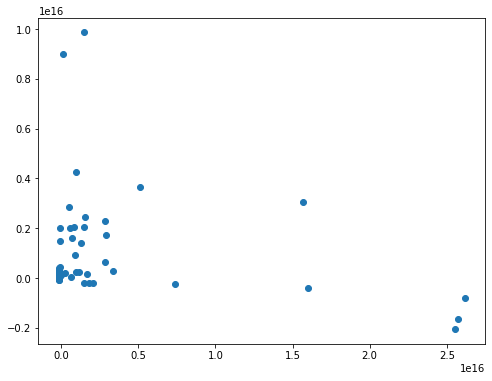

In [ ]:
plt.rcParams["figure.figsize"] = (8, 6)
plt.scatter(vectors[:,0],vectors[:,1]) # movie

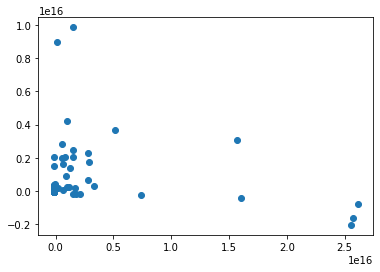

In [ ]:
plt.scatter(vectors[:,0],vectors[:,1]) # user

In [ ]:
estimator = KMeans(n_clusters=100,random_state=0)#构造聚类器
estimator.fit(vectors)#聚类
label_pred = estimator.labels_ #获取聚类标签
centroids = estimator.cluster_centers_ #获取聚类中心
inertia = estimator.inertia_ # 获取聚类准则的总和


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: ConvergenceWarning: Number of distinct clusters (71) found smaller than n_clusters (100). Possibly due to duplicate points in X.
  


In [ ]:
import pandas as pd
res = pd.DataFrame(vectors)
res['label'] = label_pred

In [ ]:
res.groupby('label').count()[0] # movie

label
0    5749
1       4
2       7
3      37
4       1
Name: 0, dtype: int64

In [ ]:
res.groupby('label').count()[0] #user

label
0     651
1       1
2       1
3       1
4       1
     ... 
66      1
67      1
69      1
70      1
71    263
Name: 0, Length: 71, dtype: int64

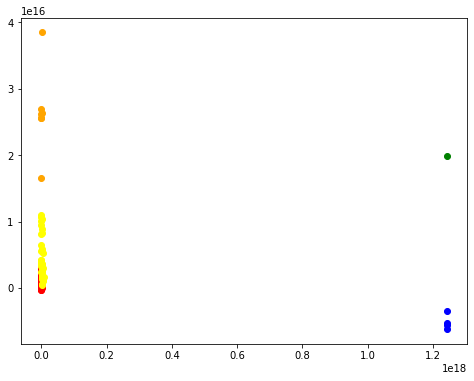

In [ ]:
# movie
plt.scatter(res[res.label==0][0],res[res.label==0][1],color='red')
plt.scatter(res[res.label==1][0],res[res.label==1][1],color='blue')
plt.scatter(res[res.label==2][0],res[res.label==2][1],color='orange')
plt.scatter(res[res.label==3][0],res[res.label==3][1],color='yellow')
plt.scatter(res[res.label==4][0],res[res.label==4][1],color='green')

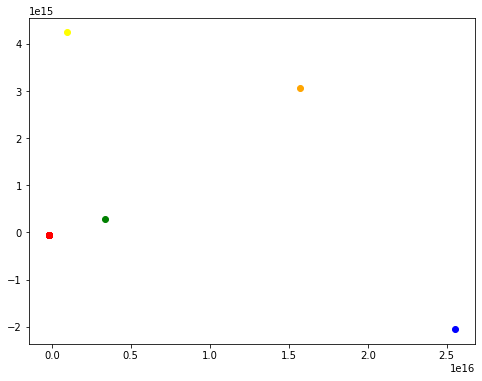

In [ ]:
# user
plt.scatter(res[res.label==0][0],res[res.label==0][1],color='red')
plt.scatter(res[res.label==1][0],res[res.label==1][1],color='blue')
plt.scatter(res[res.label==2][0],res[res.label==2][1],color='orange')
plt.scatter(res[res.label==3][0],res[res.label==3][1],color='yellow')
plt.scatter(res[res.label==4][0],res[res.label==4][1],color='green')

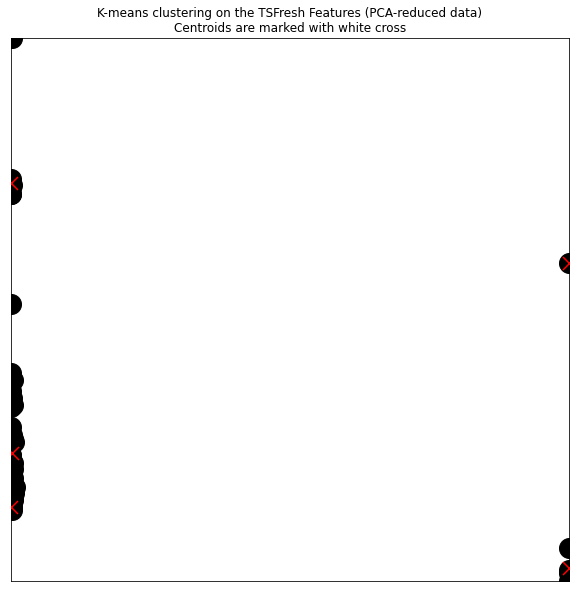

In [ ]:
# movie
x_min, x_max = vectors[:, 0].min() - 1, vectors[:, 0].max() + 1
y_min, y_max = vectors[:, 1].min() - 1, vectors[:, 1].max() + 1

plt.rcParams["figure.figsize"] = (10, 10)


plt.plot(vectors[:, 0], vectors[:, 1], 'k.', markersize=40)
# Plot the centroids as a white X
centroids = estimator.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1],
            marker='x', s=169, linewidths=3,
            color='red', zorder=10)
plt.title('K-means clustering on the TSFresh Features (PCA-reduced data)\n'
          'Centroids are marked with white cross')

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())
plt.show()


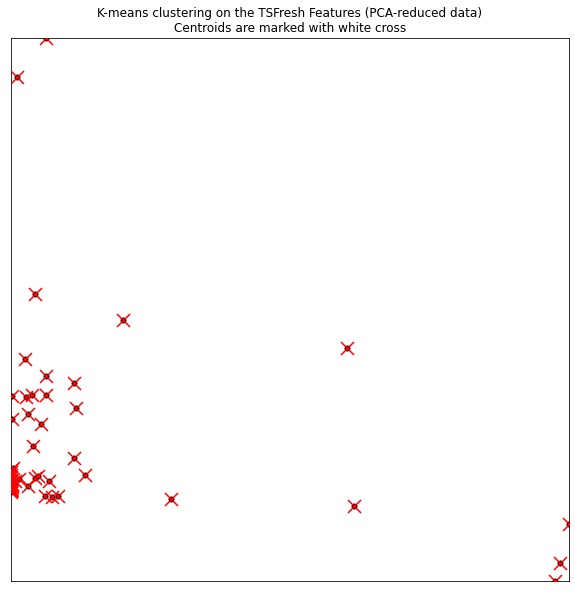

In [ ]:
# user
# movie
x_min, x_max = vectors[:, 0].min() - 1, vectors[:, 0].max() + 1
y_min, y_max = vectors[:, 1].min() - 1, vectors[:, 1].max() + 1

plt.rcParams["figure.figsize"] = (10, 10)


plt.plot(vectors[:, 0], vectors[:, 1], 'k.', markersize=10)
# Plot the centroids as a white X
centroids = estimator.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1],
            marker='x', s=169, linewidths=3,
            color='red', zorder=10)
plt.title('K-means clustering on the TSFresh Features (PCA-reduced data)\n'
          'Centroids are marked with white cross')

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())
plt.show()


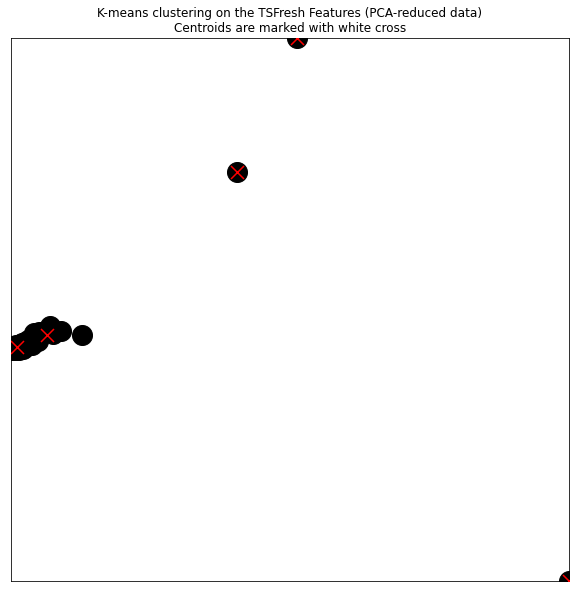

In [ ]:
# origin tsfresh

# Rating data

In [ ]:
import pickle
with open('/content/drive/MyDrive/PY/TimeSeriesRecSys/Data_HetRec/df.pickle', 'rb') as handle:
    df = pickle.load(handle).iloc[:,:-2]

In [ ]:
df.loc[:,'y_m'] = [str(df['date_year'][i])+'_'+str(df['date_month'][i]) for i in range(len(df))]
df

,userID,movieID,rating,date_day,date_month,date_year,date_hour,date_minute,date_second,time_stamp,y_m
628154,51198,608,5.0,17,9,1997,23,40,20,1997-09-17 23:40:20,2006_10
628167,51198,1073,4.0,17,9,1997,23,41,6,1997-09-17 23:41:06,2006_10
628132,51198,141,4.0,17,9,1997,23,41,58,1997-09-17 23:41:58,2006_10
628141,51198,356,4.0,17,9,1997,23,43,44,1997-09-17 23:43:44,2006_10
628180,51198,1198,5.0,17,9,1997,23,44,35,1997-09-17 23:44:35,2006_10
...,...,...,...,...,...,...,...,...,...,...,...
719246,60002,58998,3.5,5,1,2009,4,20,2,2009-01-05 04:20:02,2007_12
810291,68151,65133,5.0,5,1,2009,5,29,53,2009-01-05 05:29:53,2007_12
484762,38726,64620,4.0,5,1,2009,5,30,54,2009-01-05 05:30:54,2007_12
716620,59557,3262,5.0,5,1,2009,5,31,47,2009-01-05 05:31:47,2008_10


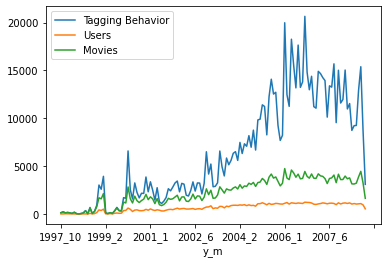

In [ ]:
plt.rcParams["figure.figsize"] = (6, 4)
df.groupby('y_m').count()['userID'].plot()
df.groupby('y_m').userID.nunique().plot()
df.groupby('y_m').movieID.nunique().plot()
plt.legend(['Tagging Behavior','Users','Movies'])

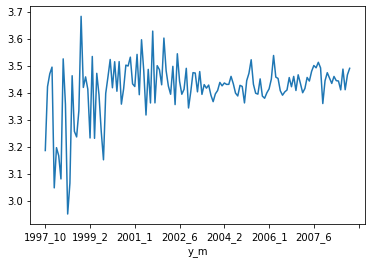

In [ ]:
df.groupby('y_m').rating.mean().plot()

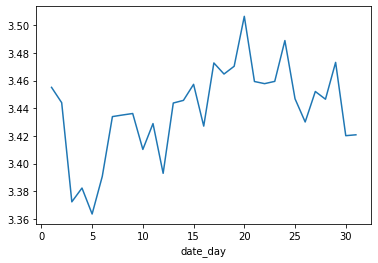

In [ ]:
df.groupby('date_day').rating.mean().plot()

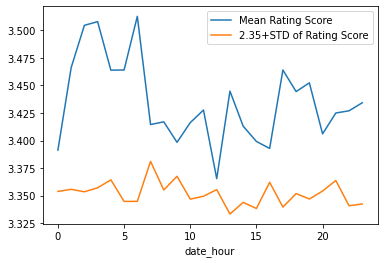

In [ ]:
df.groupby('date_hour').rating.mean().plot()
(df.groupby('date_hour').rating.std()+2.35).plot()
plt.legend(['Mean Rating Score','2.35+STD of Rating Score'])

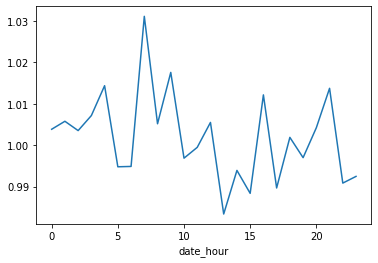

In [ ]:
df.groupby('date_hour').rating.std().plot()

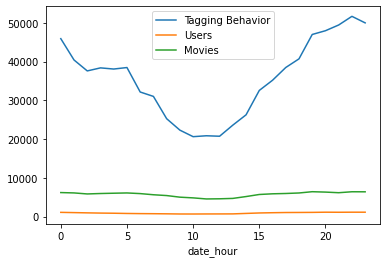

In [ ]:
df.groupby('date_hour').count()['userID'].plot()
df.groupby('date_hour').userID.nunique().plot()
df.groupby('date_hour').movieID.nunique().plot()
plt.legend(['Tagging Behavior','Users','Movies'])

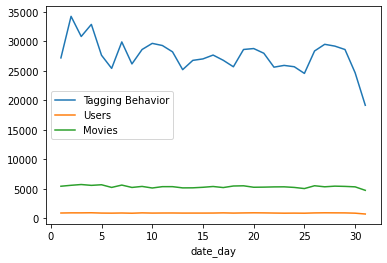

In [ ]:
df.groupby('date_day').count()['userID'].plot()
df.groupby('date_day').userID.nunique().plot()
df.groupby('date_day').movieID.nunique().plot()
plt.legend(['Tagging Behavior','Users','Movies'])

## TSFresh Features+Rating

In [ ]:
filtered_user = df.groupby('userID').count()['movieID']>2 # only include users with more than 2 items
df_filtered = df[df.userID.isin(filtered_user[filtered_user==True].keys())] # df.time_stamp -> df.timestamps
df_filtered = df_filtered.sort_values(by=['time_stamp'])
df_filtered.reset_index(drop=True, inplace=True)
del(df)
df_filtered

,userID,movieID,rating,date_day,date_month,date_year,date_hour,date_minute,date_second,time_stamp
0,51198,608,5.0,17,9,1997,23,40,20,1997-09-17 23:40:20
1,51198,1073,4.0,17,9,1997,23,41,6,1997-09-17 23:41:06
2,51198,141,4.0,17,9,1997,23,41,58,1997-09-17 23:41:58
3,51198,356,4.0,17,9,1997,23,43,44,1997-09-17 23:43:44
4,51198,1198,5.0,17,9,1997,23,44,35,1997-09-17 23:44:35
...,...,...,...,...,...,...,...,...,...,...
855593,60002,58998,3.5,5,1,2009,4,20,2,2009-01-05 04:20:02
855594,68151,65133,5.0,5,1,2009,5,29,53,2009-01-05 05:29:53
855595,38726,64620,4.0,5,1,2009,5,30,54,2009-01-05 05:30:54
855596,59557,3262,5.0,5,1,2009,5,31,47,2009-01-05 05:31:47


In [ ]:
df_filtered =  df_filtered.sample(n=10000, random_state=1)
df_filtered = df_filtered.sort_values(by=['time_stamp'])
df_filtered.reset_index(drop=True, inplace=True)
#随机ID变换为递增的ID
df_filtered['userID'] = df_filtered.userID.astype('category').cat.codes.values
df_filtered['movieID'] = df_filtered.movieID.astype('category').cat.codes.values
df_filtered

,userID,movieID,rating,date_day,date_month,date_year,date_hour,date_minute,date_second,time_stamp
0,780,254,3.0,21,9,1997,15,28,56,1997-09-21 15:28:56
1,780,205,3.0,22,10,1997,15,51,45,1997-10-22 15:51:45
2,216,631,2.0,10,11,1997,15,11,48,1997-11-10 15:11:48
3,216,281,3.0,10,11,1997,15,28,28,1997-11-10 15:28:28
4,241,321,3.0,11,11,1997,14,2,19,1997-11-11 14:02:19
...,...,...,...,...,...,...,...,...,...,...
9995,1361,1682,4.0,4,1,2009,19,22,47,2009-01-04 19:22:47
9996,1531,524,3.5,4,1,2009,21,5,55,2009-01-04 21:05:55
9997,1531,3130,4.0,4,1,2009,21,10,49,2009-01-04 21:10:49
9998,441,2088,3.5,5,1,2009,1,11,28,2009-01-05 01:11:28


In [ ]:
# 按照时间顺序分割数据集为train/test set
train_size = int(len(df_filtered) * 0.8)
train, test = df_filtered.iloc[:train_size,:], df_filtered.iloc[train_size:,:]

train.reset_index(drop=True, inplace=True)
test.reset_index(drop=True, inplace=True)

train.shape, test.shape

((8000, 11), (2000, 11))

In [ ]:
len([i for i in test.userID.unique() if i not in train.userID.unique()]) #test中新出现的user

359

In [ ]:
len([i for i in test.movieID.unique() if i not in train.movieID.unique()]) #test中新出现的movie

383

In [ ]:
train.iloc[:,[0,3,4,5,6,9]]

,userID,date_day,date_month,date_year,date_hour,time_stamp
0,780,21,9,1997,15,1997-09-21 15:28:56
1,780,22,10,1997,15,1997-10-22 15:51:45
2,216,10,11,1997,15,1997-11-10 15:11:48
3,216,10,11,1997,15,1997-11-10 15:28:28
4,241,11,11,1997,14,1997-11-11 14:02:19
...,...,...,...,...,...,...
7995,277,16,10,2007,16,2007-10-16 16:09:08
7996,238,17,10,2007,6,2007-10-17 06:31:41
7997,283,17,10,2007,9,2007-10-17 09:07:23
7998,283,17,10,2007,9,2007-10-17 09:15:17


In [ ]:
# extracted_features_u = extract_features(train.iloc[:,[0,3,4,5,6,9]], column_id="userID", column_sort="time_stamp")
# extracted_features_u = impute(extracted_features_u)

# extracted_features_m = extract_features(train.iloc[:,[1,3,4,5,6,9]], column_id="movieID", column_sort="time_stamp")
# extracted_features_m = impute(extracted_features_m)


Feature Extraction: 100%|██████████| 5/5 [05:35<00:00, 67.03s/it]
/usr/local/lib/python3.7/dist-packages/tsfresh/utilities/dataframe_functions.py:172: RuntimeWarning: The columns ['date_day__fft_coefficient__attr_"real"__coeff_18'
 'date_day__fft_coefficient__attr_"real"__coeff_19'
 'date_day__fft_coefficient__attr_"real"__coeff_20' ...
 'date_hour__agg_linear_trend__attr_"stderr"__chunk_len_50__f_agg_"mean"'
 'date_hour__agg_linear_trend__attr_"stderr"__chunk_len_50__f_agg_"var"'
 'date_hour__query_similarity_count__query_None__threshold_0.0'] did not have any finite values. Filling with zeros.
  df.iloc[:, np.where(is_col_non_finite)[0]].columns.values), RuntimeWarning)

Feature Extraction: 100%|██████████| 5/5 [07:54<00:00, 94.99s/it]
/usr/local/lib/python3.7/dist-packages/tsfresh/utilities/dataframe_functions.py:172: RuntimeWarning: The columns ['date_day__fft_coefficient__attr_"real"__coeff_12'
 'date_day__fft_coefficient__attr_"real"__coeff_13'
 'date_day__fft_coefficient__attr_

In [ ]:
train.userID.nunique(),test.userID.nunique(),df_filtered.userID.nunique()

(1383, 691, 1742)

In [ ]:
extracted_features_u.shape,extracted_features_m.shape

((1383, 3148), (3102, 3148))

### Store Tsfresh to pickle

In [ ]:
# with open('/content/drive/MyDrive/PY/TimeSeriesRecSys/Data_HetRec/Rating8000_extracted_features_u.pickle', 'wb') as handle:
#     pickle.dump(extracted_features_u, handle, protocol=pickle.HIGHEST_PROTOCOL)
# with open('/content/drive/MyDrive/PY/TimeSeriesRecSys/Data_HetRec/Rating8000_extracted_features_m.pickle', 'wb') as handle:
#     pickle.dump(extracted_features_m, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
import pickle
with open('/content/drive/MyDrive/PY/TimeSeriesRecSys/Data_HetRec/Rating8000_extracted_features_u.pickle', 'rb') as handle:
    extracted_features_u = pickle.load(handle)
with open('/content/drive/MyDrive/PY/TimeSeriesRecSys/Data_HetRec/Rating8000_extracted_features_m.pickle', 'rb') as handle:
    extracted_features_m = pickle.load(handle)

In [ ]:
train.userID.nunique(), train.movieID.nunique() 

(1383, 3102)

In [ ]:
extracted_features_u.shape,extracted_features_m.shape

((1383, 3148), (3102, 3148))

In [ ]:
# features_filtered_u = select_features(extracted_features_u, train.set_index('userID').rating)

In [ ]:
# features_filtered_m = select_features(extracted_features_m, train.set_index('userID').rating)

#### Clustering with Scaled rating8000 TSFresh

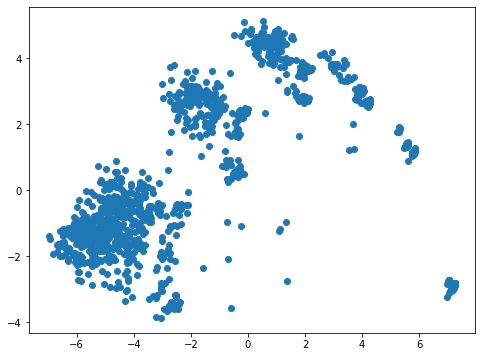

In [ ]:
scaler = MinMaxScaler()
cols = extracted_features_u.columns
extracted_features_u = scaler.fit_transform(extracted_features_u)
extracted_features_u = pd.DataFrame(extracted_features_u)
extracted_features_u.columns = cols
pca = PCA()
vectors_u = pca.fit_transform(extracted_features_u) #高维度PCA降维到2维
plt.rcParams["figure.figsize"] = (8, 6)
plt.scatter(vectors_u[:,0],vectors_u[:,1]) # user

In [ ]:
estimator = KMeans(n_clusters=5,random_state=0)#构造聚类器
estimator.fit(vectors_u)#聚类
label_pred = estimator.labels_ #获取聚类标签
centroids = estimator.cluster_centers_ #获取聚类中心
inertia = estimator.inertia_ # 获取聚类准则的总和
import pandas as pd
res = pd.DataFrame(vectors_u)
res['label'] = label_pred
res.groupby('label').count()[0] # movie

label
0    248
1    580
2    182
3    172
4    201
Name: 0, dtype: int64

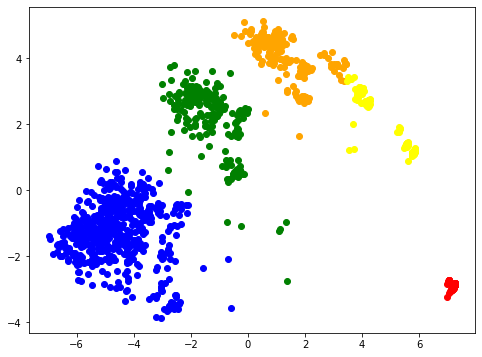

In [ ]:
plt.scatter(res[res.label==0][0],res[res.label==0][1],color='red')
plt.scatter(res[res.label==1][0],res[res.label==1][1],color='blue')
plt.scatter(res[res.label==2][0],res[res.label==2][1],color='orange')
plt.scatter(res[res.label==3][0],res[res.label==3][1],color='yellow')
plt.scatter(res[res.label==4][0],res[res.label==4][1],color='green')

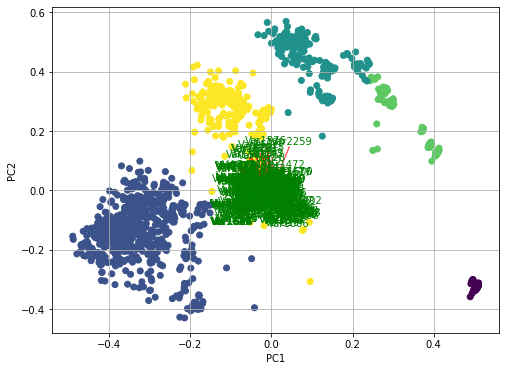

In [ ]:
def myplot(score,coeff,labels=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    plt.scatter(xs * scalex,ys * scaley, c = label_pred)
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'r',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'g', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'g', ha = 'center', va = 'center')
# plt.xlim(-1,1)
# plt.ylim(-0.5,1)
plt.xlabel("PC{}".format(1))
plt.ylabel("PC{}".format(2))
plt.grid()

#Call the function. Use only the 2 PCs.
myplot(vectors_u[:,0:2],np.transpose(pca.components_[0:2, :]))
plt.show()

In [ ]:
def getdf_pca():
  # get the most important features on the PCs 
  n_pcs= pca.components_.shape[0] # 2

  # get the index of the most important feature on EACH component
  # LIST COMPREHENSION HERE
  most_important = [np.abs(pca.components_[i]).argmax() for i in range(n_pcs)]

  initial_feature_names = cols
  # get the names
  most_important_names = [initial_feature_names[most_important[i]] for i in range(n_pcs)]

  # LIST COMPREHENSION HERE AGAIN
  dic = {'PC{}'.format(i): most_important_names[i] for i in range(n_pcs)}

  # build the dataframe
  df_pca = pd.DataFrame(dic.items())
  
  return df_pca
getdf_pca()

,0,1
0,PC0,date_month__symmetry_looking__r_0.5
1,PC1,date_year__has_duplicate_max
2,PC2,date_day__large_standard_deviation__r_0.350000...
3,PC3,date_year__large_standard_deviation__r_0.35000...
4,PC4,date_hour__symmetry_looking__r_0.05
...,...,...
1378,PC1378,"date_month__fft_coefficient__attr_""imag""__coeff_8"
1379,PC1379,date_year__cwt_coefficients__coeff_11__w_20__w...
1380,PC1380,date_month__cwt_coefficients__coeff_9__w_10__w...
1381,PC1381,date_month__cwt_coefficients__coeff_9__w_20__w...


In [ ]:
pca.components_[0]

array([-8.97315797e-02,  2.21421155e-04,  2.44708329e-03, ...,
       -9.38743130e-05, -4.62982881e-05, -1.18109363e-04])

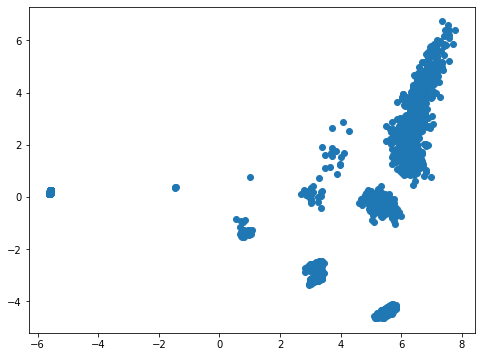

In [ ]:
scaler = MinMaxScaler()
cols = extracted_features_m.columns
extracted_features_m = scaler.fit_transform(extracted_features_m)
extracted_features_m = pd.DataFrame(extracted_features_m)
extracted_features_m.columns = cols
pca = PCA()
vectors_m = pca.fit_transform(extracted_features_m) #高维度PCA降维到2维
plt.rcParams["figure.figsize"] = (8, 6)
plt.scatter(vectors_m[:,0],vectors_m[:,1]) # user

In [ ]:
estimator = KMeans(n_clusters=5,random_state=0)#构造聚类器
estimator.fit(vectors_m)#聚类
label_pred = estimator.labels_ #获取聚类标签
centroids = estimator.cluster_centers_ #获取聚类中心
inertia = estimator.inertia_ # 获取聚类准则的总和
import pandas as pd
res = pd.DataFrame(vectors_m)
res['label'] = label_pred
res.groupby('label').count()[0] # movie

label
0    1535
1     607
2     165
3     460
4     335
Name: 0, dtype: int64

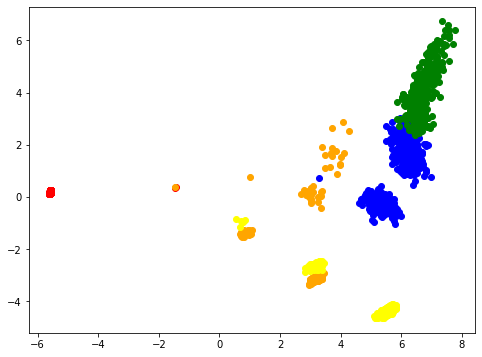

In [ ]:
plt.scatter(res[res.label==0][0],res[res.label==0][1],color='red')
plt.scatter(res[res.label==1][0],res[res.label==1][1],color='blue')
plt.scatter(res[res.label==2][0],res[res.label==2][1],color='orange')
plt.scatter(res[res.label==3][0],res[res.label==3][1],color='yellow')
plt.scatter(res[res.label==4][0],res[res.label==4][1],color='green')

In [ ]:
getdf_pca()

,0,1
0,PC0,date_day__symmetry_looking__r_0.4
1,PC1,date_day__large_standard_deviation__r_0.45
2,PC2,date_year__percentage_of_reoccurring_datapoint...
3,PC3,date_year__energy_ratio_by_chunks__num_segment...
4,PC4,date_hour__median
...,...,...
3097,PC3097,"date_hour__fft_coefficient__attr_""angle""__coef..."
3098,PC3098,"date_hour__fft_coefficient__attr_""angle""__coef..."
3099,PC3099,"date_hour__fft_coefficient__attr_""angle""__coef..."
3100,PC3100,"date_hour__fft_coefficient__attr_""angle""__coef..."


# Time Series Analysis

In [ ]:
df.loc[:,'time_stamp'] = df.iloc[:,[5,4,3,6,7,8]].apply(lambda row: '_'.join(row.values.astype(str)), axis=1)

In [ ]:
df.loc[:,'time_stamp'] = df.loc[:,'time_stamp'].apply(pd.to_datetime,format='%Y_%m_%d_%H_%M_%S')

In [ ]:
# with open('/content/drive/MyDrive/PY/TimeSeriesRecSys/Data_HetRec/df.pickle', 'wb') as handle:
#     pickle.dump(df, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
df

,userID,movieID,rating,date_day,date_month,date_year,date_hour,date_minute,date_second,time_stamp
628154,51198,608,5.0,17,9,1997,23,40,20,1997-09-17 23:40:20
628167,51198,1073,4.0,17,9,1997,23,41,6,1997-09-17 23:41:06
628132,51198,141,4.0,17,9,1997,23,41,58,1997-09-17 23:41:58
628141,51198,356,4.0,17,9,1997,23,43,44,1997-09-17 23:43:44
628180,51198,1198,5.0,17,9,1997,23,44,35,1997-09-17 23:44:35
...,...,...,...,...,...,...,...,...,...,...
719246,60002,58998,3.5,5,1,2009,4,20,2,2009-01-05 04:20:02
810291,68151,65133,5.0,5,1,2009,5,29,53,2009-01-05 05:29:53
484762,38726,64620,4.0,5,1,2009,5,30,54,2009-01-05 05:30:54
716620,59557,3262,5.0,5,1,2009,5,31,47,2009-01-05 05:31:47


In [ ]:
# df = df.set_index('time_stamp')
# df.index

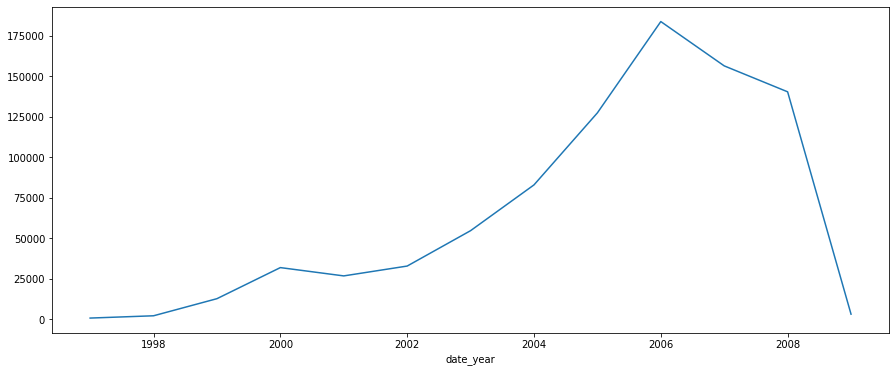

In [ ]:
df.groupby(['date_year']).count()['userID'].plot(figsize=(15, 6))

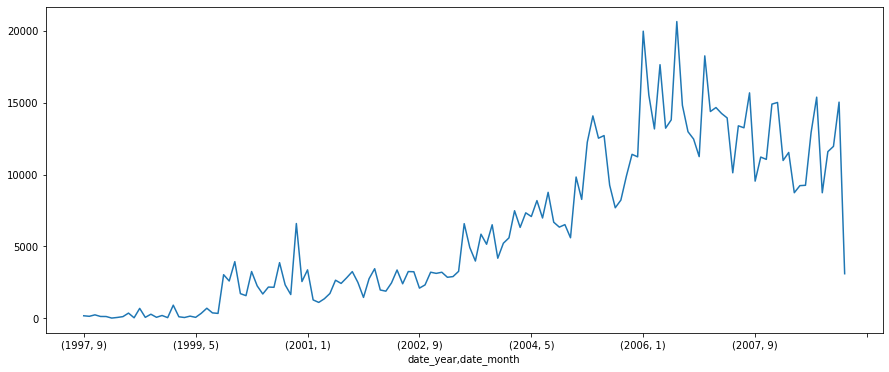

In [ ]:
df.groupby(['date_year','date_month']).count()['userID'].plot(figsize=(15, 6))

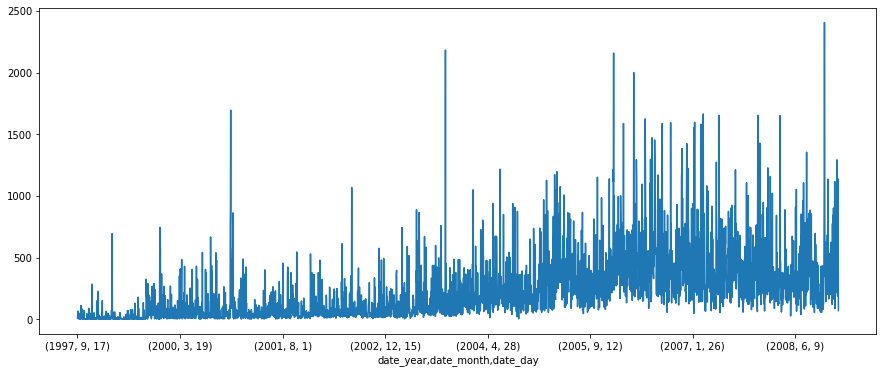

In [ ]:
df.groupby(['date_year','date_month','date_day']).count()['userID'].plot(figsize=(15, 6))

In [ ]:
df.loc[:,'time_ymd'] = df.iloc[:,[5,4,3]].apply(lambda row: '_'.join(row.values.astype(str)), axis=1)
df.loc[:,'time_ymd'] = df.loc[:,'time_ymd'].apply(pd.to_datetime,format='%Y_%m_%d')

In [ ]:
df.loc[:,'time_ym'] = df.iloc[:,[5,4]].apply(lambda row: '_'.join(row.values.astype(str)), axis=1)
df.loc[:,'time_ym'] = df.loc[:,'time_ym'].apply(pd.to_datetime,format='%Y_%m')
df

,userID,movieID,rating,date_day,date_month,date_year,date_hour,date_minute,date_second,time_stamp,time_ymd,time_ym
628154,51198,608,5.0,17,9,1997,23,40,20,1997-09-17 23:40:20,1997-09-17,1997-09-01
628167,51198,1073,4.0,17,9,1997,23,41,6,1997-09-17 23:41:06,1997-09-17,1997-09-01
628132,51198,141,4.0,17,9,1997,23,41,58,1997-09-17 23:41:58,1997-09-17,1997-09-01
628141,51198,356,4.0,17,9,1997,23,43,44,1997-09-17 23:43:44,1997-09-17,1997-09-01
628180,51198,1198,5.0,17,9,1997,23,44,35,1997-09-17 23:44:35,1997-09-17,1997-09-01
...,...,...,...,...,...,...,...,...,...,...,...,...
719246,60002,58998,3.5,5,1,2009,4,20,2,2009-01-05 04:20:02,2009-01-05,2009-01-01
810291,68151,65133,5.0,5,1,2009,5,29,53,2009-01-05 05:29:53,2009-01-05,2009-01-01
484762,38726,64620,4.0,5,1,2009,5,30,54,2009-01-05 05:30:54,2009-01-05,2009-01-01
716620,59557,3262,5.0,5,1,2009,5,31,47,2009-01-05 05:31:47,2009-01-05,2009-01-01


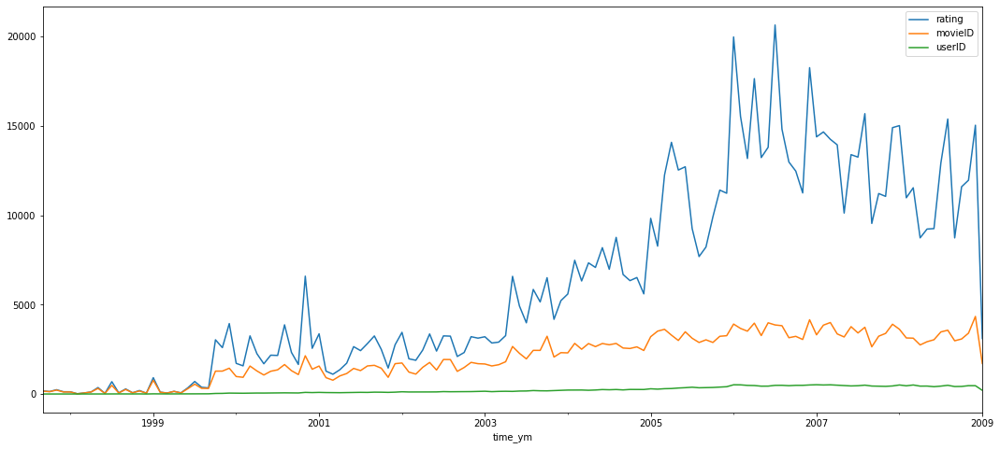

In [ ]:
df.groupby('time_ym').rating.count().plot()
df.groupby('time_ym').movieID.nunique().plot()
df.groupby('time_ym').userID.nunique().plot()
plt.legend()

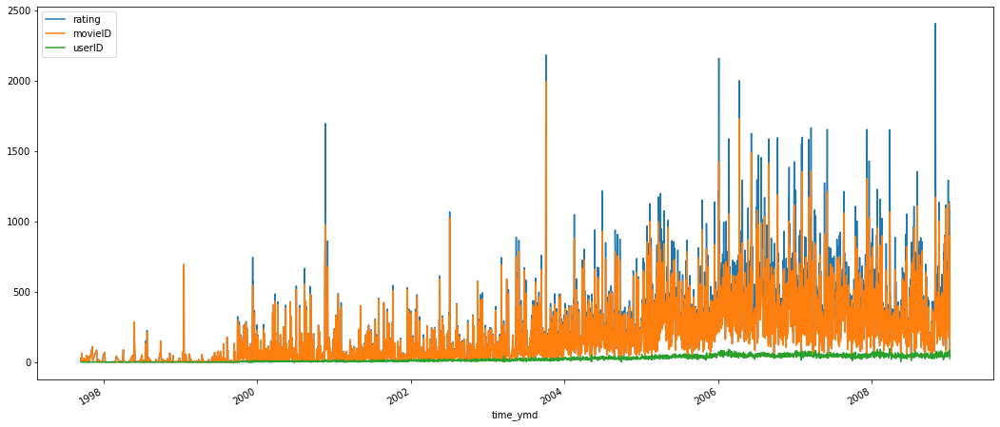

In [ ]:
df.groupby('time_ymd').rating.count().plot()
df.groupby('time_ymd').movieID.nunique().plot()
df.groupby('time_ymd').userID.nunique().plot()
plt.legend()

In [ ]:
df

,userID,movieID,rating,date_day,date_month,date_year,date_hour,date_minute,date_second,time_stamp,time_ymd
628154,51198,608,5.0,17,9,1997,23,40,20,1997-09-17 23:40:20,1997-09-17
628167,51198,1073,4.0,17,9,1997,23,41,6,1997-09-17 23:41:06,1997-09-17
628132,51198,141,4.0,17,9,1997,23,41,58,1997-09-17 23:41:58,1997-09-17
628141,51198,356,4.0,17,9,1997,23,43,44,1997-09-17 23:43:44,1997-09-17
628180,51198,1198,5.0,17,9,1997,23,44,35,1997-09-17 23:44:35,1997-09-17
...,...,...,...,...,...,...,...,...,...,...,...
719246,60002,58998,3.5,5,1,2009,4,20,2,2009-01-05 04:20:02,2009-01-05
810291,68151,65133,5.0,5,1,2009,5,29,53,2009-01-05 05:29:53,2009-01-05
484762,38726,64620,4.0,5,1,2009,5,30,54,2009-01-05 05:30:54,2009-01-05
716620,59557,3262,5.0,5,1,2009,5,31,47,2009-01-05 05:31:47,2009-01-05


In [ ]:
y

time_ym
1997-09-01      179
1997-10-01      143
1997-11-01      244
1997-12-01      131
1998-01-01      128
              ...  
2008-09-01     8736
2008-10-01    11596
2008-11-01    11962
2008-12-01    15039
2009-01-01     3105
Name: userID, Length: 137, dtype: int64

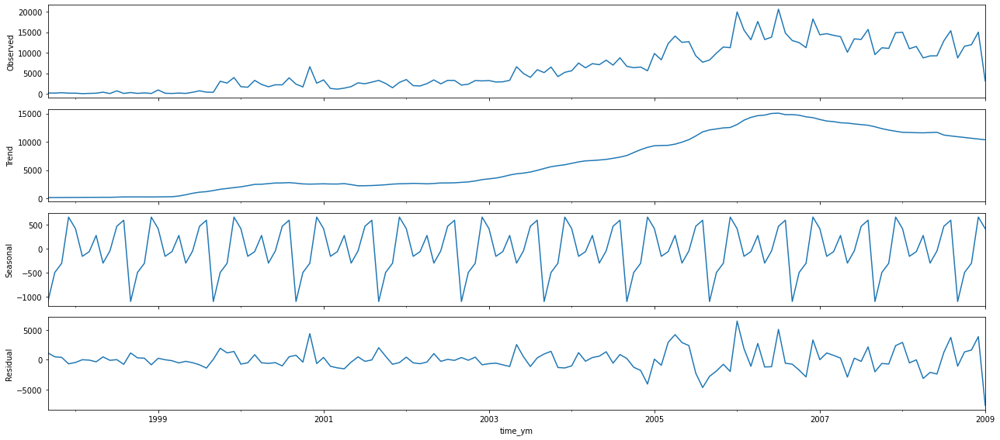

In [ ]:
import statsmodels.api as sm
plt.rcParams['figure.figsize'] = 18, 8
y = df.groupby('time_ym').count()['rating']
decomposition = sm.tsa.seasonal_decompose(y, model='additive',extrapolate_trend='freq') #multiplicative
fig = decomposition.plot()
plt.show()

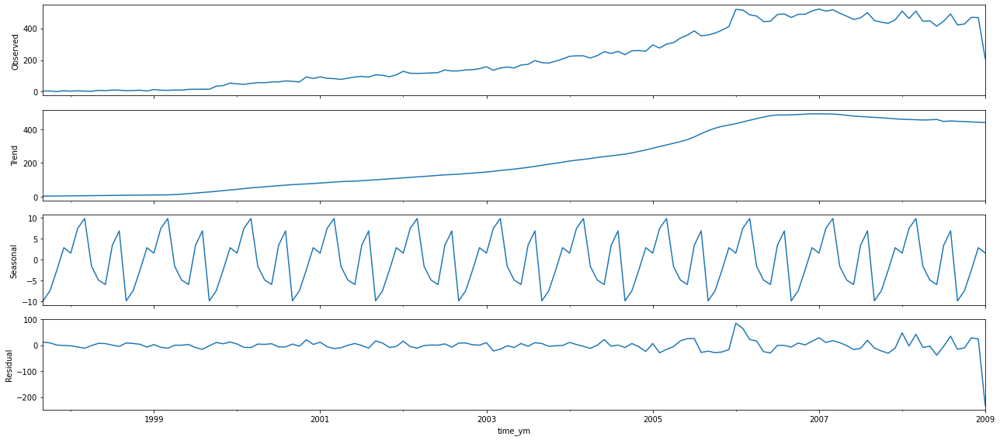

In [ ]:
y = df.groupby('time_ym').userID.nunique()
decomposition = sm.tsa.seasonal_decompose(y,freq=12, model='additive',extrapolate_trend='freq') #multiplicative
fig = decomposition.plot()
plt.show()

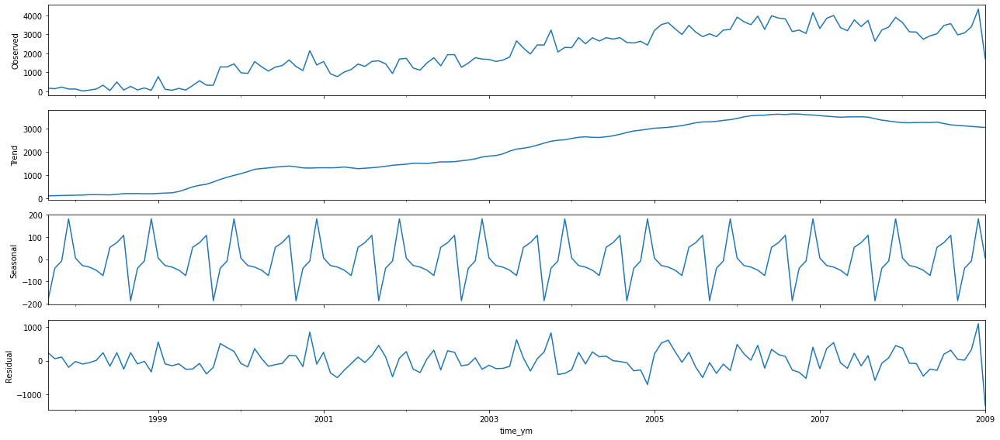

In [ ]:
y = df.groupby('time_ym').movieID.nunique()
decomposition = sm.tsa.seasonal_decompose(y, model='additive',extrapolate_trend='freq') #multiplicative
fig = decomposition.plot()
plt.show()

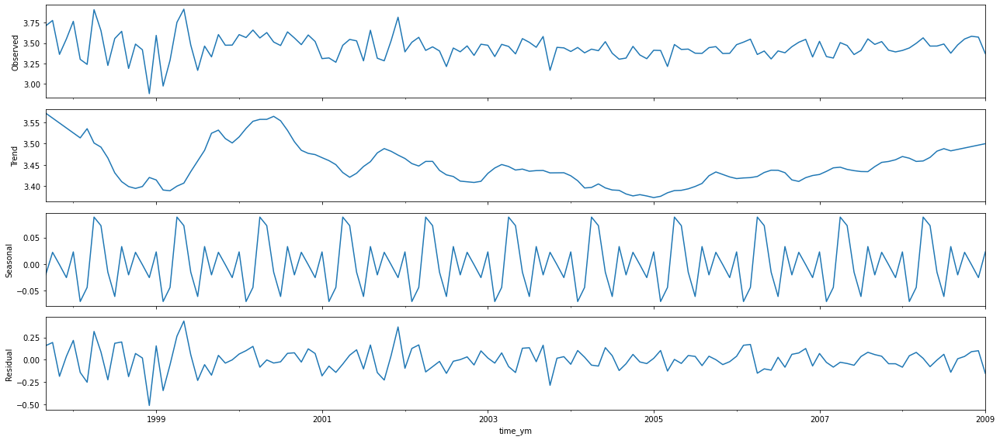

In [ ]:
y = df.groupby('time_ym').rating.mean()
decomposition = sm.tsa.seasonal_decompose(y, model='additive', extrapolate_trend='freq') #multiplicative
fig = decomposition.plot()
plt.show()

## Two-movie examples

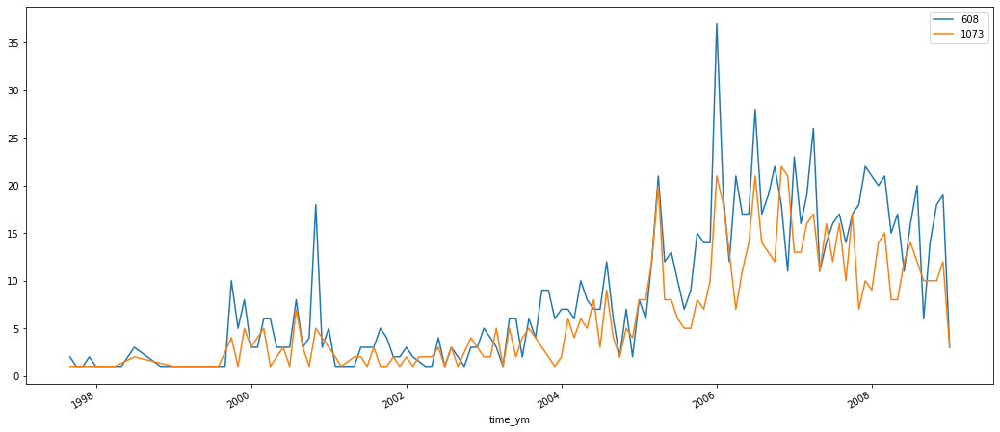

In [ ]:
df[df['movieID']==608].groupby('time_ym').rating.count().plot()
df[df['movieID']==1073].groupby('time_ym').rating.count().plot()
plt.legend(['608','1073'])

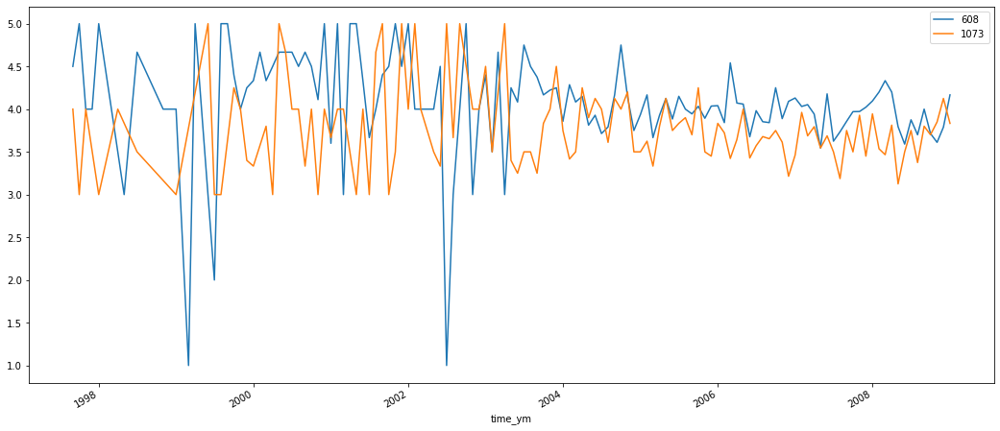

In [ ]:
df[df['movieID']==608].groupby('time_ym').rating.mean().plot()
df[df['movieID']==1073].groupby('time_ym').rating.mean().plot()
plt.legend(['608','1073'])

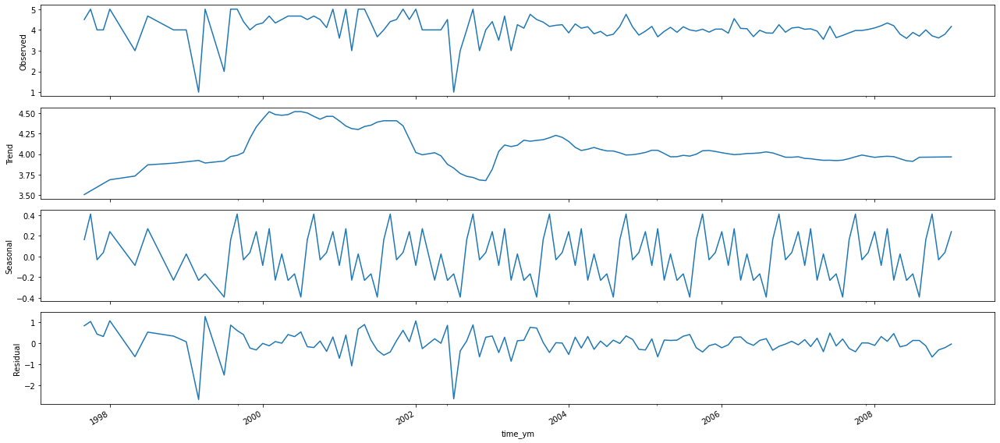

In [ ]:
y = df[df['movieID']==608].groupby('time_ym').rating.mean()
decomposition = sm.tsa.seasonal_decompose(y,freq=12, model='additive',extrapolate_trend='freq') #multiplicative
fig = decomposition.plot()
plt.show()

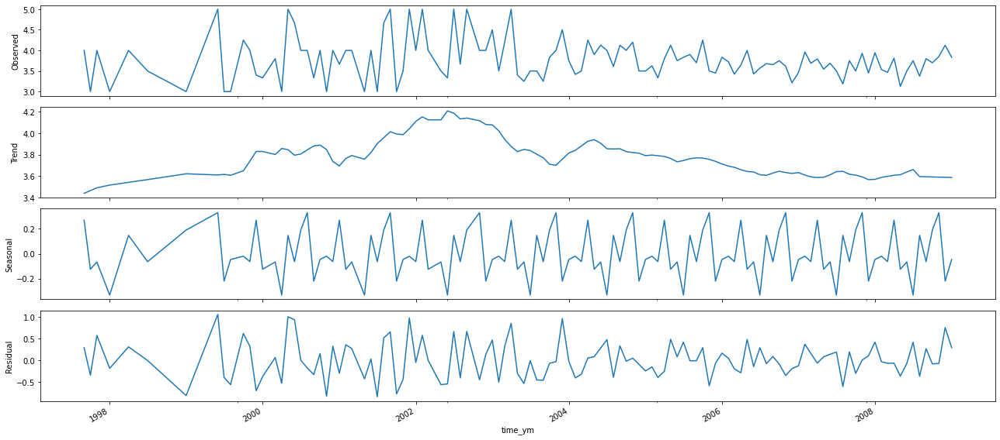

In [ ]:
y = df[df['movieID']==1073].groupby('time_ym').rating.mean()
decomposition = sm.tsa.seasonal_decompose(y,freq=12, model='additive',extrapolate_trend='freq') #multiplicative
fig = decomposition.plot()
plt.show()

## Two-user examples

In [ ]:
df.userID.value_counts()

6757     3410
30687    2908
30500    2823
62332    2763
51033    2631
         ... 
62280      20
68396      20
894        20
59995      20
26873      20
Name: userID, Length: 2113, dtype: int64

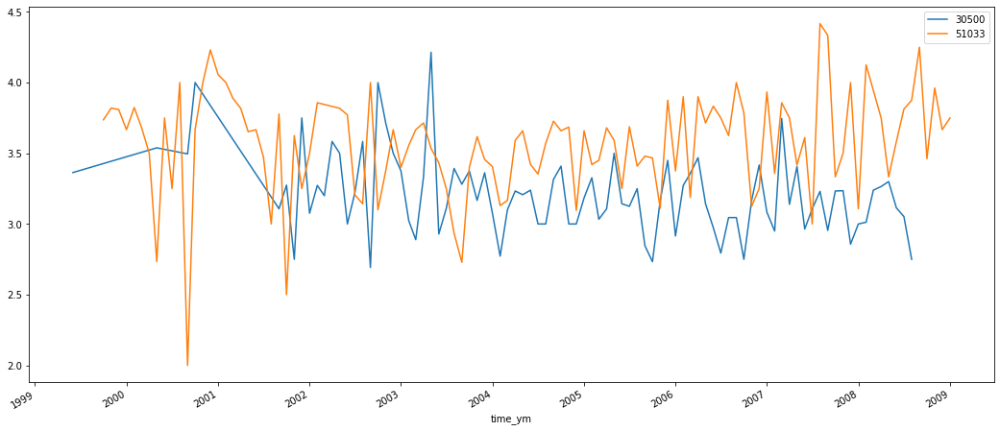

In [ ]:
df[df['userID']==30500].groupby('time_ym').rating.mean().plot()
df[df['userID']==51033].groupby('time_ym').rating.mean().plot()
plt.legend(['30500','51033'])

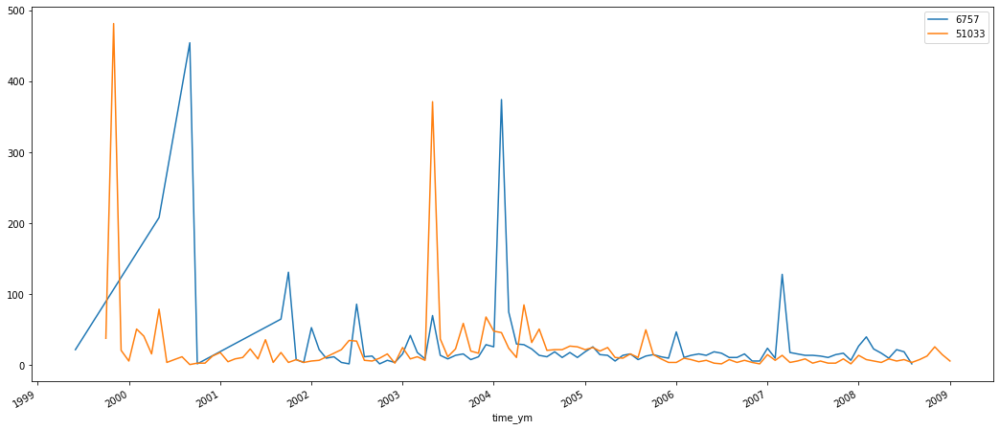

In [ ]:
df[df['userID']==30500].groupby('time_ym').rating.count().plot()
df[df['userID']==51033].groupby('time_ym').rating.count().plot()
plt.legend(['6757','51033'])

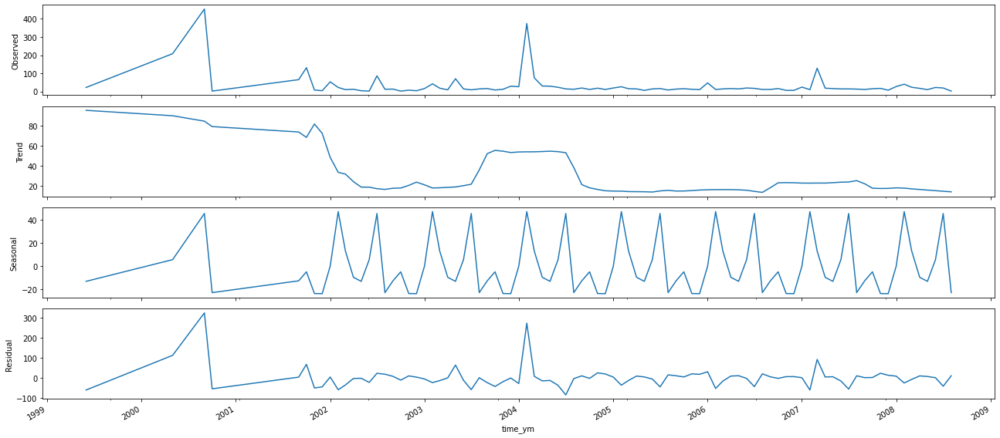

In [ ]:
y = df[df['userID']==30500].groupby('time_ym').rating.count()
decomposition = sm.tsa.seasonal_decompose(y,freq=12, model='additive',extrapolate_trend='freq') #multiplicative
fig = decomposition.plot()
plt.show()

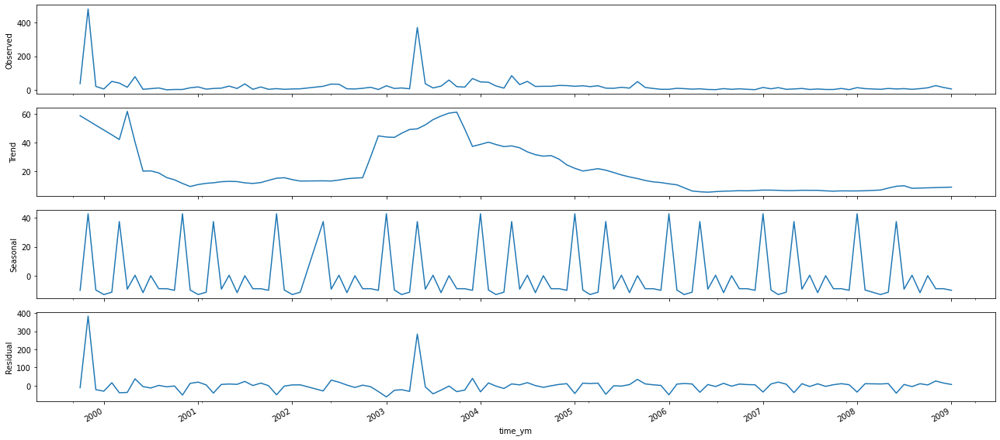

In [ ]:
y = df[df['userID']==51033].groupby('time_ym').rating.count()
decomposition = sm.tsa.seasonal_decompose(y,freq=12, model='additive',extrapolate_trend='freq') #multiplicative
fig = decomposition.plot()
plt.show()

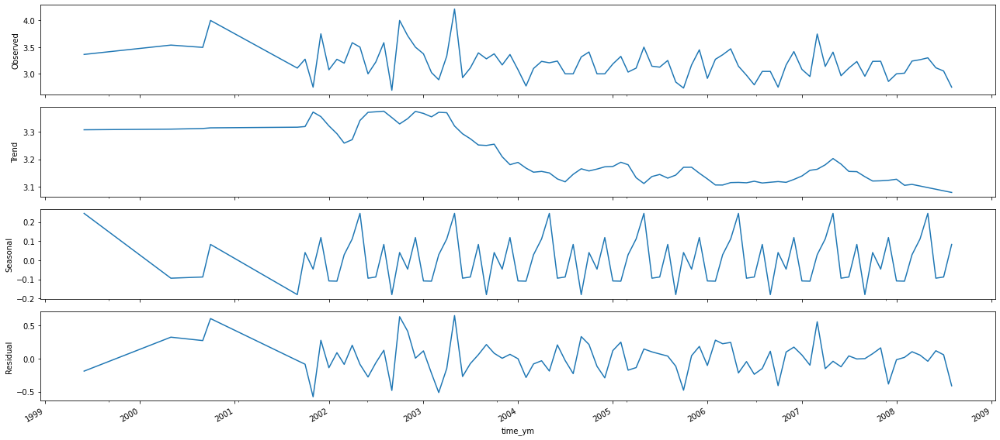

In [ ]:
y = df[df['userID']==30500].groupby('time_ym').rating.mean()
decomposition = sm.tsa.seasonal_decompose(y,freq=12, model='additive',extrapolate_trend='freq') #multiplicative
fig = decomposition.plot()
plt.show()

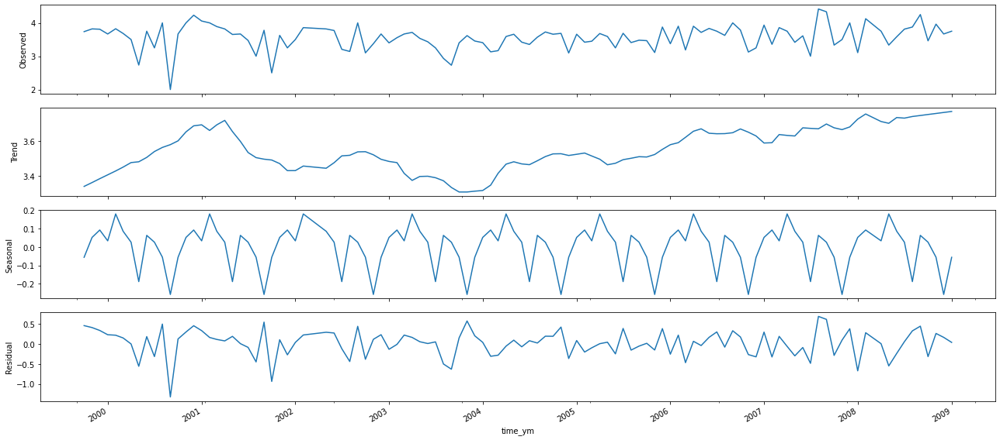

In [ ]:
y = df[df['userID']==51033].groupby('time_ym').rating.mean()
decomposition = sm.tsa.seasonal_decompose(y,freq=12, model='additive', extrapolate_trend='freq') #multiplicative
fig = decomposition.plot()
plt.show()

# Autoregressive Integrated Moving Average

In [ ]:
import itertools
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

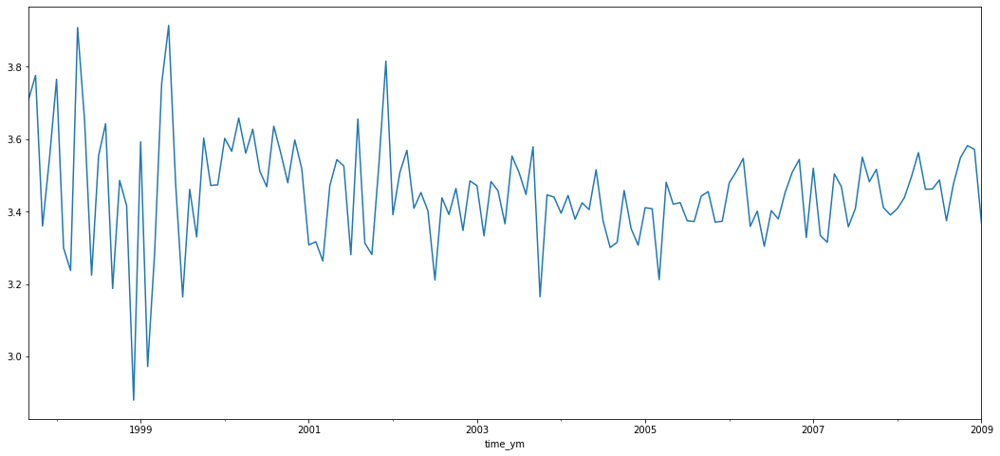

In [ ]:
y.plot()

In [ ]:
y = df.groupby('time_ym').rating.count()
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(y,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:2841.1439121122235
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:2545.216249115203
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:2357.773862947414
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:2144.047249517203
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:2377.638882411474
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:2362.06098806266
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:2160.708953518132
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:2145.2884121689576


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:2694.128789533829
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:2407.626288784833


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:2321.999072563707
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:2106.7434252640614


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:2359.282273404558


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:2324.201618190558
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:2143.113385643683


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:2106.8332923740463
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:2493.4943606993006
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:2286.222653145849
ARIMA(0, 1, 0)x(0, 1, 0, 12)12 - AIC:2334.5907061259463
ARIMA(0, 1, 0)x(0, 1, 1, 12)12 - AIC:2085.8548563789395
ARIMA(0, 1, 0)x(1, 0, 0, 12)12 - AIC:2301.400859244103


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-

ARIMA(0, 1, 0)x(1, 0, 1, 12)12 - AIC:2285.6930886455125
ARIMA(0, 1, 0)x(1, 1, 0, 12)12 - AIC:2108.867973964909


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


ARIMA(0, 1, 0)x(1, 1, 1, 12)12 - AIC:2076.70467685522
ARIMA(0, 1, 1)x(0, 0, 0, 12)12 - AIC:2440.492184588912
ARIMA(0, 1, 1)x(0, 0, 1, 12)12 - AIC:2231.5399144453745
ARIMA(0, 1, 1)x(0, 1, 0, 12)12 - AIC:2272.443959133361


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


ARIMA(0, 1, 1)x(0, 1, 1, 12)12 - AIC:2036.5235410820146
ARIMA(0, 1, 1)x(1, 0, 0, 12)12 - AIC:2264.7171713570933
ARIMA(0, 1, 1)x(1, 0, 1, 12)12 - AIC:2232.1127274973783


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


ARIMA(0, 1, 1)x(1, 1, 0, 12)12 - AIC:2079.0795739839305


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


ARIMA(0, 1, 1)x(1, 1, 1, 12)12 - AIC:2036.5498275138002
ARIMA(1, 0, 0)x(0, 0, 0, 12)12 - AIC:2509.967298910948
ARIMA(1, 0, 0)x(0, 0, 1, 12)12 - AIC:2300.8392434153116
ARIMA(1, 0, 0)x(0, 1, 0, 12)12 - AIC:2325.1365496759195


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


ARIMA(1, 0, 0)x(0, 1, 1, 12)12 - AIC:2093.5819306673047
ARIMA(1, 0, 0)x(1, 0, 0, 12)12 - AIC:2300.1501260823898
ARIMA(1, 0, 0)x(1, 0, 1, 12)12 - AIC:2301.684320620486


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


ARIMA(1, 0, 0)x(1, 1, 0, 12)12 - AIC:2097.1229035317288


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


ARIMA(1, 0, 0)x(1, 1, 1, 12)12 - AIC:2095.402877976294
ARIMA(1, 0, 1)x(0, 0, 0, 12)12 - AIC:2459.8323296274275
ARIMA(1, 0, 1)x(0, 0, 1, 12)12 - AIC:2250.901947504139
ARIMA(1, 0, 1)x(0, 1, 0, 12)12 - AIC:2289.5561506547047


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


ARIMA(1, 0, 1)x(0, 1, 1, 12)12 - AIC:2054.1539223426316
ARIMA(1, 0, 1)x(1, 0, 0, 12)12 - AIC:2266.8520834712917


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


ARIMA(1, 0, 1)x(1, 0, 1, 12)12 - AIC:2251.470774106536
ARIMA(1, 0, 1)x(1, 1, 0, 12)12 - AIC:2078.680138562243


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


ARIMA(1, 0, 1)x(1, 1, 1, 12)12 - AIC:2053.9275122318422
ARIMA(1, 1, 0)x(0, 0, 0, 12)12 - AIC:2472.56515446107
ARIMA(1, 1, 0)x(0, 0, 1, 12)12 - AIC:2263.596425242322
ARIMA(1, 1, 0)x(0, 1, 0, 12)12 - AIC:2303.526183969819


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


ARIMA(1, 1, 0)x(0, 1, 1, 12)12 - AIC:2058.0677722461155
ARIMA(1, 1, 0)x(1, 0, 0, 12)12 - AIC:2262.1744107113536
ARIMA(1, 1, 0)x(1, 0, 1, 12)12 - AIC:2263.8126789296516


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


ARIMA(1, 1, 0)x(1, 1, 0, 12)12 - AIC:2067.7084166742006


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


ARIMA(1, 1, 0)x(1, 1, 1, 12)12 - AIC:2063.0914139780193
ARIMA(1, 1, 1)x(0, 0, 0, 12)12 - AIC:2441.812018793489
ARIMA(1, 1, 1)x(0, 0, 1, 12)12 - AIC:2233.2482139009553
ARIMA(1, 1, 1)x(0, 1, 0, 12)12 - AIC:2274.2532510724054


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


ARIMA(1, 1, 1)x(0, 1, 1, 12)12 - AIC:2031.176570376543
ARIMA(1, 1, 1)x(1, 0, 0, 12)12 - AIC:2249.28186436869
ARIMA(1, 1, 1)x(1, 0, 1, 12)12 - AIC:2233.9233724510896


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


ARIMA(1, 1, 1)x(1, 1, 0, 12)12 - AIC:2061.9284806900437


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


ARIMA(1, 1, 1)x(1, 1, 1, 12)12 - AIC:2030.8657429107784


In [ ]:
mod = sm.tsa.statespace.SARIMAX(y,
                                order=(1, 1, 1),
                                seasonal_order=(1, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results = mod.fit()
print(results.summary().tables[1])

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0613      0.155      0.395      0.693      -0.243       0.366
ma.L1         -0.7443      0.103     -7.199      0.000      -0.947      -0.542
ar.S.L12       0.1920      0.180      1.069      0.285      -0.160       0.544
ma.S.L12      -1.1233      0.246     -4.560      0.000      -1.606      -0.640
sigma2      4.548e+06   1.41e+06      3.227      0.001    1.79e+06    7.31e+06


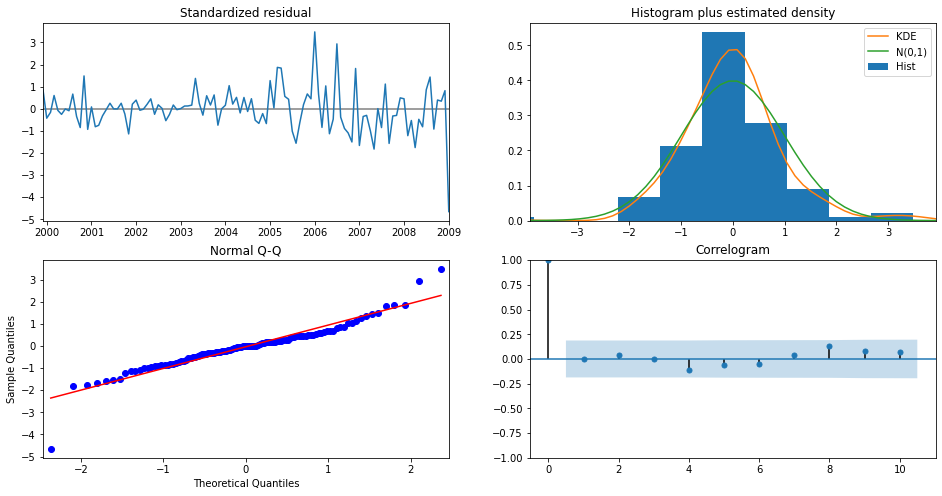

In [ ]:
results.plot_diagnostics(figsize=(16, 8))
plt.show()

In [ ]:
y

time_ym
1997-09-01      179
1997-10-01      143
1997-11-01      244
1997-12-01      131
1998-01-01      128
              ...  
2008-09-01     8736
2008-10-01    11596
2008-11-01    11962
2008-12-01    15039
2009-01-01     3105
Name: rating, Length: 137, dtype: int64

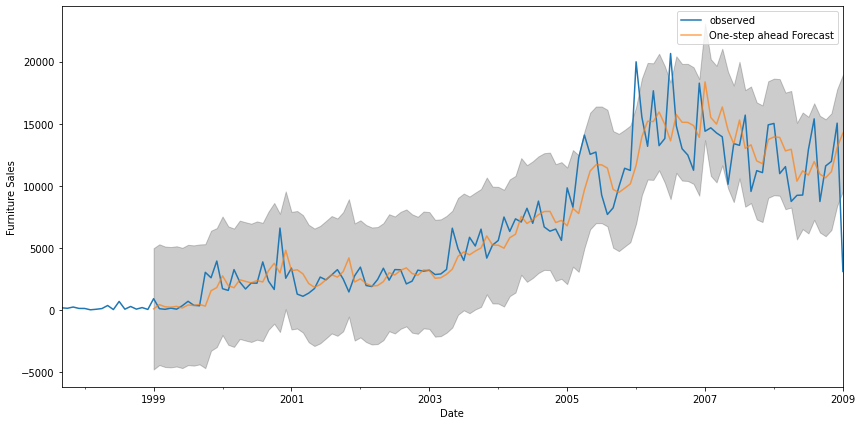

In [ ]:
pred = results.get_prediction(start=pd.to_datetime('1999-01-01'), dynamic=False)
pred_ci = pred.conf_int()
ax = y['1997':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Furniture Sales')
plt.legend()
plt.show()

## ARIMA for one-user

In [ ]:
y = df[df['userID']==51033].groupby('time_ym').rating.mean()
mod = sm.tsa.statespace.SARIMAX(y,
                                order=(1, 1, 1),
                                seasonal_order=(1, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results = mod.fit()
print(results.summary().tables[1])

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0265      0.125     -0.212      0.832      -0.272       0.219
ma.L1         -0.8637      0.092     -9.395      0.000      -1.044      -0.683
ar.S.L12      -0.3278      0.119     -2.746      0.006      -0.562      -0.094
ma.S.L12      -0.5236      0.146     -3.593      0.000      -0.809      -0.238
sigma2         0.1339      0.025      5.429      0.000       0.086       0.182


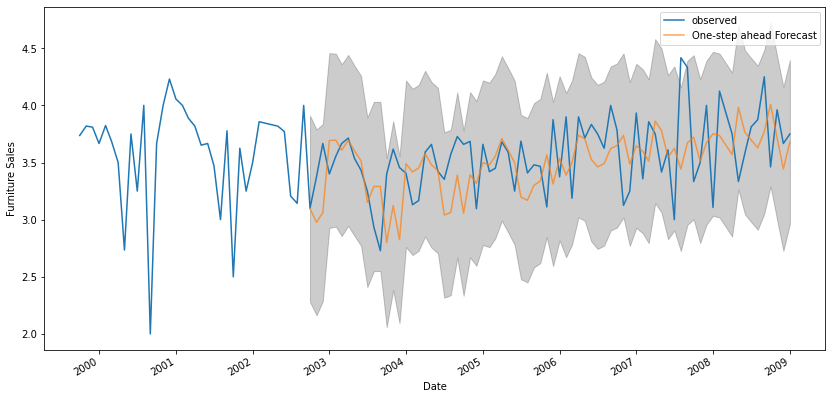

In [ ]:
pred = results.get_prediction(start=pd.to_datetime('2002-10-01'), dynamic=False)
pred_ci = pred.conf_int()
ax = y['1997':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Furniture Sales')
plt.legend()
plt.show()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)


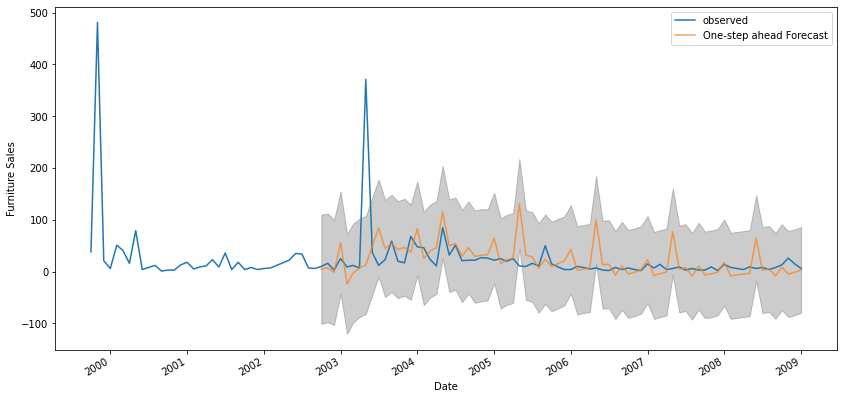

In [ ]:
y = df[df['userID']==51033].groupby('time_ym').rating.count()
mod = sm.tsa.statespace.SARIMAX(y,
                                order=(1, 1, 1),
                                seasonal_order=(1, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results = mod.fit()
pred = results.get_prediction(start=pd.to_datetime('2002-10-01'), dynamic=False)
pred_ci = pred.conf_int()
ax = y['1997':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Furniture Sales')
plt.legend()
plt.show()

# Prophet

In [ ]:
from fbprophet import Prophet
y = df.groupby('time_ym').rating.count()
all_count = pd.DataFrame({'ds': y.keys(), 'y': y.values})
count_model = Prophet(interval_width=0.95)
count_model.fit(all_count)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<Figure size 1296x432 with 0 Axes>

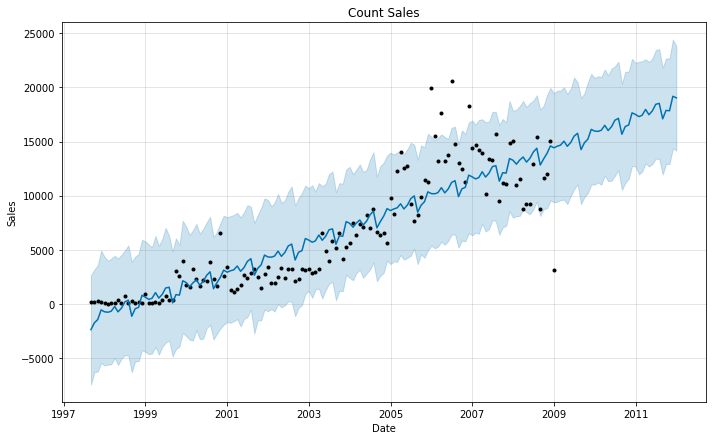

In [ ]:
count_forecast = count_model.make_future_dataframe(periods=36, freq='MS')
count_forecast = count_model.predict(count_forecast)
plt.figure(figsize=(18, 6))
count_model.plot(count_forecast, xlabel = 'Date', ylabel = 'Sales')
plt.title('Count Sales');

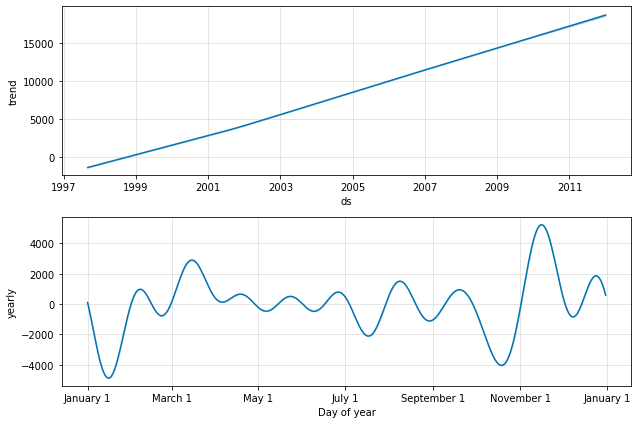

In [ ]:
count_model.plot_components(count_forecast);

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<Figure size 1296x432 with 0 Axes>

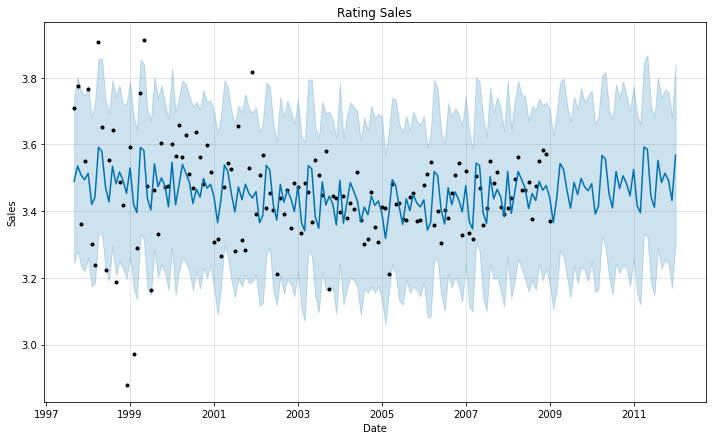

In [ ]:
y = df.groupby('time_ym').rating.mean()
all_rating = pd.DataFrame({'ds': y.keys(), 'y': y.values})
rating_model = Prophet(interval_width=0.95)
rating_model.fit(all_rating)
rating_forecast = rating_model.make_future_dataframe(periods=36, freq='MS')
rating_forecast = rating_model.predict(rating_forecast)

plt.figure(figsize=(18, 6))
rating_model.plot(rating_forecast, xlabel = 'Date', ylabel = 'Sales')
plt.title('Rating Sales');

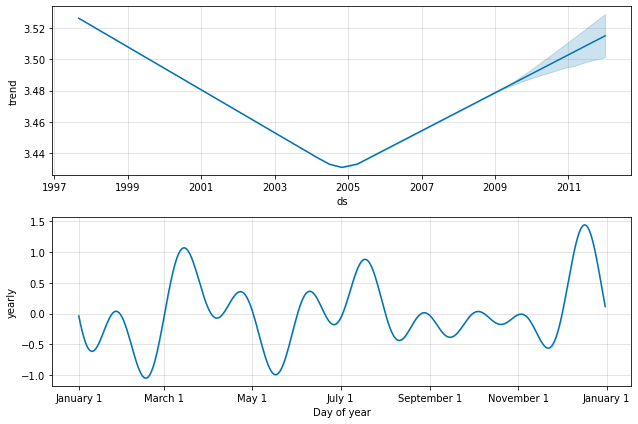

In [ ]:
rating_model.plot_components(rating_forecast);

## Prophet for one-user

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<Figure size 1296x432 with 0 Axes>

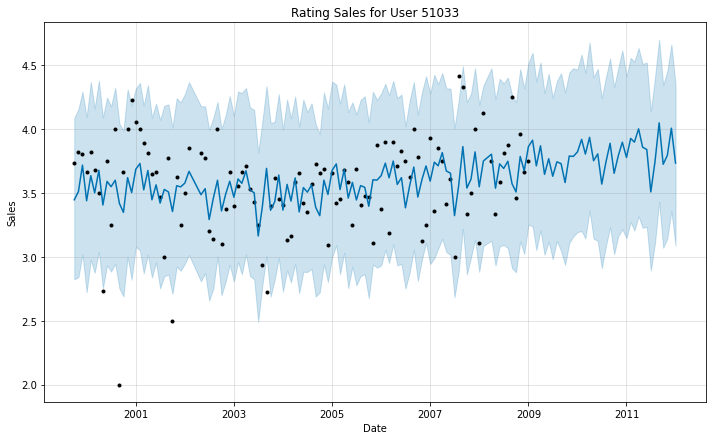

In [ ]:
y = df[df['userID']==51033].groupby('time_ym').rating.mean()
all_rating = pd.DataFrame({'ds': y.keys(), 'y': y.values})
rating_model = Prophet(interval_width=0.95)
rating_model.fit(all_rating)
rating_forecast = rating_model.make_future_dataframe(periods=36, freq='MS')
rating_forecast = rating_model.predict(rating_forecast)

plt.figure(figsize=(18, 6))
rating_model.plot(rating_forecast, xlabel = 'Date', ylabel = 'Sales')
plt.title('Rating Sales for User 51033');

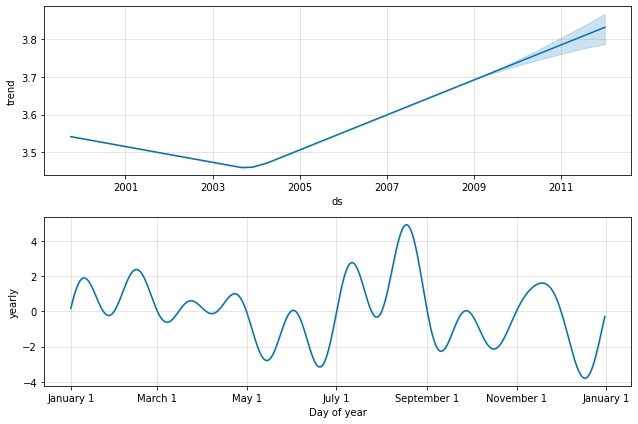

In [ ]:
rating_model.plot_components(rating_forecast)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


<Figure size 1296x432 with 0 Axes>

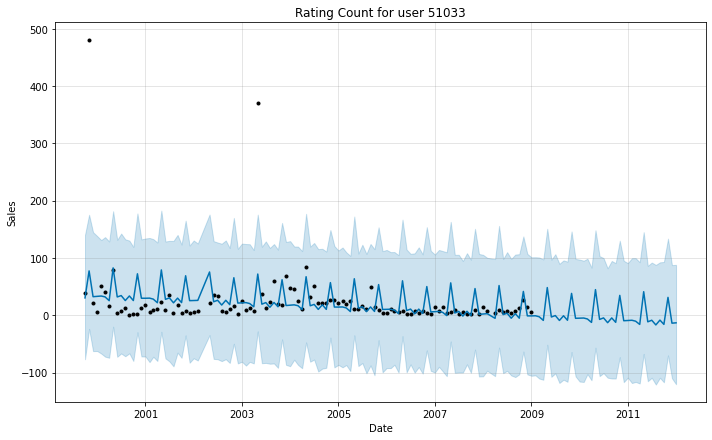

In [ ]:
y = df[df['userID']==51033].groupby('time_ym').rating.count()
all_rating = pd.DataFrame({'ds': y.keys(), 'y': y.values})
rating_model = Prophet(interval_width=0.95)
rating_model.fit(all_rating)
rating_forecast = rating_model.make_future_dataframe(periods=36, freq='MS')
rating_forecast = rating_model.predict(rating_forecast)

plt.figure(figsize=(18, 6))
rating_model.plot(rating_forecast, xlabel = 'Date', ylabel = 'Sales')
plt.title('Rating Count for user 51033');

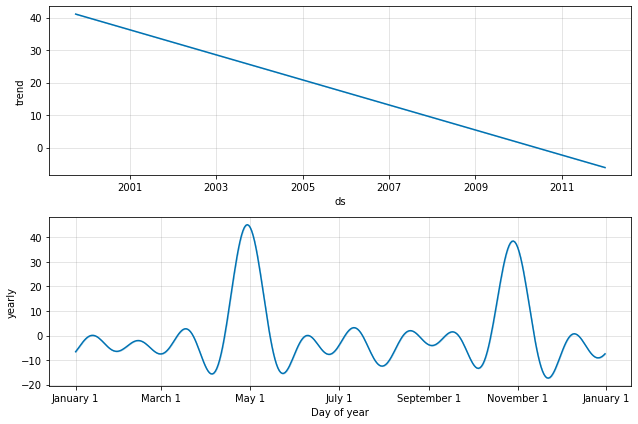

In [ ]:
rating_model.plot_components(rating_forecast)
plt.show()

# RecSys

## CF

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
df = pd.read_csv('/content/drive/MyDrive/PY/TimeSeriesRecSys/Data_HetRec/user_ratedmovies.dat',sep="\s+", )
df = df.sort_values(by=['date_year','date_month','date_day','date_hour','date_minute','date_second'])
df

,userID,movieID,rating,date_day,date_month,date_year,date_hour,date_minute,date_second
628154,51198,608,5.0,17,9,1997,23,40,20
628167,51198,1073,4.0,17,9,1997,23,41,6
628132,51198,141,4.0,17,9,1997,23,41,58
628141,51198,356,4.0,17,9,1997,23,43,44
628180,51198,1198,5.0,17,9,1997,23,44,35
...,...,...,...,...,...,...,...,...,...
719246,60002,58998,3.5,5,1,2009,4,20,2
810291,68151,65133,5.0,5,1,2009,5,29,53
484762,38726,64620,4.0,5,1,2009,5,30,54
716620,59557,3262,5.0,5,1,2009,5,31,47


In [ ]:
len(df.userID.unique()),len(df.movieID.unique()),len(df.rating.unique())

(2113, 10109, 10)

In [ ]:
df.userID.value_counts().describe()

count    2113.000000
mean      404.920965
std       420.300084
min        20.000000
25%       107.000000
50%       273.000000
75%       552.000000
max      3410.000000
Name: userID, dtype: float64

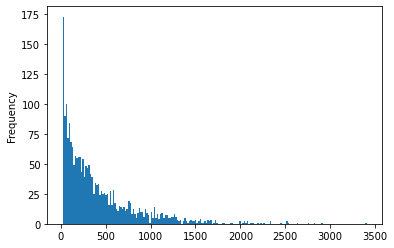

In [ ]:
df.userID.value_counts().plot.hist(bins=200)

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
train, test = train_test_split(df[:10000], test_size=0.2, random_state=42)
train.shape,test.shape

((8000, 9), (2000, 9))

In [ ]:
userMovie = pd.DataFrame(train.groupby('userID').apply(lambda x: dict(zip(x['movieID'],x['rating']))).reset_index(name='userMovieID'))
userMovie['itemCount'] = [len(i) for i in userMovie['userMovieID']]
userMovie = userMovie.set_index('userID')
userMovie.head()

,userMovieID,itemCount
userID,,
1860,"{2073: 3.0, 34: 4.0, 2357: 4.0, 2273: 4.0, 127...",170
8114,"{15: 1.0, 265: 3.0, 2565: 2.0, 2243: 5.0, 910:...",597
9117,"{2454: 2.0, 595: 3.0, 593: 4.0, 1582: 4.0, 381...",252
10476,"{457: 3.0, 1397: 1.0, 2355: 1.0, 1347: 4.0, 13...",105
12296,"{1042: 3.0, 1014: 3.0, 2029: 4.0, 2006: 3.0, 1...",386


In [ ]:
userMovie.itemCount.describe()

count     57.000000
mean     140.350877
std      122.575850
min        1.000000
25%       60.000000
50%      105.000000
75%      181.000000
max      597.000000
Name: itemCount, dtype: float64

In [ ]:
#Find Similar Users
#通过用户ID获取用户的rating，返回字典
def getMovieRates(userId):
    if userId in userMovie.index:
        return userMovie.loc[userId][0]
    else:
        print('user ID not found')

#计算目标用户和对比用户间，相同观影记录以及rating差异，返回每部电影评分差异的list
def calcDistance(userId1, userId2):
    userMovie1 = getMovieRates(userId1)
    userMovie2 = getMovieRates(userId2)
#2用户打分差异值的绝对值，经过1/(1+x)倒数变换, 大值代表高相似， 这样可以把完全一样差异值为0的item对算进来
    diffSum = [round(1/(1+abs(userMovie1[k]-userMovie2[k])),2) for k in userMovie1 if k in userMovie2]
# ！！！    diffEuc = 1/(1+np.sqrt(np.sum(np.power(diffSum, 2)))) # Euc距离不准确 不使用！！
    if len(diffSum)>0:
        return diffSum
    else:
        return []

In [ ]:
def findSimUsers(targetUser, sameItemsRate=0.1, simLimit=0.5):
    simUsers = {}
    for i in userMovie.index:
        if i != targetUser:
            dis = calcDistance(targetUser, i)
    #共同的item数 要大于两个user总共items数平均值的n% - 过滤掉打分稀少 和 item密集用户，最为精确，只寻找item数量相似的用户
    #但是此阈值可能超过用户评分数的长度，所以应该限制大小为评分数少的那个用户的itemCount,in such case，该用户评分为另一用户的子集
    
            SimThreshold = round(sameItemsRate * np.mean(userMovie['itemCount'][[targetUser, i]])) 
            minSimThreshold =  np.min(userMovie['itemCount'][[targetUser, i]])
            if SimThreshold > minSimThreshold: 
                # SimThreshold = minSimThreshold  #并不能解决对比用户为密集打分的情况，对面的多数据会影响到多数推荐
    #         SimThreshold = round(sameItemsRate * userMovie['itemCount'][i]) #共同的item数 要大于对比user总共items数的10% - 保留打分稀疏用户
              SimThreshold = round(sameItemsRate * userMovie['itemCount'][targetUser]) #共同的item数 要大于目标user（自己）总共items数的n% - 数据量最多
            sameItems = len(dis) # 两用户都有评分的item
            if sameItems > SimThreshold:
            # 传统做法是判断多少个大于阈值的项目，然后决定是否是相关用户，然而有些密集打分用户会有很多相似项目，下面通过均分阈值继续判断
            #对所有相同项的评分差异值求平均，过滤掉有很多相同item的密集打分用户的影响
                sim = round(np.mean(dis),2)
                if sim > simLimit:  #simLimit = 0.7 对应 1/(1+dis) , 相当于过滤出平均分差0.42之内的用户
#                     print(i, sim, dis, userMovie['itemCount'][i])
                    simUsers[i] = sim
    return simUsers

In [ ]:
# for example, users NO.75
simUsers = findSimUsers(1860)
simUsers

{8114: 0.6,
 9117: 0.58,
 10476: 0.56,
 12296: 0.62,
 20226: 0.7,
 21712: 0.64,
 21947: 0.68,
 23172: 0.57,
 28350: 0.52,
 29202: 0.56,
 32283: 0.59,
 33139: 0.64,
 33349: 0.7,
 35886: 0.69,
 36495: 0.6,
 39617: 0.59,
 41234: 0.62,
 46890: 0.65,
 50265: 0.53,
 50383: 0.67,
 50543: 0.7,
 50670: 0.72,
 51033: 0.64,
 51198: 0.58,
 55280: 0.58,
 61915: 0.61,
 67068: 0.67,
 71331: 0.69}

In [ ]:
# Recommend Movies
userMovieSub = userMovie.loc[simUsers.keys(), ['userMovieID']] #选出的相似用户的评分
userMovieSub.head()

,userMovieID
userID,
8114,"{15: 1.0, 265: 3.0, 2565: 2.0, 2243: 5.0, 910:..."
9117,"{2454: 2.0, 595: 3.0, 593: 4.0, 1582: 4.0, 381..."
10476,"{457: 3.0, 1397: 1.0, 2355: 1.0, 1347: 4.0, 13..."
12296,"{1042: 3.0, 1014: 3.0, 2029: 4.0, 2006: 3.0, 1..."
20226,"{2542: 5.0, 1: 3.0, 29: 5.0, 2000: 3.0, 2634: ..."


In [ ]:
recMovie = {}
recMovieWeighted = {}
#只对相似用户的评分求平均，会受到部分口味清奇用户的评分影响，且忽略了多个相似用户看过同一部item的情况
for u in userMovieSub.index:
    ratings = userMovieSub.loc[u,'userMovieID']
    for i in ratings:
        if i in recMovie:
            recMovie[i].append(ratings[i])
            recMovieWeighted[i].append(ratings[i] * simUsers[u]) #sim-user weighted
        else:
            recMovie[i] = [ratings[i]]
            recMovieWeighted[i] = [ratings[i] * simUsers[u]] #sim-user weighted

for i in recMovie:
    recMovie[i] =  [len(recMovie[i]), round(np.mean(recMovie[i]),2), round(np.mean(recMovieWeighted[i]),2)] #长度，平均，加权平均

recMovies = pd.DataFrame(sorted(recMovie.items(), key=lambda a: np.mean(a[1][2]), reverse=True), columns=['recMovieID','rating'])
# recMovies['meanRating'] = round(recMovies['meanRating'],2)
recMovies['count'] = recMovies['rating'].map(lambda x:x[0])
recMovies['meanRating'] = recMovies['rating'].map(lambda x:x[1])
recMovies['weightedMeanRating'] = recMovies['rating'].map(lambda x:x[2])
del recMovies['rating']
recMovies

,recMovieID,count,meanRating,weightedMeanRating
0,2611,1,5.0,3.60
1,680,1,5.0,3.50
2,1939,1,5.0,3.50
3,2186,1,5.0,3.50
4,568,1,5.0,3.45
...,...,...,...,...
1635,603,1,1.0,0.53
1636,203,1,1.0,0.53
1637,157,1,1.0,0.53
1638,2719,1,1.0,0.53


In [ ]:
recMovieIds = list(recMovies[(recMovies['weightedMeanRating']>3)&(recMovies['count']>1)]['recMovieID'])
orig =  getMovieRates(1860) # eg. No.75 user

for i in orig:
  if i in recMovieIds:  
    recMovieIds.remove(i)  #去除目标用户已看过的
res_new = recMovies[recMovies['recMovieID'].isin(recMovieIds)] # 用户没看过的(没在训练集里的，有可能在测试集中)
# recMovies[(recMovies['weightedMeanRating']>3)&(recMovies['count']>1)&(recMovies['recMovieId'].isin([50,2571]))]
res_train = recMovies[recMovies['recMovieID'].isin(orig)].sort_values(by='recMovieID') #被推荐用户本来已经看过的，通过CF算出的得分，这个看做在训练集上的预测score

In [ ]:
def rateMAE(res, orig):
  res_rate =  dict(zip(res['recMovieID'],res['meanRating']))
  diff = []
  for i in res_rate:
    if i in orig:
  #     print(i,res_rate[i],orig[i])
      diff.append(abs(res_rate[i]-orig[i]))
  MAE = np.mean(diff)
  print('MAE:',MAE)
rateMAE(recMovies, orig)

MAE: 0.864875


In [ ]:
rateMAE(res_train, orig)


MAE: 0.864875


In [ ]:
res_test = test[test['userID']==1860]
res_test_rate = dict(zip(res_test['userID'], res_test['rating']))
res_test_rate 

{1860: 5.0}

# DL RecSys

## MF
https://nipunbatra.github.io/blog/ml/2017/12/18/recommend-keras.html

#### TSFresh time features

In [ ]:
import keras
import pickle
from IPython.display import SVG
from keras.optimizers import Adam
from keras.utils.vis_utils import model_to_dot
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error


In [ ]:
# n_users, n_movies = df_filtered_train.userID.nunique(),df_filtered_train.movieID.nunique()
# df_filtered_train.userID = df_filtered_train.userID.astype('category').cat.codes.values
# df_filtered_train.movieID = df_filtered_train.movieID.astype('category').cat.codes.values
# print(n_users, n_movies)

984 5798


使用rating数据，但是用tagged里的时间特征

In [ ]:
# 修改rating里的userID以适配tag数据
df = df[(df.userID.isin(df_filtered_train.userID.unique())) & (df.movieID.isin(df_filtered_train.movieID.unique()))]
df.shape

使用rating数据，+rating tsfresh 特征

In [ ]:
train.userID.nunique(),len(extracted_features_u)

(1383, 1383)

#### Feature Selection

In [ ]:
# Removing features with low variance

from sklearn.feature_selection import VarianceThreshold
sel = VarianceThreshold(threshold=(.9 * (1 - .1)))
extracted_features_u = sel.fit_transform(extracted_features_u)
extracted_features_u.shape

In [ ]:
sel = VarianceThreshold(threshold=(.9 * (1 - .1)))
extracted_features_m = sel.fit_transform(extracted_features_m)
extracted_features_m.shape

In [ ]:
import pandas as pd
extracted_features_m = pd.DataFrame(extracted_features_m)
extracted_features_u = pd.DataFrame(extracted_features_u)

##### 直接PCA 降维TSFresh

In [ ]:
vectors_200m = pd.DataFrame(PCA(n_components=20).fit_transform(extracted_features_m))  # 661-> 20
vectors_200u = pd.DataFrame(PCA(n_components=20).fit_transform(extracted_features_u))  # 872-> 20
vectors_200m.index = train.movieID.unique()
vectors_200u.index = train.userID.unique()

#### TSFresh feature as embedding pre-trained weights

In [ ]:
import keras
import pickle
from IPython.display import SVG
from keras.optimizers import Adam
from keras.utils.vis_utils import model_to_dot
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error
from keras.layers import *
from keras.models import Model

n_movies, n_users = df_filtered.movieID.nunique(), df_filtered.userID.nunique()
# df.userID = df.userID.apply(str)
# df.movieID = df.movieID.apply(str)
print(n_users, n_movies)

1742 3485


In [ ]:
# vectors_200m['newID'] = train.movieID.unique()
# vectors_200u['newID'] = train.userID.unique()
# if 3113 in vectors_200m.newID.unique():
#   print(1)
# else:
#   print(0)

# if 3113 in vectors_200m.newID:
#   print(1)
# else:
#   print(0)

1
0


In [ ]:
# 转换为embedding 矩阵，用随机值填充没有的
n_latent_factors = 20
emb_mat_m = np.random.normal(0,1,(n_movies, n_latent_factors))
for i in vectors_200m.index:
  emb_mat_m[i] = vectors_200m.loc[i,:]

emb_mat_u = np.random.normal(0,1,(n_users, n_latent_factors))
for i in vectors_200u.index:
  emb_mat_u[i] = vectors_200u.loc[i,:]

In [ ]:
emb_mat_m = pd.DataFrame(emb_mat_m)
emb_mat_u = pd.DataFrame(emb_mat_u)

scaler = MinMaxScaler()
emb_mat_m = scaler.fit_transform(emb_mat_m)
scaler = MinMaxScaler()
emb_mat_u = scaler.fit_transform(emb_mat_u)

In [ ]:
# emb_user = {} #np.zeros((n_users, n_latent_factors))
# for i in train.userID.unique():
#     if i in vectors_200u.newID.unique():
#         vect = vectors_200u[vectors_200u.newID==i].values[0][:-1]
#         if vect is not None:
#             emb_user[i] = vect
#     else:
#         print(i)
#         break

In [ ]:
# df.userID = df.userID.astype('category').cat.codes.values
# df.movieID = df.movieID.astype('category').cat.codes.values
# train, test = df.iloc[:8000,:], df.iloc[8000:,:]
# train.shape, test.shape

((8000, 12), (2000, 12))

MF

In [ ]:
from keras.layers import *
from keras.models import Model


movie_input = Input(shape=[1],name='Item')
movie_embedding = Embedding(n_movies, n_latent_factors, weights=[emb_mat_m], trainable=True, name='Movie-Embedding')(movie_input)
movie_vec = Flatten(name='FlattenMovies')(movie_embedding)

user_input = Input(shape=[1],name='User')
user_embedding = Embedding(n_users, n_latent_factors, weights=[emb_mat_u], trainable=True, name='User-Embedding')(user_input)
user_vec = Flatten(name='FlattenUsers')(user_embedding)
prod = dot([movie_vec, user_vec], (1),name='DotProduct')
model = Model([user_input, movie_input], prod)
model.compile('adam', 'mean_squared_error')
model.summary()

Model: "model_7"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Item (InputLayer)               [(None, 1)]          0                                            
__________________________________________________________________________________________________
User (InputLayer)               [(None, 1)]          0                                            
__________________________________________________________________________________________________
Movie-Embedding (Embedding)     (None, 1, 100)       348500      Item[0][0]                       
__________________________________________________________________________________________________
User-Embedding (Embedding)      (None, 1, 100)       174200      User[0][0]                       
____________________________________________________________________________________________

In [ ]:
history = model.fit([train.userID, train.movieID], train.rating, epochs=100,batch_size=256)

Epoch 1/100
32/32 [==============================] - 1s 8ms/step - loss: 152.3840
Epoch 2/100
32/32 [==============================] - 0s 8ms/step - loss: 129.8139
Epoch 3/100
32/32 [==============================] - 0s 7ms/step - loss: 111.1905
Epoch 4/100
32/32 [==============================] - 0s 7ms/step - loss: 95.6807
Epoch 5/100
32/32 [==============================] - 0s 7ms/step - loss: 81.6538
Epoch 6/100
32/32 [==============================] - 0s 7ms/step - loss: 70.0409
Epoch 7/100
32/32 [==============================] - 0s 7ms/step - loss: 60.6871
Epoch 8/100
32/32 [==============================] - 0s 8ms/step - loss: 51.7851
Epoch 9/100
32/32 [==============================] - 0s 8ms/step - loss: 44.8456
Epoch 10/100
32/32 [==============================] - 0s 7ms/step - loss: 38.6712
Epoch 11/100
32/32 [==============================] - 0s 7ms/step - loss: 33.4322
Epoch 12/100
32/32 [==============================] - 0s 7ms/step - loss: 28.7104
Epoch 13/100
32/32 [==

Text(0, 0.5, 'Train Error')

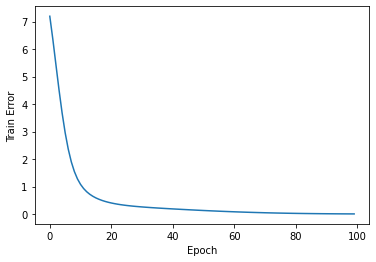

In [ ]:
import pandas as pd
pd.Series(history.history['loss']).plot(logy=False)
plt.xlabel("Epoch")
plt.ylabel("Train Error")

In [ ]:
y_hat = np.round(model.predict([test.userID, test.movieID]),2)
y_true = test.rating
from sklearn.metrics import mean_absolute_error
mean_absolute_error(y_true, y_hat) #MAE

3.4311299998993054

100epo 只用ID，5 latent factor embedding, adam, MSE, MAE on test in 3.431 (0.03 in train set, overfitting)

In [ ]:
# 同样参数 使用TSFresh PCA20 特征
y_hat = np.round(model.predict([test.userID, test.movieID]),2)
y_true = test.rating
from sklearn.metrics import mean_absolute_error
mean_absolute_error(y_true, y_hat) #MAE

1.0367799955233932

In [ ]:
# 同样参数 使用TSFresh->scale->PCA100->scale->Model 特征 100反而不好
y_hat = np.round(model.predict([test.userID, test.movieID]),2)
y_true = test.rating
from sklearn.metrics import mean_absolute_error
mean_absolute_error(y_true, y_hat) #MAE

5.522535002857446

Embed-FC

In [ ]:
n_latent_factors_user = 20  # 5
n_latent_factors_movie = 20 # 8

movie_input = Input(shape=[1],name='Item')
movie_embedding = Embedding(n_movies, n_latent_factors_movie,  weights=[emb_mat_m], trainable=True, name='Movie-Embedding')(movie_input)
movie_vec = Flatten(name='FlattenMovies')(movie_embedding)
movie_vec = Dropout(0.2, name='Dropout_movie')(movie_vec)


user_input = Input(shape=[1],name='User')
user_Embedding = Embedding(n_users, n_latent_factors_user, weights=[emb_mat_u], trainable=True, name='User-Embedding')(user_input)
user_vec = Flatten(name='FlattenUsers')(user_Embedding)
user_vec = Dropout(0.2, name='Dropout_user')(user_vec)

concat = concatenate([movie_vec, user_vec], name='Concat')
concat = Dropout(0.2, name='Dropout_concat')(concat)

# dense = Dense(200,name='FullyConnected')(concat)
# dense = Dropout(0.2, name='Dropout')(dense)
dense_2 = Dense(100, name='FullyConnected-1')(concat)
dense_2 = Dropout(0.2, name='Dropout2')(dense_2)
dense_3 = Dense(50, name='FullyConnected-2')(dense_2)
dense_3 = Dropout(0.2, name='Dropout3')(dense_3)
dense_4 = Dense(20, name='FullyConnected-3', activation='relu')(dense_3)


result = Dense(1, activation='relu',name='Activation')(dense_4)
adam = Adam(lr=0.005)
model = Model([user_input, movie_input], result)
model.compile(optimizer=adam,loss= 'mean_absolute_error')
# model.summary()

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [ ]:
history = model.fit([train.userID, train.movieID], train.rating, epochs=150, verbose=0, batch_size=256)

Text(0, 0.5, 'Train Error')

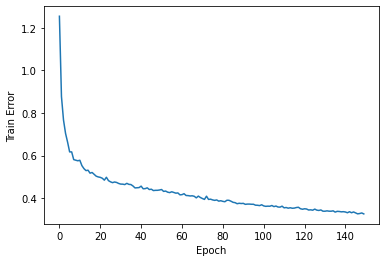

In [ ]:
# TSFresh
pd.Series(history.history['loss']).plot(logy=False)
plt.xlabel("Epoch")
plt.ylabel("Train Error")

In [ ]:
# ONly ID 10 latent 150 epo
y_hat = np.round(model.predict([test.userID, test.movieID]),2)
y_true = test.rating
from sklearn.metrics import mean_absolute_error
mean_absolute_error(y_true, y_hat) #MAE

0.8738600016534328

In [ ]:
# with TSFresh 20-latent features 150 epo
y_hat = np.round(model.predict([test.userID, test.movieID]),2)
y_true = test.rating
from sklearn.metrics import mean_absolute_error
mean_absolute_error(y_true, y_hat) #MAE

0.7485050019472838

150,200 epo时 有TSFresh特征效果都更好

### 对照无tsfresh

对比：没有tsfresh feature emb

In [ ]:
movie_input = Input(shape=[1],name='Item')
movie_embedding = Embedding(n_movies, 3, name='Movie-Embedding')(movie_input)
movie_vec = Flatten(name='FlattenMovies')(movie_embedding)

user_input = Input(shape=[1],name='User')
user_embedding = Embedding(n_users, 3, name='User-Embedding')(user_input)
user_vec = Flatten(name='FlattenUsers')(user_embedding)


concat = concatenate([movie_vec, user_vec], name='Concat')
# concat = Dropout(0.2, name='Dropout_concat')(concat)

# dense = Dense(200,name='FullyConnected')(concat)
# dense = Dropout(0.2, name='Dropout')(dense)
dense_2 = Dense(200, name='FullyConnected-1')(concat)
dense_2 = Dropout(0.2, name='Dropout2')(dense_2)
dense_3 = Dense(50, name='FullyConnected-2')(dense_2)
dense_3 = Dropout(0.2, name='Dropout3')(dense_3)
dense_4 = Dense(20, name='FullyConnected-3', activation='relu')(dense_3)


result = Dense(1,activation="linear",name='Activation')(dense_4)

model = Model([user_input, movie_input], result)
model.compile('rmsprop', 'mean_squared_error')
model.summary()

Model: "model_13"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Item (InputLayer)               [(None, 1)]          0                                            
__________________________________________________________________________________________________
User (InputLayer)               [(None, 1)]          0                                            
__________________________________________________________________________________________________
Movie-Embedding (Embedding)     (None, 1, 3)         10455       Item[0][0]                       
__________________________________________________________________________________________________
User-Embedding (Embedding)      (None, 1, 3)         5226        User[0][0]                       
___________________________________________________________________________________________

In [ ]:
history = model.fit([train.newUID, train.newMID], train.rating, epochs=100, batch_size=256)

Epoch 1/100
32/32 [==============================] - 1s 4ms/step - loss: 7.5420
Epoch 2/100
32/32 [==============================] - 0s 3ms/step - loss: 1.0492
Epoch 3/100
32/32 [==============================] - 0s 3ms/step - loss: 0.9448
Epoch 4/100
32/32 [==============================] - 0s 4ms/step - loss: 0.8399
Epoch 5/100
32/32 [==============================] - 0s 3ms/step - loss: 0.7282
Epoch 6/100
32/32 [==============================] - 0s 3ms/step - loss: 0.6580
Epoch 7/100
32/32 [==============================] - 0s 3ms/step - loss: 0.6090
Epoch 8/100
32/32 [==============================] - 0s 3ms/step - loss: 0.5577
Epoch 9/100
32/32 [==============================] - 0s 3ms/step - loss: 0.5367
Epoch 10/100
32/32 [==============================] - 0s 4ms/step - loss: 0.4970
Epoch 11/100
32/32 [==============================] - 0s 3ms/step - loss: 0.4819
Epoch 12/100
32/32 [==============================] - 0s 3ms/step - loss: 0.4536
Epoch 13/100
32/32 [=================

Text(0, 0.5, 'Train Error')

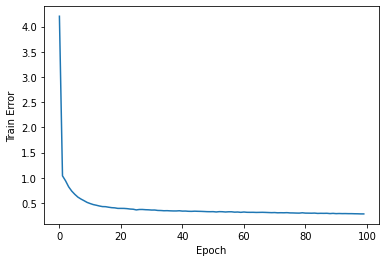

In [ ]:
import pandas as pd
pd.Series(history.history['loss']).plot(logy=False)
plt.xlabel("Epoch")
plt.ylabel("Train Error")

In [ ]:
y_hat = np.round(model.predict([test.newUID, test.newMID]),2)
y_true = test.rating
from sklearn.metrics import mean_absolute_error
mean_absolute_error(y_true, y_hat) #MAE

0.8399549971278757

In [ ]:
y_hat

array([[3.68],
       [3.47],
       [2.57],
       ...,
       [3.54],
       [3.25],
       [5.18]], dtype=float32)

对比：直接使用time features

In [ ]:
df = df_filtered.copy()

df['dayofweek_num']=df['time_stamp'].dt.dayofweek  
df['weekofyear']=df['time_stamp'].dt.weekofyear
df['quarter']=df['time_stamp'].dt.quarter
df['days_in_month']=df['time_stamp'].dt.days_in_month
df['is_month_start']=df['time_stamp'].dt.is_month_start
df['is_month_end']=df['time_stamp'].dt.is_month_end
df['is_quarter_start']=df['time_stamp'].dt.is_quarter_start
df['is_quarter_end']=df['time_stamp'].dt.is_quarter_end
df['is_year_start']=df['time_stamp'].dt.is_year_start
df['is_year_end']=df['time_stamp'].dt.is_year_end
df['is_leap_year']=df['time_stamp'].dt.is_leap_year
# df['day_part'] = df.date_hour.apply(daypart)
# weekend flag
# df['is_weekend'] = df['dayofweek_num'].apply(lambda x : 1 if x < 5 else 0)

# df['dayofweek_num']=df['time_stamp'].dt.dayofweek  
# df['weekofyear']=df['time_stamp'].dt.weekofyear
# df.date_year = df.date_year.astype('category').cat.codes.values
# df.dayofweek_num = df.dayofweek_num.astype('category').cat.codes.values
cols = df.iloc[:,3:].filter(regex="[^time_stamp]").columns
scaler = MinMaxScaler()
df_new = scaler.fit_transform(df.iloc[:,3:].filter(regex="[^time_stamp]"))
df_new = pd.DataFrame(df_new)
df_new.columns = cols
df = pd.concat([df.iloc[:,:3], df_new],axis=1)
df

,userID,movieID,rating,date_day,date_month,date_year,date_hour,date_minute,date_second,dayofweek_num,weekofyear,quarter,days_in_month,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,is_leap_year
0,780,254,3.0,0.666667,0.727273,0.0,0.652174,0.474576,0.949153,1.000000,0.711538,0.666667,0.666667,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,780,205,3.0,0.700000,0.818182,0.0,0.652174,0.864407,0.762712,0.333333,0.807692,1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,216,631,2.0,0.300000,0.909091,0.0,0.652174,0.186441,0.813559,0.000000,0.865385,1.000000,0.666667,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,216,281,3.0,0.300000,0.909091,0.0,0.652174,0.474576,0.474576,0.000000,0.865385,1.000000,0.666667,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,241,321,3.0,0.333333,0.909091,0.0,0.608696,0.033898,0.322034,0.166667,0.865385,1.000000,0.666667,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1361,1682,4.0,0.100000,0.000000,1.0,0.826087,0.372881,0.796610,1.000000,0.000000,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9996,1531,524,3.5,0.100000,0.000000,1.0,0.913043,0.084746,0.932203,1.000000,0.000000,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9997,1531,3130,4.0,0.100000,0.000000,1.0,0.913043,0.169492,0.830508,1.000000,0.000000,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9998,441,2088,3.5,0.133333,0.000000,1.0,0.043478,0.186441,0.474576,0.000000,0.019231,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0


#### 手动rating特征clustering

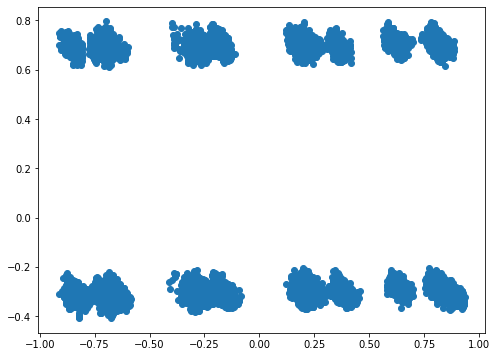

In [ ]:
# Scaled
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
scaler = MinMaxScaler()
vectors = PCA(n_components=2).fit_transform(scaler.fit_transform(df)) #高维度PCA降维到2维
plt.rcParams["figure.figsize"] = (8, 6)
plt.scatter(vectors[:,0],vectors[:,1]) # user

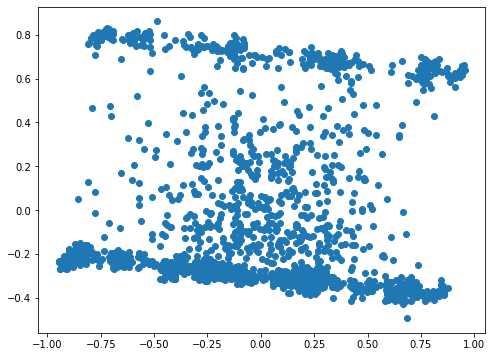

In [ ]:
# Scaled - user
df_user = df.groupby('userID').mean()
scaler = MinMaxScaler()
vectors = PCA(n_components=2).fit_transform(scaler.fit_transform(df_user)) #高维度PCA降维到2维
plt.rcParams["figure.figsize"] = (8, 6)
plt.scatter(vectors[:,0],vectors[:,1]) # user

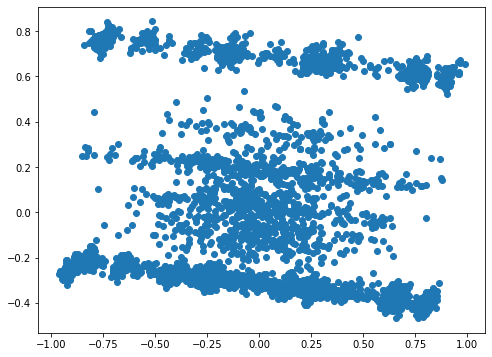

In [ ]:
# Scaled - movie
df_movie = df.groupby('movieID').mean()
scaler = MinMaxScaler()
vectors = PCA(n_components=2).fit_transform(scaler.fit_transform(df_movie)) #高维度PCA降维到2维
plt.rcParams["figure.figsize"] = (8, 6)
plt.scatter(vectors[:,0],vectors[:,1]) # user

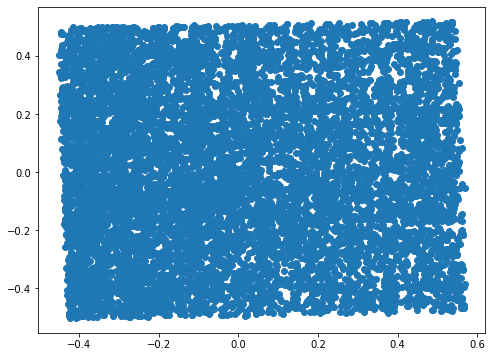

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
scaler = MinMaxScaler()
vectors = PCA(n_components=2).fit_transform(scaler.fit_transform(df.iloc[:,[0,1,2]])) #高维度PCA降维到2维
plt.rcParams["figure.figsize"] = (8, 6)
plt.scatter(vectors[:,0],vectors[:,1]) # user

In [ ]:
estimator = KMeans(n_clusters=100,random_state=0)#构造聚类器
estimator.fit(vectors)#聚类
label_pred = estimator.labels_ #获取聚类标签
centroids = estimator.cluster_centers_ #获取聚类中心
inertia = estimator.inertia_ # 获取聚类准则的总和

res = pd.DataFrame(vectors)
res['label'] = label_pred
res.groupby('label').count()[0] # movie

label
0     109
1      93
2     106
3     105
4     101
     ... 
95    103
96     67
97     76
98     99
99    108
Name: 0, Length: 100, dtype: int64

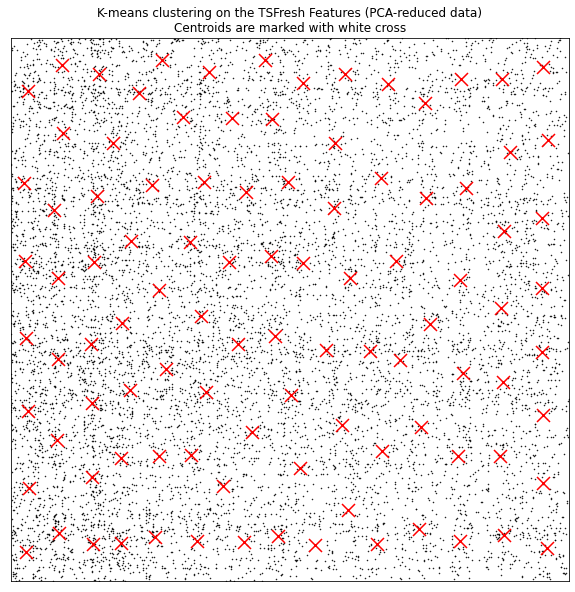

In [ ]:
x_min, x_max = vectors[:, 0].min() - 1, vectors[:, 0].max() + 1
y_min, y_max = vectors[:, 1].min() - 1, vectors[:, 1].max() + 1

plt.rcParams["figure.figsize"] = (10, 10)


plt.plot(vectors[:, 0], vectors[:, 1], 'k.', markersize=1)
# Plot the centroids as a white X
centroids = estimator.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1],
            marker='x', s=169, linewidths=3,
            color='red', zorder=10)
plt.title('K-means clustering on the TSFresh Features (PCA-reduced data)\n'
          'Centroids are marked with white cross')

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())
plt.show()


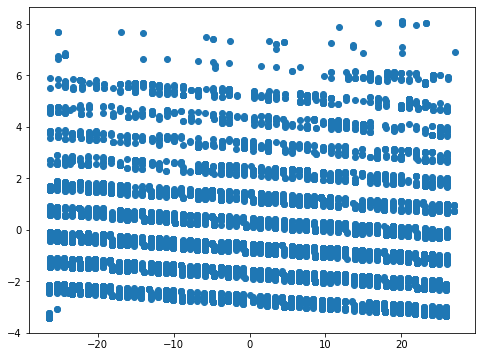

In [ ]:
vectors = PCA(n_components=2).fit_transform(df.iloc[:,[4,5,12,13,14,15,16,17,18,19,20,21,22]]) #高维度PCA降维到2维
plt.rcParams["figure.figsize"] = (8, 6)
plt.scatter(vectors[:,0],vectors[:,1]) # user

In [ ]:
estimator = KMeans(n_clusters=100,random_state=0)#构造聚类器
estimator.fit(vectors)#聚类
label_pred = estimator.labels_ #获取聚类标签
centroids = estimator.cluster_centers_ #获取聚类中心
inertia = estimator.inertia_ # 获取聚类准则的总和

res = pd.DataFrame(vectors)
res['label'] = label_pred
res.groupby('label').count()[0] # movie

label
0     176
1      66
2     171
3     109
4      85
     ... 
95     37
96    119
97    104
98    115
99     97
Name: 0, Length: 100, dtype: int64

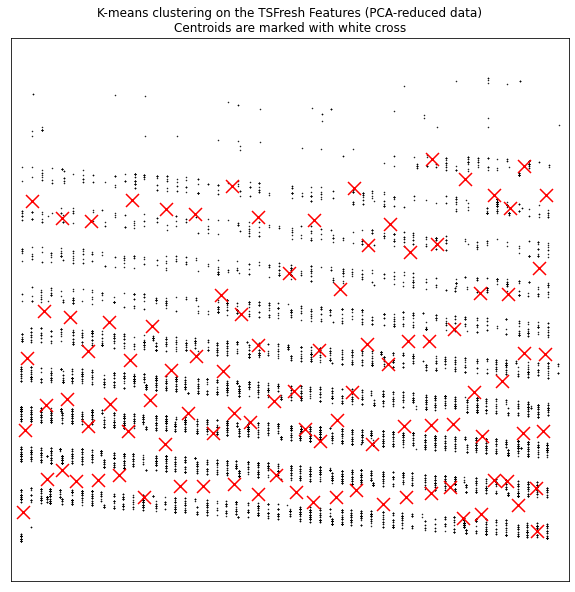

In [ ]:
# movie
x_min, x_max = vectors[:, 0].min() - 1, vectors[:, 0].max() + 1
y_min, y_max = vectors[:, 1].min() - 1, vectors[:, 1].max() + 1

plt.rcParams["figure.figsize"] = (10, 10)


plt.plot(vectors[:, 0], vectors[:, 1], 'k.', markersize=1)
# Plot the centroids as a white X
centroids = estimator.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1],
            marker='x', s=169, linewidths=3,
            color='red', zorder=10)
plt.title('K-means clustering on the TSFresh Features (PCA-reduced data)\n'
          'Centroids are marked with white cross')

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())
plt.show()


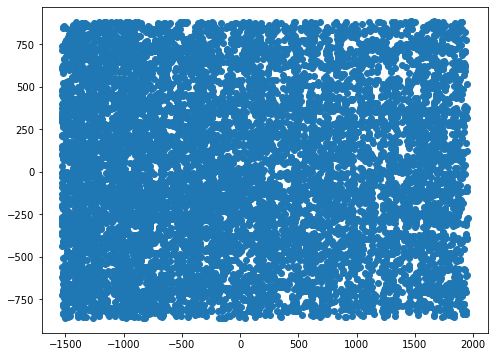

In [ ]:
vectors = PCA(n_components=2).fit_transform(df.iloc[:,[0,1,2,3,4,5,6,7,8,12,13,14,15,16,17,18,19,20,21,22]]) #高维度PCA降维到2维
plt.rcParams["figure.figsize"] = (8, 6)
plt.scatter(vectors[:,0],vectors[:,1]) # user

In [ ]:
estimator = KMeans(n_clusters=100,random_state=0)#构造聚类器
estimator.fit(vectors)#聚类
label_pred = estimator.labels_ #获取聚类标签
centroids = estimator.cluster_centers_ #获取聚类中心
inertia = estimator.inertia_ # 获取聚类准则的总和

res = pd.DataFrame(vectors)
res['label'] = label_pred
res.groupby('label').count()[0] # movie

label
0     108
1     108
2     118
3      95
4     124
     ... 
95     85
96    110
97    107
98     73
99    136
Name: 0, Length: 100, dtype: int64

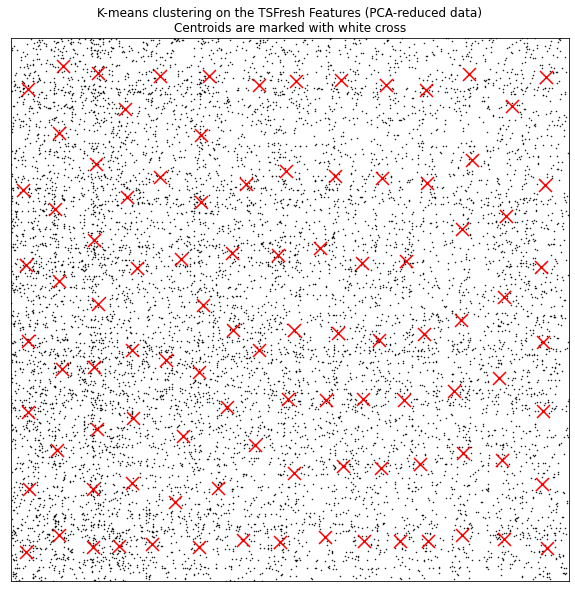

In [ ]:
# movie
x_min, x_max = vectors[:, 0].min() - 1, vectors[:, 0].max() + 1
y_min, y_max = vectors[:, 1].min() - 1, vectors[:, 1].max() + 1

plt.rcParams["figure.figsize"] = (10, 10)


plt.plot(vectors[:, 0], vectors[:, 1], 'k.', markersize=1)
# Plot the centroids as a white X
centroids = estimator.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1],
            marker='x', s=169, linewidths=3,
            color='red', zorder=10)
plt.title('K-means clustering on the TSFresh Features (PCA-reduced data)\n'
          'Centroids are marked with white cross')

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())
plt.show()


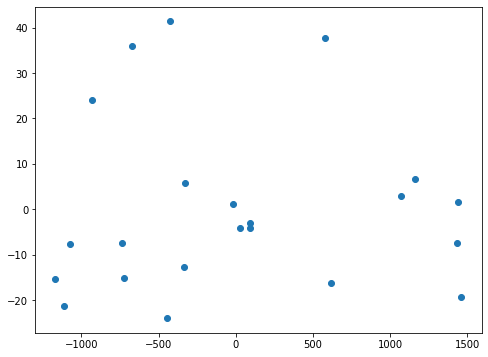

In [ ]:
vectors = PCA(n_components=2).fit_transform(df[df.userID==1607].iloc[:,[0,1,2,3,4,5,6,7,8,12,13,14,15,16,17,18,19,20,21,22]]) #高维度PCA降维到2维
plt.rcParams["figure.figsize"] = (8, 6)
plt.scatter(vectors[:,0],vectors[:,1]) # user

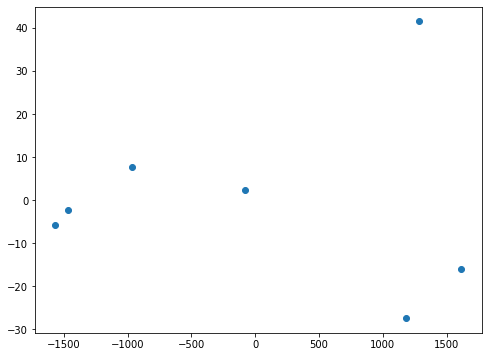

In [ ]:
vectors = PCA(n_components=2).fit_transform(df[df.userID==4].iloc[:,[0,1,2,3,4,5,6,7,8,12,13,14,15,16,17,18,19,20,21,22]]) #高维度PCA降维到2维
plt.rcParams["figure.figsize"] = (8, 6)
plt.scatter(vectors[:,0],vectors[:,1]) # user

In [ ]:
train, test = df.iloc[:8000,:], df.iloc[8000:,:]
train.head()

#### Feature Selection
https://scikit-learn.org/stable/modules/feature_selection.html

In [ ]:
df.iloc[:,3:].head()

,date_day,date_month,date_year,date_hour,date_minute,date_second,time_stamp,dayofweek_num,weekofyear,quarter,days_in_month,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,is_leap_year,is_weekend
628154,17,9,1997,23,40,20,1997-09-17 23:40:20,2,38,3,30,False,False,False,False,False,False,False,1
628167,17,9,1997,23,41,6,1997-09-17 23:41:06,2,38,3,30,False,False,False,False,False,False,False,1
628132,17,9,1997,23,41,58,1997-09-17 23:41:58,2,38,3,30,False,False,False,False,False,False,False,1
628141,17,9,1997,23,43,44,1997-09-17 23:43:44,2,38,3,30,False,False,False,False,False,False,False,1
628180,17,9,1997,23,44,35,1997-09-17 23:44:35,2,38,3,30,False,False,False,False,False,False,False,1


In [ ]:
# Removing features with low variance
import pandas as pd
from sklearn.feature_selection import VarianceThreshold
sel = VarianceThreshold(threshold=(.8 * (1 - .8)))
df_selected = pd.DataFrame(sel.fit_transform(df.filter(regex="[^time_stamp]")))
df_selected.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,51198,608,5,17,9,1997,23,40,20,2,38,3,30,False,1
1,51198,1073,4,17,9,1997,23,41,6,2,38,3,30,False,1
2,51198,141,4,17,9,1997,23,41,58,2,38,3,30,False,1
3,51198,356,4,17,9,1997,23,43,44,2,38,3,30,False,1
4,51198,1198,5,17,9,1997,23,44,35,2,38,3,30,False,1


In [ ]:
y = df_selected.iloc[:,2]
del df_selected[2]

In [ ]:
df_selected

,0,1,3,4,5,6,7,8,9,10,11,12,13,14
0,51198,608,17,9,1997,23,40,20,2,38,3,30,False,1
1,51198,1073,17,9,1997,23,41,6,2,38,3,30,False,1
2,51198,141,17,9,1997,23,41,58,2,38,3,30,False,1
3,51198,356,17,9,1997,23,43,44,2,38,3,30,False,1
4,51198,1198,17,9,1997,23,44,35,2,38,3,30,False,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
855593,60002,58998,5,1,2009,4,20,2,0,2,1,31,False,1
855594,68151,65133,5,1,2009,5,29,53,0,2,1,31,False,1
855595,38726,64620,5,1,2009,5,30,54,0,2,1,31,False,1
855596,59557,3262,5,1,2009,5,31,47,0,2,1,31,False,1


In [ ]:
# Univariate feature selection， 8 best
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_regression

X_new = pd.DataFrame(SelectKBest(mutual_info_regression, k=8).fit_transform(df_selected, y))
X_new

In [ ]:
# y = y.astype('category')
# y
from sklearn import preprocessing
lab_enc = preprocessing.LabelEncoder()
encoded_y = lab_enc.fit_transform(y)
encoded_y

In [ ]:
# L1-based feature selection

from sklearn.svm import LinearSVC
from sklearn.feature_selection import SelectFromModel
lsvc = LinearSVC(C=0.01, penalty="l1", dual=False).fit(df_selected, encoded_y)
model = SelectFromModel(lsvc, prefit=True)
X_new1 = pd.DataFrame(model.transform(df_selected))
X_new1

,0,1,2,3,4,5,6,7,8,9,10,11
0,1333,13,6,2001,4,21,7,0,0,2,24,30
1,784,22,10,2005,17,46,47,1,1,5,42,31
2,53996,7,9,2008,0,49,30,2,2,6,36,30
3,4154,27,10,2005,23,22,38,3,3,3,43,31
4,57243,15,5,2008,7,24,11,4,4,3,20,31
...,...,...,...,...,...,...,...,...,...,...,...,...
9995,6708,5,6,2004,16,50,37,710,495,5,23,30
9996,3526,29,4,2007,15,21,31,150,370,6,17,30
9997,500,21,2,2006,23,21,10,1053,1219,1,8,28
9998,8798,28,12,2008,7,45,54,1310,371,6,52,31


In [ ]:
X_new1.shape

(10000, 12)

In [ ]:
# Tree-based feature selection
from sklearn.ensemble import ExtraTreesClassifier
clf = ExtraTreesClassifier(n_estimators=50)
clf = clf.fit(df_selected, encoded_y)
clf.feature_importances_  

array([0.07746211, 0.09905399, 0.07404763, 0.04101456, 0.05366038,
       0.08397471, 0.09568961, 0.09604592, 0.0810521 , 0.0980969 ,
       0.0586434 , 0.06065124, 0.02507092, 0.02558256, 0.01351313,
       0.01644083])

In [ ]:
model = SelectFromModel(clf, prefit=True)
X_new2 = pd.DataFrame(model.transform(df_selected))
X_new2

,0,1,2,3,4,5,6,7
0,66544,1333,13,4,21,7,0,0
1,29401,784,22,17,46,47,1,1
2,325,53996,7,0,49,30,2,2
3,63198,4154,27,23,22,38,3,3
4,7587,57243,15,7,24,11,4,4
...,...,...,...,...,...,...,...,...
9995,5459,6708,5,16,50,37,710,495
9996,44129,3526,29,15,21,31,150,370
9997,19864,500,21,23,21,10,1053,1219
9998,49527,8798,28,7,45,54,1310,371


In [ ]:
train_X, test_X = X_new.iloc[:8000,:], X_new.iloc[8000:,:]
train_y, test_y = y[:8000], y[8000:]

In [ ]:
train_X.head()

,0,1,2,3,4,5,6,7
0,66544,1333,6,2001,21,0,0,24
1,29401,784,10,2005,46,1,1,42
2,325,53996,9,2008,49,2,2,36
3,63198,4154,10,2005,22,3,3,43
4,7587,57243,5,2008,24,4,4,20


In [ ]:
X_new[2].nunique(),X_new[3].nunique(),X_new[4].nunique(),X_new[5].nunique(),X_new[6].nunique(),X_new[7].nunique()

(12, 13, 60, 1742, 3485, 53)

#### 直接输入时间特征

In [ ]:
movie_input = Input(shape=[1],name='Item')
movie_embedding = Embedding(n_movies, 3, name='Movie-Embedding')(movie_input)
movie_vec = Flatten(name='FlattenMovies')(movie_embedding)

user_input = Input(shape=[1],name='User')
user_embedding = Embedding(n_users, 3, name='User-Embedding')(user_input)
user_vec = Flatten(name='FlattenUsers')(user_embedding)

month_input = Input(shape=[1],name='Month')
month_embedding = Embedding(12+1, 3, name='Month-Embedding')(month_input)
month_vec = Flatten(name='FlattenMonth')(month_embedding)

year_input = Input(shape=[1],name='Year')
year_embedding = Embedding(13+1, 3, name='Year-Embedding')(year_input)
year_vec = Flatten(name='FlattenYear')(year_embedding)

F4_input = Input(shape=[1],name='F4')
F4_embedding = Embedding(60+1, 3, name='F4-Embedding')(F4_input)
F4_vec = Flatten()(F4_embedding)

# F5_input = Input(shape=[1],name='F5')
# F5_embedding = Embedding(1742+1, 3, name='F5-Embedding')(F5_input)
# F5_vec = Flatten()(F5_embedding)

# F6_input = Input(shape=[1],name='F6')
# F6_embedding = Embedding(3485+1, 3, name='F6-Embedding')(F6_input)
# F6_vec = Flatten()(F6_embedding)

F7_input = Input(shape=[1],name='F7')
F7_embedding = Embedding(53+1, 3, name='F7-Embedding')(F7_input)
F7_vec = Flatten()(F7_embedding)


# week_input = Input(shape=[1],name='Week')
# week_embedding = Embedding(53, 3, name='Week-Embedding')(week_input)
# week_vec = Flatten(name='FlattenWeek')(user_embedding)

# day_input = Input(shape=[1],name='Day')
# day_embedding = Embedding(7, 3, name='Day-Embedding')(day_input)
# day_vec = Flatten(name='FlattenDay')(day_embedding)

concat = concatenate([movie_vec, user_vec, year_vec, month_vec, F4_vec, F7_vec], name='Concat')
# concat = Dropout(0.2, name='Dropout_concat')(concat)

# dense = Dense(200,name='FullyConnected')(concat)
# dense = Dropout(0.2, name='Dropout')(dense)
dense_2 = Dense(200, name='FullyConnected-1')(concat)
dense_2 = Dropout(0.2, name='Dropout2')(dense_2)
dense_3 = Dense(50, name='FullyConnected-2')(dense_2)
dense_3 = Dropout(0.2, name='Dropout3')(dense_3)
dense_4 = Dense(20, name='FullyConnected-3', activation='relu')(dense_3)


result = Dense(1,activation="linear",name='Activation')(dense_4)

model = Model([user_input, movie_input, year_input, month_input, F4_input, F7_input], result)
model.compile('rmsprop', 'mean_squared_error')
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Item (InputLayer)               [(None, 1)]          0                                            
__________________________________________________________________________________________________
User (InputLayer)               [(None, 1)]          0                                            
__________________________________________________________________________________________________
Year (InputLayer)               [(None, 1)]          0                                            
__________________________________________________________________________________________________
Month (InputLayer)              [(None, 1)]          0                                            
____________________________________________________________________________________________

In [ ]:
train_X

,0,1,2,3,4,5,6,7
0,66544,1333,6,2001,21,0,0,24
1,29401,784,10,2005,46,1,1,42
2,325,53996,9,2008,49,2,2,36
3,63198,4154,10,2005,22,3,3,43
4,7587,57243,5,2008,24,4,4,20
...,...,...,...,...,...,...,...,...
7995,23634,8951,7,2005,23,441,2576,26
7996,1278,2253,5,2004,8,1428,1065,21
7997,40827,2470,6,2006,41,547,2597,22
7998,15061,1932,8,2006,41,107,3123,35


In [ ]:
train_X[5] = train_X[5].astype('category').cat.codes.values
train_X[6] = train_X[6].astype('category').cat.codes.values
train_X[2] = train_X[2].astype('category').cat.codes.values
train_X[3] = train_X[3].astype('category').cat.codes.values
train_X[4] = train_X[4].astype('category').cat.codes.values
train_X[7] = train_X[7].astype('category').cat.codes.values

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

In [ ]:
history = model.fit([train_X[5], train_X[6], train_X[3], train_X[2], train_X[4], train_X[7]], train_y, epochs=100, batch_size=256)


Epoch 1/100
32/32 [==============================] - 1s 4ms/step - loss: 8.1889
Epoch 2/100
32/32 [==============================] - 0s 4ms/step - loss: 1.0721
Epoch 3/100
32/32 [==============================] - 0s 4ms/step - loss: 0.9551
Epoch 4/100
32/32 [==============================] - 0s 4ms/step - loss: 0.8522
Epoch 5/100
32/32 [==============================] - 0s 4ms/step - loss: 0.7488
Epoch 6/100
32/32 [==============================] - 0s 4ms/step - loss: 0.6455
Epoch 7/100
32/32 [==============================] - 0s 4ms/step - loss: 0.6004
Epoch 8/100
32/32 [==============================] - 0s 4ms/step - loss: 0.5804
Epoch 9/100
32/32 [==============================] - 0s 4ms/step - loss: 0.5360
Epoch 10/100
32/32 [==============================] - 0s 4ms/step - loss: 0.4930
Epoch 11/100
32/32 [==============================] - 0s 4ms/step - loss: 0.4957
Epoch 12/100
32/32 [==============================] - 0s 4ms/step - loss: 0.4753
Epoch 13/100
32/32 [=================

Text(0, 0.5, 'Train Error')

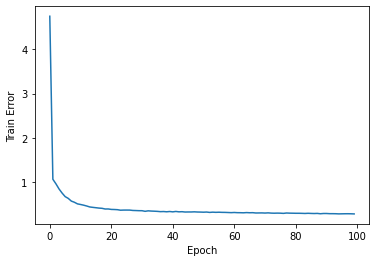

In [ ]:
import pandas as pd
pd.Series(history.history['loss']).plot(logy=False)
plt.xlabel("Epoch")
plt.ylabel("Train Error")

In [ ]:
test_X[5] = test_X[5].astype('category').cat.codes.values
test_X[6] = test_X[6].astype('category').cat.codes.values
test_X[2] = test_X[2].astype('category').cat.codes.values
test_X[3] = test_X[3].astype('category').cat.codes.values
test_X[4] = test_X[4].astype('category').cat.codes.values
test_X[7] = test_X[7].astype('category').cat.codes.values

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

In [ ]:
y_hat = np.round(model.predict([test_X[5], test_X[6], test_X[3], test_X[2], test_X[4], test_X[7]]),2)
y_true = test.rating
from sklearn.metrics import mean_absolute_error
mean_absolute_error(y_true, y_hat) #MAE

1.0897349978219717

对比: 手动features选择的

In [ ]:
df.date_year.nunique(),df.date_month.nunique(),df.dayofweek_num.nunique(),df.weekofyear.nunique()

(13, 12, 7, 53)

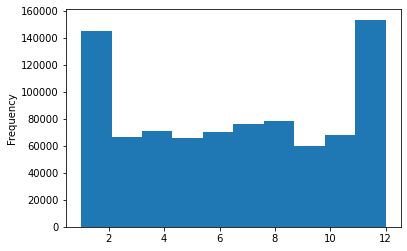

In [ ]:
# df.date_year.plot.hist()
df.date_month.plot.hist()
# df.dayofweek_num.plot.hist()
# df.weekofyear.plot.hist()

In [ ]:
df.date_year.unique()

array([1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007,
       2008, 2009])

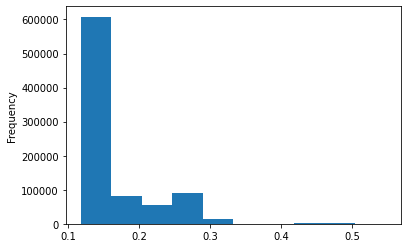

In [ ]:
# idf weight
def idfW(col):
  nuni = df[col].nunique()
  total = len(df)
  dict_freq = dict(df[col].value_counts())
  idf = [(1/nuni) * np.log(total/dict_freq[i]) for i in df[col]]
  return idf
month = idfW('date_month')
year = idfW('date_year')
day = idfW('dayofweek_num')
week = idfW('weekofyear')
pd.Series(year).plot.hist()

In [ ]:
df['month'] = month
df['year'] = year
df['day'] = day
df['week'] = week

In [ ]:
dict_user = dict(zip(df['userID'].unique(),range(df.userID.nunique())))
dict_movie = dict(zip(df['movieID'].unique(),range(df.movieID.nunique())))
df['newUID'] = df.userID.apply(lambda x: dict_user[x])
df['newMID'] = df.movieID.apply(lambda x: dict_movie[x])

train, test = df.iloc[:8000,:], df.iloc[8000:,:]

len(dict_user),len(dict_movie)

(2113, 10109)

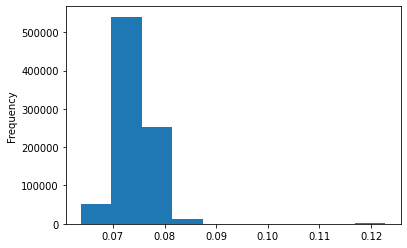

In [ ]:
pd.Series(week).plot.hist()


In [ ]:
movie_input = Input(shape=[1],name='Item')
movie_embedding = Embedding(n_movies, 3, name='Movie-Embedding')(movie_input)
movie_vec = Flatten(name='FlattenMovies')(movie_embedding)

user_input = Input(shape=[1],name='User')
user_embedding = Embedding(n_users, 3, name='User-Embedding')(user_input)
user_vec = Flatten(name='FlattenUsers')(user_embedding)

year_input = Input(shape=[1],name='Year')
year_embedding = Embedding(13, 3, name='Year-Embedding')(year_input)
year_vec = Flatten(name='FlattenYear')(year_embedding)

month_input = Input(shape=[1],name='Month')
month_embedding = Embedding(12+1, 3, name='Month-Embedding')(month_input)
month_vec = Flatten(name='FlattenMonth')(month_embedding)

week_input = Input(shape=[1],name='Week')
week_embedding = Embedding(53, 3, name='Week-Embedding')(week_input)
week_vec = Flatten(name='FlattenWeek')(user_embedding)

day_input = Input(shape=[1],name='Day')
day_embedding = Embedding(7, 3, name='Day-Embedding')(day_input)
day_vec = Flatten(name='FlattenDay')(day_embedding)

concat = concatenate([movie_vec, user_vec, year_vec, month_vec, day_vec, week_vec], name='Concat')
# concat = Dropout(0.2, name='Dropout_concat')(concat)

# dense = Dense(200,name='FullyConnected')(concat)
# dense = Dropout(0.2, name='Dropout')(dense)
dense_2 = Dense(200, name='FullyConnected-1')(concat)
dense_2 = Dropout(0.2, name='Dropout2')(dense_2)
dense_3 = Dense(50, name='FullyConnected-2')(dense_2)
dense_3 = Dropout(0.2, name='Dropout3')(dense_3)
dense_4 = Dense(20, name='FullyConnected-3', activation='relu')(dense_3)


result = Dense(1,activation="linear",name='Activation')(dense_4)

model = Model([user_input, movie_input, year_input, month_input, day_input, week_input], result)
model.compile('rmsprop', 'mean_squared_error')
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Item (InputLayer)               [(None, 1)]          0                                            
__________________________________________________________________________________________________
User (InputLayer)               [(None, 1)]          0                                            
__________________________________________________________________________________________________
Year (InputLayer)               [(None, 1)]          0                                            
__________________________________________________________________________________________________
Month (InputLayer)              [(None, 1)]          0                                            
____________________________________________________________________________________________

In [ ]:
# idf weight
history = model.fit([train.newUID, train.newMID, train.year, train.month, train.day, train.week], train.rating, epochs=100, batch_size=256)

Epoch 1/100
32/32 [==============================] - 1s 4ms/step - loss: 10.8694
Epoch 2/100
32/32 [==============================] - 0s 4ms/step - loss: 1.6028
Epoch 3/100
32/32 [==============================] - 0s 4ms/step - loss: 1.1156
Epoch 4/100
32/32 [==============================] - 0s 4ms/step - loss: 0.9503
Epoch 5/100
32/32 [==============================] - 0s 4ms/step - loss: 0.8561
Epoch 6/100
32/32 [==============================] - 0s 4ms/step - loss: 0.7655
Epoch 7/100
32/32 [==============================] - 0s 4ms/step - loss: 0.7326
Epoch 8/100
32/32 [==============================] - 0s 4ms/step - loss: 0.6839
Epoch 9/100
32/32 [==============================] - 0s 4ms/step - loss: 0.6867
Epoch 10/100
32/32 [==============================] - 0s 4ms/step - loss: 0.6925
Epoch 11/100
32/32 [==============================] - 0s 4ms/step - loss: 0.6609
Epoch 12/100
32/32 [==============================] - 0s 4ms/step - loss: 0.6524
Epoch 13/100
32/32 [================

In [ ]:
history = model.fit([train.newUID, train.newMID, train.date_year, train.date_month, ], train.rating, epochs=100, batch_size=256)

Epoch 1/100
32/32 [==============================] - 1s 4ms/step - loss: 7.3699
Epoch 2/100
32/32 [==============================] - 0s 4ms/step - loss: 1.0991
Epoch 3/100
32/32 [==============================] - 0s 4ms/step - loss: 1.0132
Epoch 4/100
32/32 [==============================] - 0s 4ms/step - loss: 0.9132
Epoch 5/100
32/32 [==============================] - 0s 4ms/step - loss: 0.8047
Epoch 6/100
32/32 [==============================] - 0s 4ms/step - loss: 0.7206
Epoch 7/100
32/32 [==============================] - 0s 4ms/step - loss: 0.6608
Epoch 8/100
32/32 [==============================] - 0s 4ms/step - loss: 0.6256
Epoch 9/100
32/32 [==============================] - 0s 4ms/step - loss: 0.5338
Epoch 10/100
32/32 [==============================] - 0s 4ms/step - loss: 0.5204
Epoch 11/100
32/32 [==============================] - 0s 4ms/step - loss: 0.5155
Epoch 12/100
32/32 [==============================] - 0s 4ms/step - loss: 0.4761
Epoch 13/100
32/32 [=================

Text(0, 0.5, 'Train Error')

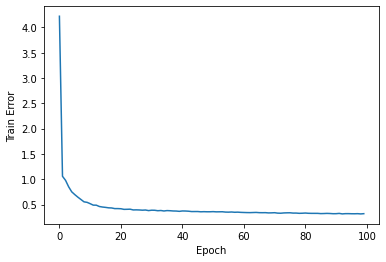

In [ ]:
import pandas as pd
pd.Series(history.history['loss']).plot(logy=False)
plt.xlabel("Epoch")
plt.ylabel("Train Error")

In [ ]:
# year, month
y_hat = np.round(model.predict([test.newUID, test.newMID, test.date_year, test.date_month, ]),2)
y_true = test.rating
from sklearn.metrics import mean_absolute_error
mean_absolute_error(y_true, y_hat) #MAE

0.859885002091527

In [ ]:
# idf weight year, month
y_hat = model.predict([test.newUID, test.newMID, test.year, test.month, ])
y_true = test.rating
from sklearn.metrics import mean_absolute_error
mean_absolute_error(y_true, y_hat) #MAE

0.8846248812663678

In [ ]:
# idf weight year, month, day, week
y_hat = model.predict([test.newUID, test.newMID, test.year, test.month, test.day, test.week])
y_true = test.rating
from sklearn.metrics import mean_absolute_error
mean_absolute_error(y_true, y_hat) #MAE

0.9570103481121258

In [ ]:
y_

array([[4.59],
       [3.55],
       [4.98],
       ...,
       [1.99],
       [3.17],
       [3.77]], dtype=float32)

Linear regression

In [ ]:
df.head()

,userID,movieID,rating,date_day,date_month,date_year,date_hour,date_minute,date_second,time_stamp,newUID,newMID,dayofweek_num,weekofyear
121,780,254,3.0,21,9,0,15,28,56,1997-09-21 15:28:56,1040,3293,6,38
295,780,205,3.0,22,10,0,15,51,45,1997-10-22 15:51:45,1040,1651,2,43
326,216,631,2.0,10,11,0,15,11,48,1997-11-10 15:11:48,83,837,0,46
334,216,281,3.0,10,11,0,15,28,28,1997-11-10 15:28:28,83,269,0,46
441,241,321,3.0,11,11,0,14,2,19,1997-11-11 14:02:19,654,3299,1,46


In [ ]:
import numpy as np
from sklearn.linear_model import LinearRegression
reg = LinearRegression().fit(train.iloc[:,[0,1,3,4,5,6,7,8,10,11,12,13]].values, train.rating)
reg.score(train.iloc[:,[0,1,3,4,5,6,7,8,10,11,12,13]].values, train.rating)

0.014722218550229593

In [ ]:
reg.coef_

array([-1.70218622e-05,  4.78912298e-06,  1.41750447e-03, -1.74570217e-02,
       -1.13712544e-02, -2.85414407e-03, -4.85477343e-04,  2.84894359e-04,
        2.04564986e-04, -9.00074563e-05, -1.85086573e-03,  3.74958990e-03])

rating + tag tsfresh embed (4k rows joined dataset without sampling)

Text(0, 0.5, 'Train Error')

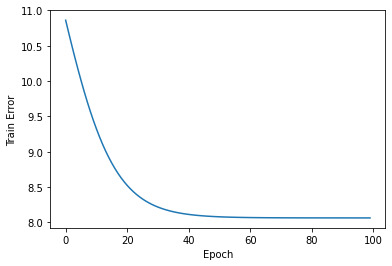

In [ ]:
pd.Series(history.history['loss']).plot(logy=False)
plt.xlabel("Epoch")
plt.ylabel("Train Error")

In [ ]:
y_hat = np.round(model.predict([test.newUID, test.newMID]),2)
y_true = test.rating
from sklearn.metrics import mean_absolute_error
mean_absolute_error(y_true, y_hat) #MAE

2.620932754880694

### Orig MF

In [ ]:
import keras
import pickle
from IPython.display import SVG
from keras.optimizers import Adam
from keras.utils.vis_utils import model_to_dot
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error
n_users, n_movies = len(df_filtered.userID.unique()), len(df_filtered.movieID.unique())
df_filtered.userID = df_filtered.userID.astype('category').cat.codes.values
df_filtered.movieID = df_filtered.movieID.astype('category').cat.codes.values


print(n_users, n_movies)

1742 3485


In [ ]:
# 按照时间顺序分割数据集为train/test set
train_size = int(len(df_filtered) * 0.8)
train, test = df_filtered.iloc[:train_size,:], df_filtered.iloc[train_size:,:]

train.reset_index(drop=True, inplace=True)
test.reset_index(drop=True, inplace=True)

train.shape, test.shape

((8000, 11), (2000, 11))

In [ ]:
train.head()

,userID,movieID,rating,date_day,date_month,date_year,date_hour,date_minute,date_second,time_stamp,y_m
0,780,254,3.0,21,9,1997,15,28,56,1997-09-21 15:28:56,2004_7
1,780,205,3.0,22,10,1997,15,51,45,1997-10-22 15:51:45,2004_7
2,216,631,2.0,10,11,1997,15,11,48,1997-11-10 15:11:48,2004_5
3,216,281,3.0,10,11,1997,15,28,28,1997-11-10 15:28:28,2004_7
4,241,321,3.0,11,11,1997,14,2,19,1997-11-11 14:02:19,2004_5


In [ ]:
from keras.layers import *
from keras.models import Model
n_latent_factors = 20
movie_input = Input(shape=[1],name='Item')
movie_embedding = Embedding(n_movies + 1, n_latent_factors, name='Movie-Embedding')(movie_input)
movie_vec = Flatten(name='FlattenMovies')(movie_embedding)

user_input = Input(shape=[1],name='User')
user_embedding = Embedding(n_users + 1, n_latent_factors,name='User-Embedding')(user_input)
user_vec = Flatten(name='FlattenUsers')(user_embedding)
prod = dot([movie_vec, user_vec], (1),name='DotProduct')
model = Model([user_input, movie_input], prod)
model.compile('adam', 'mean_squared_error')
model.summary()

Model: "model_9"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Item (InputLayer)               [(None, 1)]          0                                            
__________________________________________________________________________________________________
User (InputLayer)               [(None, 1)]          0                                            
__________________________________________________________________________________________________
Movie-Embedding (Embedding)     (None, 1, 20)        69720       Item[0][0]                       
__________________________________________________________________________________________________
User-Embedding (Embedding)      (None, 1, 20)        34860       User[0][0]                       
____________________________________________________________________________________________

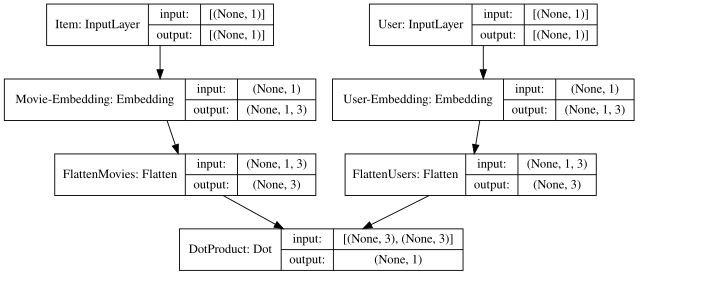

In [ ]:
SVG(model_to_dot(model,show_shapes=True, show_layer_names=True, rankdir='HB', dpi=65).create(prog='dot', format='svg'))

In [ ]:
history = model.fit([train.userID, train.movieID], train.rating, epochs=100, batch_size=256)

Epoch 1/100
32/32 [==============================] - 1s 4ms/step - loss: 12.9267
Epoch 2/100
32/32 [==============================] - 0s 4ms/step - loss: 12.7650
Epoch 3/100
32/32 [==============================] - 0s 4ms/step - loss: 12.8379
Epoch 4/100
32/32 [==============================] - 0s 3ms/step - loss: 12.7947
Epoch 5/100
32/32 [==============================] - 0s 4ms/step - loss: 12.7692
Epoch 6/100
32/32 [==============================] - 0s 3ms/step - loss: 12.6399
Epoch 7/100
32/32 [==============================] - 0s 4ms/step - loss: 12.6197
Epoch 8/100
32/32 [==============================] - 0s 4ms/step - loss: 12.5105
Epoch 9/100
32/32 [==============================] - 0s 3ms/step - loss: 12.4042
Epoch 10/100
32/32 [==============================] - 0s 4ms/step - loss: 12.1145
Epoch 11/100
32/32 [==============================] - 0s 4ms/step - loss: 11.8880
Epoch 12/100
32/32 [==============================] - 0s 4ms/step - loss: 11.6502
Epoch 13/100
32/32 [=====

Text(0, 0.5, 'Train Error')

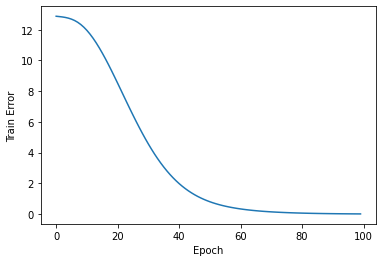

In [ ]:
pd.Series(history.history['loss']).plot(logy=False)
plt.xlabel("Epoch")
plt.ylabel("Train Error")

In [ ]:
y_hat = np.round(model.predict([test.userID, test.movieID]),2)
y_true = test.rating
from sklearn.metrics import mean_absolute_error
mean_absolute_error(y_true, y_hat) #MAE

3.415600000408478

In [ ]:
df_rec = test.iloc[:,:3].copy()
df_rec["pred"] = y_hat
df_rec.head()

,userID,movieID,rating,pred
0,58,3233,4.0,-2.76
1,218,1273,5.0,-0.73
2,218,1002,3.0,-3.03
3,218,1229,0.5,0.24
4,1539,1605,3.0,1.11


In [ ]:
with open('/content/drive/MyDrive/PY/TimeSeriesRecSys/Data_HetRec/df_rec_timeOrder.pickle', 'wb') as handle:
    pickle.dump(df_rec, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
with open('/content/drive/MyDrive/PY/TimeSeriesRecSys/Data_HetRec/df_rec_timeOrder.pickle', 'rb') as handle:
    df_rec = pickle.load(handle)

In [ ]:
df_rec = df_rec.sort_values(by=['userID','rating'],ascending=False)
df_rec_true = df_rec[df_rec['rating']>3]
df_rec_true

,userID,movieID,rating,pred
855582,2112,7238,5.0,4.03
855461,2112,782,5.0,4.47
855440,2112,133,5.0,3.48
855489,2112,1076,5.0,4.21
855487,2112,1030,5.0,4.13
...,...,...,...,...
430,1,5116,4.0,3.75
324,1,2816,4.0,3.87
514,1,8809,4.0,4.24
471,1,6563,4.0,4.22


In [ ]:
len(df_rec_true.userID.unique())

1531

In [ ]:
df_rec_pred = df_rec[df_rec['pred']>3]
df_rec_pred = df_rec_pred.sort_values(by=['userID','pred'],ascending=False)
df_rec_pred

,userID,movieID,rating,pred
855559,2112,3435,4.5,4.76
855568,2112,4806,4.0,4.50
855461,2112,782,5.0,4.47
855558,2112,3327,4.5,4.45
855593,2112,9023,4.0,4.40
...,...,...,...,...
430,1,5116,4.0,3.75
195,1,1184,3.0,3.70
438,1,5510,4.5,3.63
508,1,7914,4.5,3.59


In [ ]:
len(df_rec_pred.userID.unique())

827

In [ ]:
rec_true = df_rec_true.groupby('userID').apply(lambda x: list(x['movieID']))
rec_true

userID
1       [9111, 9011, 8748, 7048, 9131, 9232, 1060, 28,...
2       [9056, 8852, 9365, 9086, 9019, 9002, 5171, 898...
3       [1103, 9089, 171, 3634, 3695, 2313, 7789, 9011...
4       [9496, 2492, 3180, 7106, 7327, 4095, 2578, 289...
5       [6128, 8748, 249, 1078, 1079, 141, 3706, 1030,...
                              ...                        
2107    [1429, 1813, 343, 2340, 782, 582, 105, 220, 15...
2108    [343, 461, 0, 9487, 1078, 1441, 1079, 782, 612...
2109    [9232, 8775, 1083, 5908, 6583, 1737, 3905, 283...
2110    [9062, 9273, 9134, 9211, 9365, 9259, 6714, 936...
2112    [7238, 782, 133, 1076, 1030, 35, 1746, 1102, 1...
Length: 1531, dtype: object

In [ ]:
rec_pred = df_rec_pred.groupby('userID').apply(lambda x: list(x['movieID']))
rec_pred

userID
1       [106, 9111, 1060, 3800, 8157, 9232, 7048, 8825...
3       [1103, 3634, 3695, 6387, 2313, 7789, 9011, 171...
4       [7071, 4095, 7106, 6887, 295, 7327, 2492, 3180...
5       [1078, 249, 782, 1079, 5328, 570, 343, 4550, 9...
6       [782, 9023, 700, 1102, 285, 7204, 7555, 9232, ...
                              ...                        
2104    [1813, 1441, 1412, 1063, 572, 2500, 1155, 7546...
2105    [818, 9023, 3905, 7017, 5615, 5843, 570, 867, ...
2109    [2877, 7213, 2834, 4588, 700, 106, 1090, 285, ...
2110    [9062, 9211, 9200, 9273, 6451, 9156, 9134, 925...
2112    [3435, 4806, 782, 3327, 9023, 306, 860, 1057, ...
Length: 827, dtype: object

In [ ]:
res = pd.DataFrame(rec_true)
res['pred'] = rec_pred
res.columns = ['true','pred']
res = res.dropna() # drop null predictions
res

,true,pred
userID,,
1,"[9111, 9011, 8748, 7048, 9131, 9232, 1060, 28,...","[106, 9111, 1060, 3800, 8157, 9232, 7048, 8825..."
3,"[1103, 9089, 171, 3634, 3695, 2313, 7789, 9011...","[1103, 3634, 3695, 6387, 2313, 7789, 9011, 171..."
4,"[9496, 2492, 3180, 7106, 7327, 4095, 2578, 289...","[7071, 4095, 7106, 6887, 295, 7327, 2492, 3180..."
5,"[6128, 8748, 249, 1078, 1079, 141, 3706, 1030,...","[1078, 249, 782, 1079, 5328, 570, 343, 4550, 9..."
6,"[343, 9023, 7204, 5965, 7555, 9397, 9638]","[782, 9023, 700, 1102, 285, 7204, 7555, 9232, ..."
...,...,...
2104,"[5565, 9005, 8748, 9185, 570, 1813, 2272, 1441...","[1813, 1441, 1412, 1063, 572, 2500, 1155, 7546..."
2105,"[7017, 8969, 9211, 5843, 7578, 8503, 3914, 545...","[818, 9023, 3905, 7017, 5615, 5843, 570, 867, ..."
2109,"[9232, 8775, 1083, 5908, 6583, 1737, 3905, 283...","[2877, 7213, 2834, 4588, 700, 106, 1090, 285, ..."


# User Clusters

Text(0.5, 1.0, "Number of User's Predicted Items")

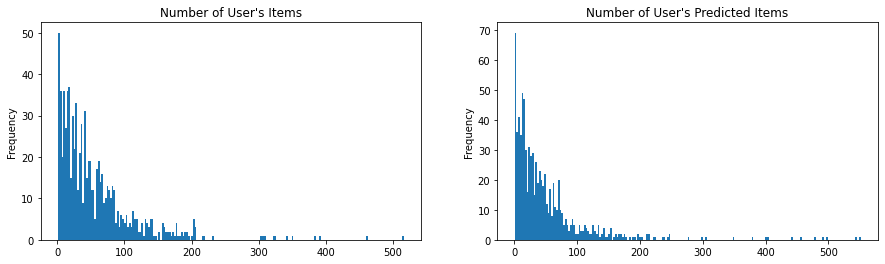

In [ ]:
plt.rcParams["figure.figsize"] = (15,4)
plt.subplot('121')
res.true.apply(len).plot.hist(bins=200)
plt.title("Number of User's Items")
plt.subplot('122')
res.pred.apply(len).plot.hist(bins=200)
plt.title("Number of User's Predicted Items")

In [ ]:
clusters = [0, 5, 10, 20, 50, 100, 200, 549]
user_clusters = {}
for i in range(len(clusters)-1):
  user_clusters[str(clusters[i])+'_'+str(clusters[i+1])] = \
   res.index[res.true.apply(len).apply(lambda x: x>clusters[i] and x<=clusters[i+1])]

In [ ]:
for k,v in user_clusters.items():
  print(k+':',len(v))

0_5: 71
5_10: 61
10_20: 117
20_50: 247
50_100: 201
100_200: 101
200_549: 23


0_5: 0.7913183098591549
5_10: 0.7609426229508196
10_20: 0.7252717948717949
20_50: 0.7129036437246964
50_100: 0.7235691542288558
100_200: 0.7415861386138615
200_549: 0.6888869565217391
ALL: 0.7304836784409257


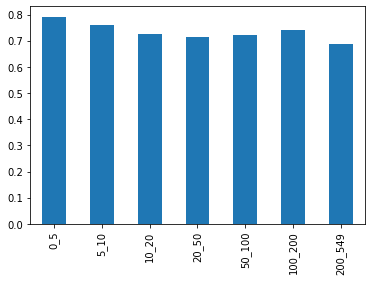

In [ ]:
# Precision
def metrics_clusters(f=recommender_precision, res=res,verbose=0):
  res_dict = {}
  for k,v in user_clusters.items():
    res_dict[k] = f(res.pred[v], res.true[v])
  if verbose == 1:
    for k,v in res_dict.items():
      print(k+':',v)
    print('ALL:',f(res.pred, res.true))
  pd.Series(res_dict).plot.bar()
metrics_clusters(verbose=1)

0_5: 0.8143197183098592
5_10: 0.6861459016393443
10_20: 0.6390299145299146
20_50: 0.6184396761133605
50_100: 0.6021925373134328
100_200: 0.6179118811881188
200_549: 0.7521434782608695
ALL: 0.6430472594397078


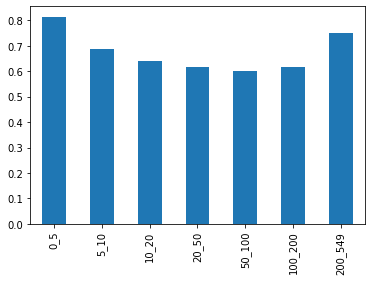

In [ ]:
# Recall
metrics_clusters(recommender_recall, verbose=1)

0_5: 0.536366351510964
5_10: 0.7341641356999454
10_20: 1.178673330833265
20_50: 0.6492105096481928
50_100: 0.6392180658755587
100_200: 0.6179414623235597
200_549: 0.6077581796017425
ALL: 0.6531567090813027


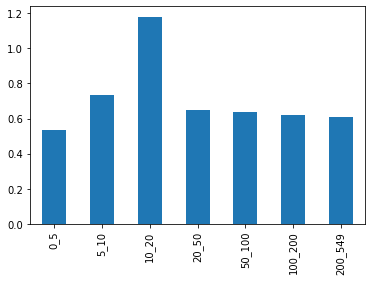

In [ ]:
# MSE
plt.rcParams["figure.figsize"] = (6,4)
res_dict = {}
for k,v in user_clusters.items():
  df_rec_pred_c = df_rec_pred[df_rec_pred.userID.apply(lambda x: x in v)].copy()
  res_dict[k] = mse(df_rec_pred_c.pred, df_rec_pred_c.rating)
  print(k+':', res_dict[k])
print('ALL:',mse(df_rec_pred.pred, df_rec_pred.rating))
pd.Series(res_dict).plot.bar()

0_5: 0.030845070422535217
5_10: 0.08688524590163935
10_20: 0.16367521367521354
20_50: 0.354777327935223
50_100: 0.6929353233830846
100_200: 1.3345544554455444
200_549: 3.681739130434783
ALL: 0.5761510353227766


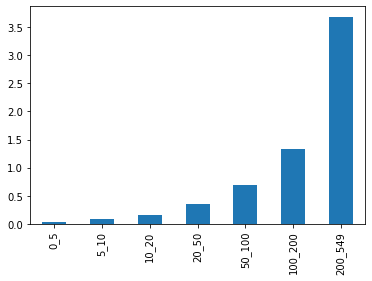

In [ ]:
# Prediction coverage
plt.rcParams["figure.figsize"] = (6,4)
res_dict = {}
for k,v in user_clusters.items():
  res_dict[k] = prediction_coverage(res.pred[v], catalog=train.movieID.unique()) 
  print(k+':',res_dict[k])
print('ALL:',prediction_coverage(res.pred, catalog=train.movieID.unique()))
pd.Series(res_dict).plot.bar()

Text(0.5, 1.0, 'MAP @ Top-N for Each User Cluster')

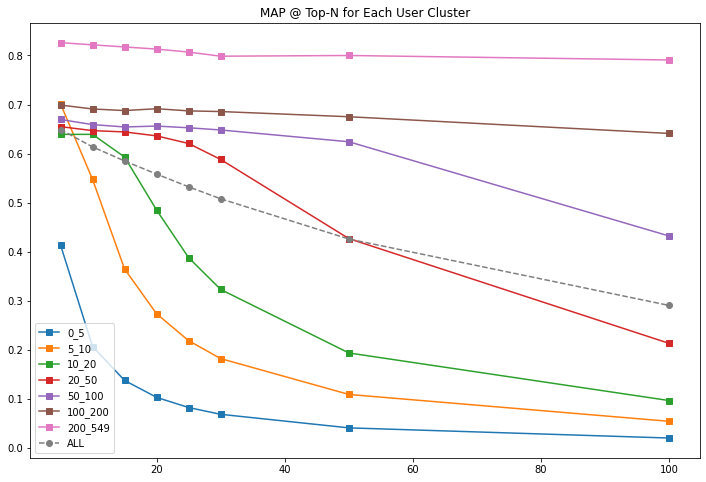

In [ ]:
plt.rcParams["figure.figsize"] = (12,8)
ks = [5,10,15,20,25,30,50,100]
for _,v in user_clusters.items():
  maps = {}
  for k in ks:
    maps[k] = mapk(res.pred[v], res.true[v], k=k)
  pd.Series(maps).plot(style='s-')
map_all = pd.Series([mapk(res.pred, res.true, k=k) for k in ks])
map_all.index=ks
map_all.plot(style='o--')
legends = list(user_clusters.keys())
legends.append('ALL')
plt.legend(legends)
plt.title(f"MAP @ Top-N for Each User Cluster")

Text(0.5, 1.0, 'MAR @ Top-N for Each User Cluster')

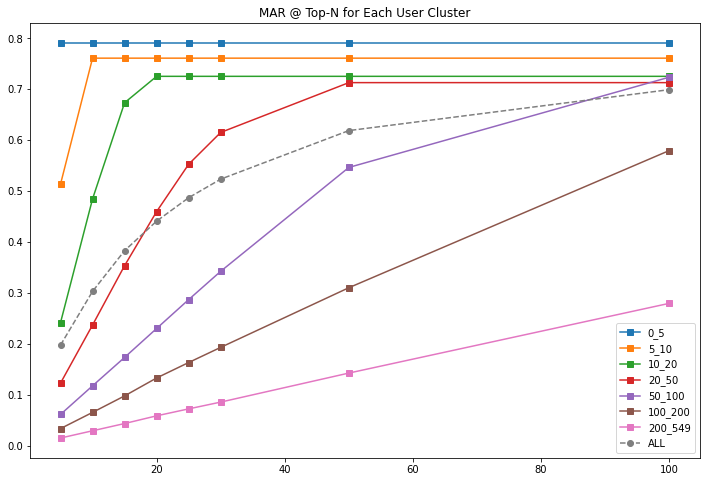

In [ ]:
plt.rcParams["figure.figsize"] = (12,8)
ks = [5,10,15,20,25,30,50,100]
for _,v in user_clusters.items():
  mars = {}
  for k in ks:
    mars[k] = mark(res.pred[v], res.true[v], k=k)
  pd.Series(mars).plot(style='s-')
mar_all = pd.Series([mark(res.pred, res.true, k=k) for k in ks])
mar_all.index=ks
mar_all.plot(style='o--')
plt.legend(legends)
plt.title(f"MAR @ Top-N for Each User Cluster")

Text(0.5, 1.0, 'Novelty @ Top-N for Each User Cluster')

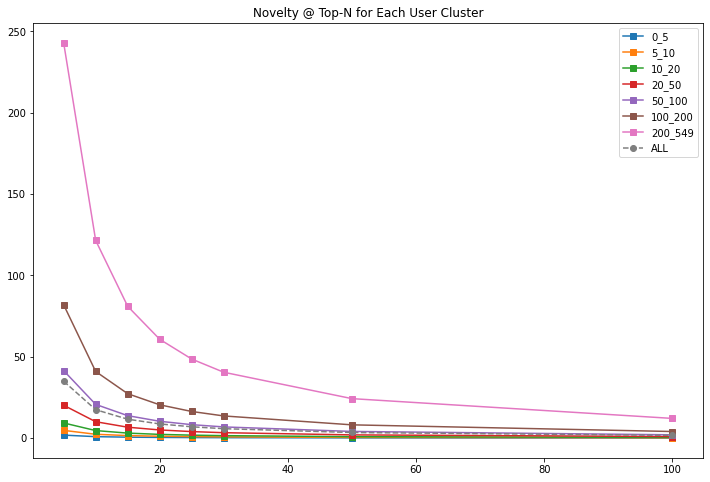

In [ ]:
plt.rcParams["figure.figsize"] = (12,8)
pop_dict = dict(train.movieID.value_counts())
for _,v in user_clusters.items():
  ns = {}
  for k in ks:
    ns[k] = novelty(res.pred[v], pop_dict, len(train.userID.unique()), n=k)[0]
  pd.Series(ns).plot(style='s-')
ns_all = pd.Series([novelty(res.pred, pop_dict, len(train.userID.unique()), n=k)[0] for k in ks])
ns_all.index=ks
ns_all.plot(style='o--')
plt.legend(legends)
plt.title(f"Novelty @ Top-N for Each User Cluster")

Text(0.5, 1.0, 'Prediction Coverage @ Top-N for Each User Cluster')

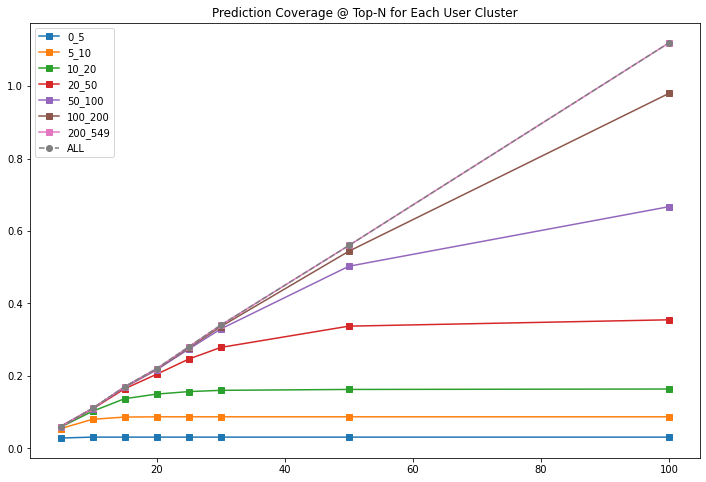

In [ ]:
plt.rcParams["figure.figsize"] = (12,8)
pop_dict = dict(train.movieID.value_counts())
for _,v in user_clusters.items():
  pc = {}
  for k in ks:
    pc[k] = prediction_coverage(res.pred[v], catalog=train.movieID.unique(), k=k)
  pd.Series(pc).plot(style='s-')
pc_all = pd.Series([prediction_coverage(res.pred[v], catalog=train.movieID.unique(), k=k) for k in ks])
pc_all.index=ks
pc_all.plot(style='o--')
plt.legend(legends)
plt.title(f"Prediction Coverage @ Top-N for Each User Cluster")

# Metrics

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity
import scipy.sparse as sp
from sklearn.metrics import mean_squared_error
from math import sqrt
import itertools
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import random

def novelty(predicted, pop, u, n):
    """
    Computes the novelty for a list of recommendations
    Parameters
    ----------
    predicted : a list of lists
        Ordered predictions
        example: [['X', 'Y', 'Z'], ['X', 'Y', 'Z']]
    pop: dictionary
        A dictionary of all items alongside of its occurrences counter in the training data
        example: {1198: 893, 1270: 876, 593: 876, 2762: 867}
    u: integer
        The number of users in the training data
    n: integer
        The length of recommended lists per user
    Returns
    ----------
    novelty:
        The novelty of the recommendations in system level
    mean_self_information:
        The novelty of the recommendations in recommended top-N list level
    ----------    
    Metric Defintion:
    Zhou, T., Kuscsik, Z., Liu, J. G., Medo, M., Wakeling, J. R., & Zhang, Y. C. (2010).
    Solving the apparent diversity-accuracy dilemma of recommender systems.
    Proceedings of the National Academy of Sciences, 107(10), 4511-4515.
    """
    mean_self_information = []
    k = 0
    for sublist in predicted:
        self_information = 0
        k += 1
        for i in sublist:
          if i in pop.keys():
            self_information += np.sum(-np.log2(pop[i]/u))
        mean_self_information.append(self_information/n)
    novelty = sum(mean_self_information)/k
    return novelty, mean_self_information

def prediction_coverage(predicted, catalog, k=999):
    """
    Computes the prediction coverage for a list of recommendations
    Parameters
    ----------
    predicted : a list of lists
        Ordered predictions
        example: [['X', 'Y', 'Z'], ['X', 'Y', 'Z']]
    catalog: list
        A list of all unique items in the training data
        example: ['A', 'B', 'C', 'X', 'Y', Z]
    Returns
    ----------
    prediction_coverage:
        The prediction coverage of the recommendations as a percent
        rounded to 2 decimal places
    ----------    
    Metric Defintion:
    Ge, M., Delgado-Battenfeld, C., & Jannach, D. (2010, September).
    Beyond accuracy: evaluating recommender systems by coverage and serendipity.
    In Proceedings of the fourth ACM conference on Recommender systems (pp. 257-260). ACM.
    """
    av_prediction_coverage = []
    for sublist in predicted:
        if len(sublist)>k:
          sublist = sublist[:k]

        predicted_flattened = [p for p in sublist]
        unique_predictions = len(set(predicted_flattened))
        prediction_coverage = round(unique_predictions/(len(catalog)* 1.0)*100,2)
        av_prediction_coverage.append(prediction_coverage)
    return sum(av_prediction_coverage)/len(predicted)

def catalog_coverage(predicted, catalog, k):
    """
    Computes the catalog coverage for k lists of recommendations
    Parameters
    ----------
    predicted : a list of lists
        Ordered predictions
        example: [['X', 'Y', 'Z'], ['X', 'Y', 'Z']]
    catalog: list
        A list of all unique items in the training data
        example: ['A', 'B', 'C', 'X', 'Y', Z]
    k: integer
        The number of observed recommendation lists
        which randomly choosed in our offline setup
    Returns
    ----------
    catalog_coverage:
        The catalog coverage of the recommendations as a percent
        rounded to 2 decimal places
    ----------    
    Metric Defintion:
    Ge, M., Delgado-Battenfeld, C., & Jannach, D. (2010, September).
    Beyond accuracy: evaluating recommender systems by coverage and serendipity.
    In Proceedings of the fourth ACM conference on Recommender systems (pp. 257-260). ACM.
    """
    sampling = random.choices(predicted, k=k)
    predicted_flattened = [p for sublist in sampling for p in sublist]
    L_predictions = len(set(predicted_flattened))
    catalog_coverage = round(L_predictions/(len(catalog)*1.0)*100,2)
    return catalog_coverage

def _ark(actual, predicted, k=10):
    """
    Computes the average recall at k.
    Parameters
    ----------
    actual : list
        A list of actual items to be predicted
    predicted : list
        An ordered list of predicted items
    k : int, default = 10
        Number of predictions to consider
    Returns:
    -------
    score : int
        The average recall at k.
    """
    if len(predicted)>k:
        predicted = predicted[:k]

    score = 0.0
    num_hits = 0.0

    for i,p in enumerate(predicted):
        if p in actual and p not in predicted[:i]:
            num_hits += 1.0
            score += num_hits / (i+1.0)

    if not actual:
        return 0.0

    return num_hits / len(actual)

def mark(actual, predicted, k=10):
    """
    Computes the mean average recall at k.
    Parameters
    ----------
    actual : a list of lists
        Actual items to be predicted
        example: [['A', 'B', 'X'], ['A', 'B', 'Y']]
    predicted : a list of lists
        Ordered predictions
        example: [['X', 'Y', 'Z'], ['X', 'Y', 'Z']]
    Returns:
    -------
        mark: int
            The mean average recall at k (mar@k)
    """
    return np.mean([_ark(a,p,k) for a,p in zip(actual, predicted)])

def _apk(actual, predicted, k=10):
    """
    Computes the average precision at k.
    Parameters
    ----------
    actual : list
        A list of actual items to be predicted
    predicted : list
        An ordered list of predicted items
    k : int, default = 10
        Number of predictions to consider
    Returns:
    -------
    score : int
        The average precision at k.
    """
    if len(predicted)>k:
        predicted = predicted[:k]

    score = 0.0
    num_hits = 0.0

    for i,p in enumerate(predicted):
        if p in actual and p not in predicted[:i]:
            num_hits += 1.0
            score += num_hits / (i+1.0)

    if not actual:
        return 0.0

    return num_hits / k

def mapk(actual, predicted, k=10):
    """
    Computes the mean average precision at k.
    Parameters
    ----------
    actual : a list of lists
        Actual items to be predicted
        example: [['A', 'B', 'X'], ['A', 'B', 'Y']]
    predicted : a list of lists
        Ordered predictions
        example: [['X', 'Y', 'Z'], ['X', 'Y', 'Z']]
    Returns:
    -------
        mark: int
            The mean average precision at k (mar@k)
    """
    return np.mean([_apk(a,p,k) for a,p in zip(actual, predicted)])

def personalization(predicted):
    """
    Personalization measures recommendation similarity across users.
    A high score indicates good personalization (user's lists of recommendations are different).
    A low score indicates poor personalization (user's lists of recommendations are very similar).
    A model is "personalizing" well if the set of recommendations for each user is different.
    Parameters:
    ----------
    predicted : a list of lists
        Ordered predictions
        example: [['X', 'Y', 'Z'], ['X', 'Y', 'Z']]
    Returns:
    -------
        The personalization score for all recommendations.
    """

    def make_rec_matrix(predicted):
        df = pd.DataFrame(data=predicted).reset_index().melt(
            id_vars='index', value_name='item',
        )
        df = df[['index', 'item']].pivot(index='index', columns='item', values='item')
        df = pd.notna(df)*1
        rec_matrix = sp.csr_matrix(df.values)
        return rec_matrix

    #create matrix for recommendations
    predicted = np.array(predicted)
    rec_matrix_sparse = make_rec_matrix(predicted)

    #calculate similarity for every user's recommendation list
    similarity = cosine_similarity(X=rec_matrix_sparse, dense_output=False)

    #get indicies for upper right triangle w/o diagonal
    upper_right = np.triu_indices(similarity.shape[0], k=1)

    #calculate average similarity
    personalization = np.mean(similarity[upper_right])
    return 1-personalization

def _single_list_similarity(predicted, feature_df, u):
    """
    Computes the intra-list similarity for a single list of recommendations.
    Parameters
    ----------
    predicted : a list
        Ordered predictions
        Example: ['X', 'Y', 'Z']
    feature_df: dataframe
        A dataframe with one hot encoded or latent features.
        The dataframe should be indexed by the id used in the recommendations.
    Returns:
    -------
    ils_single_user: float
        The intra-list similarity for a single list of recommendations.
    """
    # exception predicted list empty
    if not(predicted):
        raise Exception('Predicted list is empty, index: {0}'.format(u))

    #get features for all recommended items
    recs_content = feature_df.loc[predicted]
    recs_content = recs_content.dropna()
    recs_content = sp.csr_matrix(recs_content.values)

    #calculate similarity scores for all items in list
    similarity = cosine_similarity(X=recs_content, dense_output=False)

    #get indicies for upper right triangle w/o diagonal
    upper_right = np.triu_indices(similarity.shape[0], k=1)

    #calculate average similarity score of all recommended items in list
    ils_single_user = np.mean(similarity[upper_right])
    return ils_single_user

def intra_list_similarity(predicted, feature_df):
    """
    Computes the average intra-list similarity of all recommendations.
    This metric can be used to measure diversity of the list of recommended items.
    Parameters
    ----------
    predicted : a list of lists
        Ordered predictions
        Example: [['X', 'Y', 'Z'], ['X', 'Y', 'Z']]
    feature_df: dataframe
        A dataframe with one hot encoded or latent features.
        The dataframe should be indexed by the id used in the recommendations.
    Returns:
    -------
        The average intra-list similarity for recommendations.
    """
    feature_df = feature_df.fillna(0)
    Users = range(len(predicted))
    ils = [_single_list_similarity(predicted[u], feature_df, u) for u in Users]
    return np.mean(ils)

def mse(y, yhat):
    """
    Computes the mean square error (MSE)
    Parameters
    ----------
    yhat : Series or array. Reconstructed (predicted) ratings or interaction values.
    y: original true ratings or interaction values.
    Returns:
    -------
        The mean square error (MSE)
    """
    mse = mean_squared_error(y, yhat)
    return mse

def rmse(y, yhat):
    """
    Computes the root mean square error (RMSE)
    Parameters
    ----------
    yhat : Series or array. Reconstructed (predicted) ratings or values
    y: original true ratings or values.
    Returns:
    -------
        The mean square error (MSE)
    """
    rmse = sqrt(mean_squared_error(y, yhat))
    return rmse

def make_confusion_matrix(y, yhat):
    """
    Calculates and plots a confusion matrix
    Parameters
    ----------
    y : list or array of actual interaction values such as ratings
    yhat: list or array of actual predicted interaction values
    Returns:
    -------
        A confusion matrix plot
    """
    cm = confusion_matrix(y, yhat, labels=[1,0])
    cm = np.round(cm.astype('float') / cm.sum(axis=1)[:, np.newaxis],4)*100

    fmt = ".2f"
    thresh = cm.max() / 2.
    descriptions = np.array([["True Positive", "False Negative"], ["False Positive", "True Negatives"]])
    colors = np.array([["green", "red"], ["red", "green"]])
    plt.imshow([[0,0],[0,0]], interpolation='nearest', cmap=plt.cm.Greys)
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
            plt.text(j, i, format(cm[i, j], fmt)+'%\n' + descriptions[i, j],
                     horizontalalignment="center",
                     color=colors[i,j])
    plt.axhline(y=0.5, xmin=0, xmax=1, color="black", linewidth=0.75)
    plt.axvline(x=0.5, ymin=0, ymax=1, color="black", linewidth=0.75)
    plt.ylabel('True')
    plt.xlabel('Predicted')
    plt.title("Confusion Matrix")
    plt.xticks([0,1], [1,0], rotation=45)
    plt.yticks([0,1], [1,0])
    plt.show()


def recommender_precision(predicted, actual):
    """
    Computes the precision of each user's list of recommendations, and averages precision over all users.
    ----------
    actual : a list of lists
        Actual items to be predicted
        example: [['A', 'B', 'X'], ['A', 'B', 'Y']]
    predicted : a list of lists
        Ordered predictions
        example: [['X', 'Y', 'Z'], ['X', 'Y', 'Z']]
    Returns:
    -------
        precision: int
    """
    def calc_precision(predicted, actual):
        prec = [value for value in predicted if value in actual]
        prec = np.round(float(len(prec)) / float(len(predicted)), 4)
        return prec

    precision = np.mean(list(map(calc_precision, predicted, actual)))
    return precision


def recommender_recall(predicted, actual):
    """
    Computes the recall of each user's list of recommendations, and averages precision over all users.
    ----------
    actual : a list of lists
        Actual items to be predicted
        example: [['A', 'B', 'X'], ['A', 'B', 'Y']]
    predicted : a list of lists
        Ordered predictions
        example: [['X', 'Y', 'Z'], ['X', 'Y', 'Z']]
    Returns:
    -------
        recall: int
    """
    def calc_recall(predicted, actual):
        reca = [value for value in predicted if value in actual]
        reca = np.round(float(len(reca)) / float(len(actual)), 4)
        return reca

    recall = np.mean(list(map(calc_recall, predicted, actual)))
    return recall


# Results

In [ ]:
recommender_precision(res.pred, res.true)

0.7304836784409257

In [ ]:
recommender_recall(res.pred, res.true)

0.6430472594397078

In [ ]:
make_confusion_matrix(df_rec_pred.pred, df_rec_pred.rating)

In [ ]:
rmse(df_rec_pred.pred, df_rec_pred.rating)

0.8081811115593477

0.6531567090813027

In [ ]:
intra_list_similarity(res.pred, res)

In [ ]:
personalization(df_rec_pred.pred) #OOM

Text(0.5, 1.0, 'MAP @ Top-N')

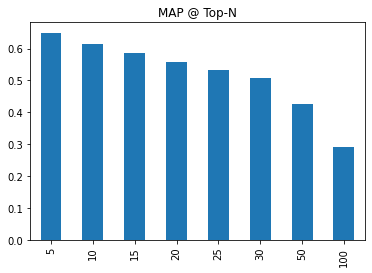

In [ ]:
ks = [5,10,15,20,25,30,50,100]
maps = {}
for k in ks:
  maps[k] = mapk(res.pred, res.true, k=k)
plt.rcParams["figure.figsize"] = (6,4)
pd.Series(maps).plot.bar()
plt.title("MAP @ Top-N")

Text(0.5, 1.0, 'MAR @ Top-N')

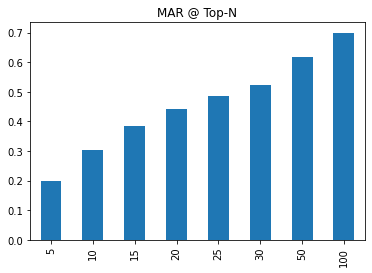

In [ ]:
mars = {}
for k in ks:
  mars[k] = mark(res.pred, res.true, k=k)

plt.rcParams["figure.figsize"] = (6,4)
pd.Series(mars).plot.bar()
plt.title("MAR @ Top-N")

Text(0.5, 1.0, 'Catalog Coverage @ Top-N')

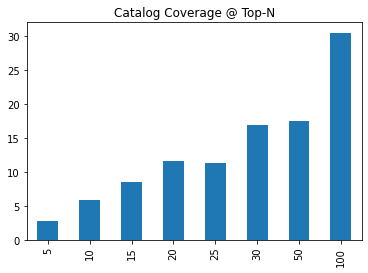

In [ ]:
ccs = {}
for k in ks:
  ccs[k] = catalog_coverage(res.pred, catalog=train.movieID.unique() ,k=k)

plt.rcParams["figure.figsize"] = (6,4)
pd.Series(ccs).plot.bar()
plt.title("Catalog Coverage @ Top-N")

In [ ]:
prediction_coverage(res.pred, catalog=train.movieID.unique()) 

0.5761510353227766

Text(0.5, 1.0, 'Novelty @ Top-N')

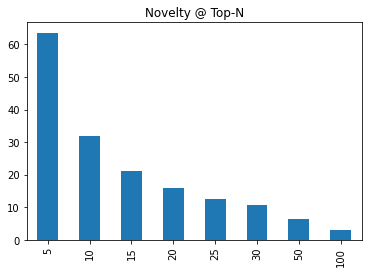

In [ ]:
pop_dict = dict(train.movieID.value_counts())

ns = {}
for k in ks:
  ns[k] = novelty(res.pred, pop_dict, len(train.userID.unique()), n=k)[0]

plt.rcParams["figure.figsize"] = (6,4)
pd.Series(ns).plot.bar()
plt.title("Novelty @ Top-N")

# Embedding+FC

In [ ]:
n_latent_factors_user = 20  # 5
n_latent_factors_movie = 20 # 8

movie_input = Input(shape=[1],name='Item')
movie_embedding = Embedding(n_movies + 1, n_latent_factors_movie, name='Movie-Embedding')(movie_input)
movie_vec = Flatten(name='FlattenMovies')(movie_embedding)
movie_vec = Dropout(0.2, name='Dropout_movie')(movie_vec)


user_input = Input(shape=[1],name='User')
user_Embedding = Embedding(n_users + 1, n_latent_factors_user,name='User-Embedding')(user_input)
user_vec = Flatten(name='FlattenUsers')(user_Embedding)
user_vec = Dropout(0.2, name='Dropout_user')(user_vec)


concat = concatenate([movie_vec, user_vec], name='Concat')
concat = Dropout(0.2, name='Dropout_concat')(concat)

# dense = Dense(200,name='FullyConnected')(concat)
# dense = Dropout(0.2, name='Dropout')(dense)
dense_2 = Dense(100, name='FullyConnected-1')(concat)
dense_2 = Dropout(0.2, name='Dropout2')(dense_2)
dense_3 = Dense(50, name='FullyConnected-2')(dense_2)
dense_3 = Dropout(0.2, name='Dropout3')(dense_3)
dense_4 = Dense(20, name='FullyConnected-3', activation='relu')(dense_3)


result = Dense(1, activation='relu',name='Activation')(dense_4)
adam = Adam(lr=0.005)
model = Model([user_input, movie_input], result)
model.compile(optimizer=adam,loss= 'mean_absolute_error')
model.summary()

Model: "model_22"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Item (InputLayer)               [(None, 1)]          0                                            
__________________________________________________________________________________________________
User (InputLayer)               [(None, 1)]          0                                            
__________________________________________________________________________________________________
Movie-Embedding (Embedding)     (None, 1, 20)        160020      Item[0][0]                       
__________________________________________________________________________________________________
User-Embedding (Embedding)      (None, 1, 20)        160020      User[0][0]                       
___________________________________________________________________________________________

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


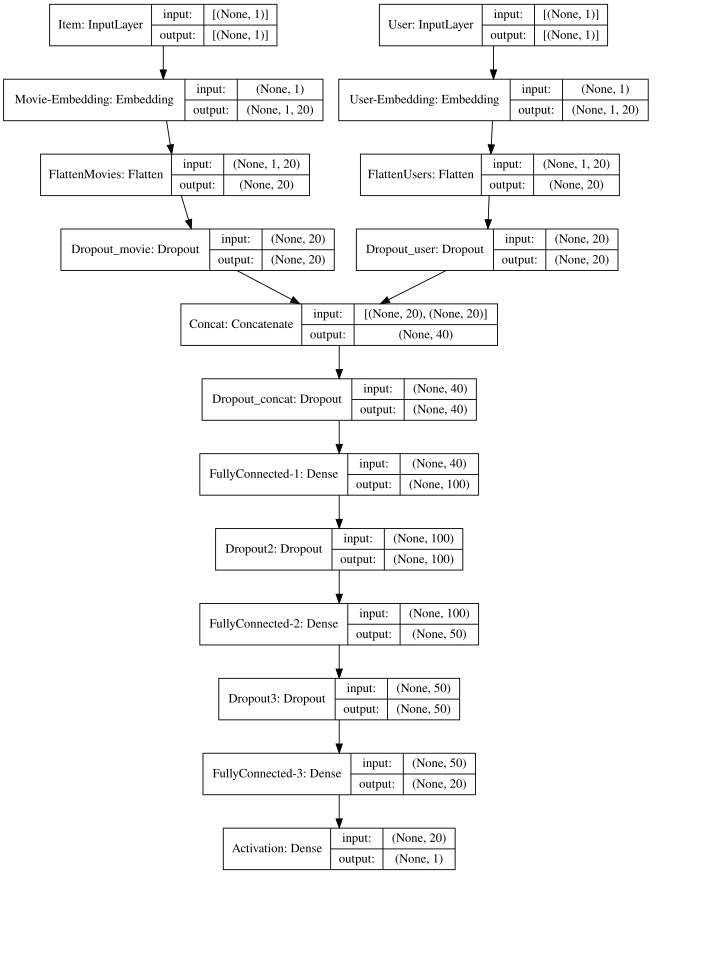

In [ ]:
img = model_to_dot(model,  show_shapes=True, show_layer_names=True, rankdir='HB', dpi=65).create(prog='dot', format='svg')
SVG(img)

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model, dpi=150, to_file='model_Embed_FC_orig.png')

In [ ]:
history = model.fit([train.userID, train.movieID], train.rating, epochs=100, verbose=0,batch_size=256)

In [ ]:
# model.save('/content/drive/MyDrive/PY/TimeSeriesRecSys/Data_HetRec/model_embed_fc.h5')

Text(0, 0.5, 'Train Error')

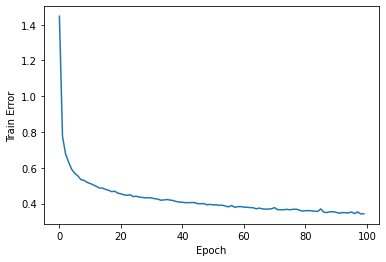

In [ ]:
pd.Series(history.history['loss']).plot(logy=False)
plt.xlabel("Epoch")
plt.ylabel("Train Error")

In [ ]:
y_hat = np.round(model.predict([test.userID, test.movieID]),2)
y_true = test.rating
from sklearn.metrics import mean_absolute_error
mean_absolute_error(y_true, y_hat) #MAE

# 3,3 latent features, 100epo-256-size 0.705 

0.759065003156662

#### PCA-Orig Embed-FC

In [ ]:
n_movies, n_users = 8000,8000
# pd.Series(vectors_train[:, 0]).nunique(), pd.Series(vectors_train[:, 1]).nunique()
# print(n_movies, n_users)

In [ ]:
n_latent_factors_user = 20  # 5
n_latent_factors_movie = 20 # 8

movie_input = Input(shape=[1],name='Item')
movie_embedding = Embedding(n_movies + 1, n_latent_factors_movie, name='Movie-Embedding')(movie_input)
movie_vec = Flatten(name='FlattenMovies')(movie_embedding)
movie_vec = Dropout(0.2, name='Dropout_movie')(movie_vec)


user_input = Input(shape=[1],name='User')
user_Embedding = Embedding(n_users + 1, n_latent_factors_user,name='User-Embedding')(user_input)
user_vec = Flatten(name='FlattenUsers')(user_Embedding)
user_vec = Dropout(0.2, name='Dropout_user')(user_vec)


concat = concatenate([movie_vec, user_vec], name='Concat')
concat = Dropout(0.2, name='Dropout_concat')(concat)

# dense = Dense(200,name='FullyConnected')(concat)
# dense = Dropout(0.2, name='Dropout')(dense)
dense_2 = Dense(100, name='FullyConnected-1')(concat)
dense_2 = Dropout(0.2, name='Dropout2')(dense_2)
dense_3 = Dense(50, name='FullyConnected-2')(dense_2)
dense_3 = Dropout(0.2, name='Dropout3')(dense_3)
dense_4 = Dense(20, name='FullyConnected-3', activation='relu')(dense_3)


result = Dense(1, activation='relu',name='Activation')(dense_4)
adam = Adam(lr=0.005)
model = Model([user_input, movie_input], result)
model.compile(optimizer=adam,loss= 'mean_absolute_error')
# model.summary()

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [ ]:
scaler_train = MinMaxScaler()
vectors_train = PCA(n_components=2).fit_transform(scaler_train.fit_transform(train.filter(regex="[^time_stamp]"))) 
scaler_test = MinMaxScaler()
vectors_test = PCA(n_components=2).fit_transform(scaler_test.fit_transform(test.filter(regex="[^time_stamp]"))) 

In [ ]:
# PCA features - Scale IDs
history = model.fit([vectors_train[:, 0], vectors_train[:, 1]], train.rating, epochs=100, verbose=0, batch_size=256)

Text(0, 0.5, 'Train Error')

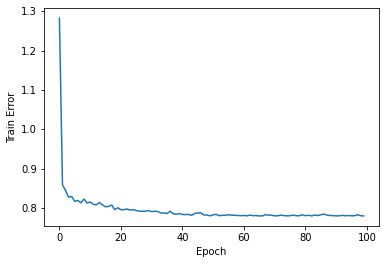

In [ ]:
pd.Series(history.history['loss']).plot(logy=False)
plt.xlabel("Epoch")
plt.ylabel("Train Error")

In [ ]:
y_hat = np.round(model.predict([test.userID, test.movieID]),2)
y_true = test.rating
from sklearn.metrics import mean_absolute_error
mean_absolute_error(y_true, y_hat) #MAE

0.7175849965810775

#### PCA-Manual Embed-FC

In [ ]:
# 按照时间顺序分割数据集为train/test set
train_size = int(len(df) * 0.8)
train, test = df.iloc[:train_size,:], df.iloc[train_size:,:]

train.reset_index(drop=True, inplace=True)
test.reset_index(drop=True, inplace=True)

train.shape, test.shape

((8000, 20), (2000, 20))

In [ ]:
n_movies, n_users = pd.Series(vectors_train[:, 0]).nunique(), pd.Series(vectors_train[:, 1]).nunique()
print(n_movies, n_users)

8000 8000


In [ ]:
n_latent_factors_user = 20  # 5
n_latent_factors_movie = 20 # 8

movie_input = Input(shape=[1],name='Item')
movie_embedding = Embedding(n_movies + 1, n_latent_factors_movie, name='Movie-Embedding')(movie_input)
movie_vec = Flatten(name='FlattenMovies')(movie_embedding)
movie_vec = Dropout(0.2, name='Dropout_movie')(movie_vec)


user_input = Input(shape=[1],name='User')
user_Embedding = Embedding(n_users + 1, n_latent_factors_user,name='User-Embedding')(user_input)
user_vec = Flatten(name='FlattenUsers')(user_Embedding)
user_vec = Dropout(0.2, name='Dropout_user')(user_vec)


concat = concatenate([movie_vec, user_vec], name='Concat')
concat = Dropout(0.2, name='Dropout_concat')(concat)

# dense = Dense(200,name='FullyConnected')(concat)
# dense = Dropout(0.2, name='Dropout')(dense)
dense_2 = Dense(100, name='FullyConnected-1')(concat)
dense_2 = Dropout(0.2, name='Dropout2')(dense_2)
dense_3 = Dense(50, name='FullyConnected-2')(dense_2)
dense_3 = Dropout(0.2, name='Dropout3')(dense_3)
dense_4 = Dense(20, name='FullyConnected-3', activation='relu')(dense_3)


result = Dense(1, activation='relu',name='Activation')(dense_4)
adam = Adam(lr=0.005)
model = Model([user_input, movie_input], result)
model.compile(optimizer=adam,loss= 'mean_absolute_error')
# model.summary()

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [ ]:
scaler_train = MinMaxScaler()
vectors_train = PCA(n_components=2).fit_transform(scaler_train.fit_transform(train.filter(regex="[^time_stamp]"))) 
scaler_test = MinMaxScaler()
vectors_test = PCA(n_components=2).fit_transform(scaler_test.fit_transform(test.filter(regex="[^time_stamp]"))) 

In [ ]:
# PCA features - Scale IDs
history = model.fit([vectors_train[:, 0], vectors_train[:, 1]], train.rating, epochs=100, verbose=0, batch_size=256)

Text(0, 0.5, 'Train Error')

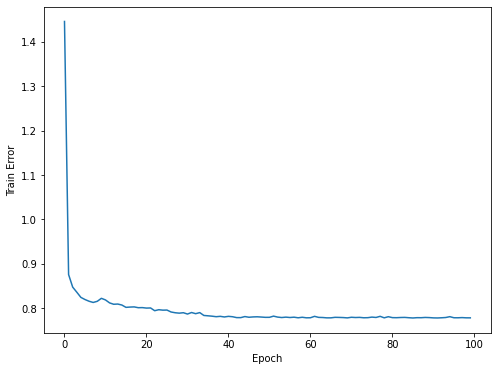

In [ ]:
pd.Series(history.history['loss']).plot(logy=False)
plt.xlabel("Epoch")
plt.ylabel("Train Error")

In [ ]:
y_hat = np.round(model.predict([test.userID, test.movieID]),2)
y_true = test.rating
from sklearn.metrics import mean_absolute_error
mean_absolute_error(y_true, y_hat) #MAE

0.7159099980592728

In [ ]:
# PCA features - 不用Embedding
history = model.fit([vectors_train[:, 0], vectors_train[:, 1]], train.rating, epochs=100, verbose=0,batch_size=256)

0.719194995045662


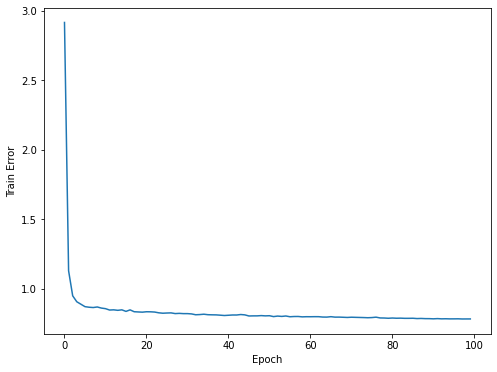

In [ ]:
pd.Series(history.history['loss']).plot(logy=False)
plt.xlabel("Epoch")
plt.ylabel("Train Error")
y_hat = np.round(model.predict([vectors_test[:, 0], vectors_test[:, 1]]),2)
print(mean_absolute_error(test.rating, y_hat))

### PCA-rating model

In [ ]:
# PCA-rating model

movie_input = Input(shape=[1],name='Item')
movie_vec = Dense(64, name='FullyConnected-00', activation='relu')(movie_input)
movie_vec = Dropout(0.2, name='Dropout_movie')(movie_vec)


user_input = Input(shape=[1],name='User')
user_vec = Dense(64, name='FullyConnected-01', activation='relu')(user_input)
user_vec = Dropout(0.2, name='Dropout_user')(user_vec)


concat = concatenate([movie_vec, user_vec], name='Concat')
# concat = Dropout(0.2, name='Dropout_concat')(concat)

dense_3 = Dense(100, name='FullyConnected-2', activation='relu')(concat)
dense_3 = Dropout(0.2, name='Dropout3')(dense_3)
dense_4 = Dense(50, name='FullyConnected-3', activation='relu')(dense_3)
dense_4 = Dropout(0.2, name='Dropout4')(dense_4)
dense_4 = Dense(20, name='FullyConnected-4', activation='relu')(dense_4)


result = Dense(1,name='Activation')(dense_4)
adam = Adam(lr=0.005)
model = Model([user_input, movie_input], result)
model.compile(optimizer='adam',loss= 'mean_absolute_error')
# model.summary()

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model, to_file='model_Embed_FC_rating_pca2.png')

In [ ]:
scaler_train = MinMaxScaler()
vectors_train = PCA(n_components=2).fit_transform(scaler_train.fit_transform(train.filter(regex="[^time_stamp]"))) 
scaler_test = MinMaxScaler()
vectors_test = PCA(n_components=2).fit_transform(scaler_test.fit_transform(test.filter(regex="[^time_stamp]"))) 

In [ ]:
# PCA features - Scale IDs
history = model.fit([vectors_train[:, 0], vectors_train[:, 1]], train.rating, epochs=100, verbose=0,batch_size=256)

Text(0, 0.5, 'Train Error')

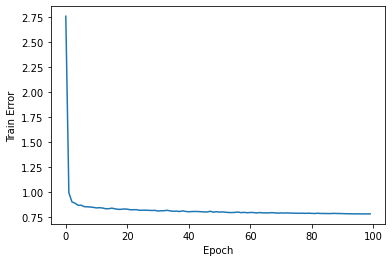

In [ ]:
pd.Series(history.history['loss']).plot(logy=False)
plt.xlabel("Epoch")
plt.ylabel("Train Error")

In [ ]:
y_hat = np.round(model.predict([vectors_test[:, 0], vectors_test[:, 1]]),2)
print(mean_absolute_error(test.rating, y_hat))

0.7166299974918365


## Results

Text(0.5, 1.0, 'MAP @ Top-N')

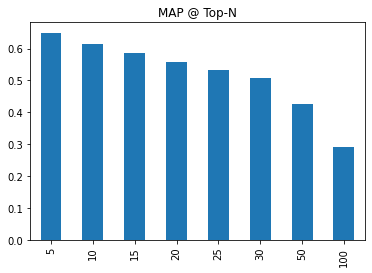

In [ ]:
ks = [5,10,15,20,25,30,50,100]
maps = {}
for k in ks:
  maps[k] = mapk(res.pred, res.true, k=k)
plt.rcParams["figure.figsize"] = (6,4)
pd.Series(maps).plot.bar()
plt.title("MAP @ Top-N")

In [ ]:
mean_absolute_error(y_true, y_hat_2) #MAE

0.6699155737655144

In [ ]:
with open('/content/drive/MyDrive/PY/TimeSeriesRecSys/Data_HetRec/df_rec_timeOrder_2.pickle', 'wb') as handle:
    pickle.dump(df_rec_2, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
df_rec_2 = test.iloc[:,:3].copy()
df_rec_2["pred"] = y_hat_2
df_rec_2 = df_rec_2.sort_values(by=['userID','rating'],ascending=False)
df_rec_true_2 = df_rec_2[df_rec_2['rating']>3]
df_rec_pred_2 = df_rec_2[df_rec_2['pred']>3]
df_rec_pred_2 = df_rec_pred_2.sort_values(by=['userID','pred'],ascending=False)
rec_true_2 = df_rec_true_2.groupby('userID').apply(lambda x: list(x['movieID']))
rec_pred_2 = df_rec_pred_2.groupby('userID').apply(lambda x: list(x['movieID']))
res_2 = pd.DataFrame(rec_true_2)
res_2['pred'] = rec_pred_2
res_2.columns = ['true','pred']
res_2 = res_2.dropna() # drop null predictions

0_5: 0.7788338028169014
5_10: 0.7453049180327869
10_20: 0.7084521367521369
20_50: 0.6855785425101214
50_100: 0.7041348258706468
100_200: 0.7156316831683167
200_549: 0.6678826086956522
ALL: 0.7193381699346405


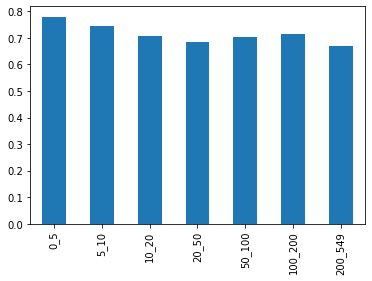

In [ ]:
clusters = [0, 5, 10, 20, 50, 100, 200, 549]
user_clusters_2 = {}
for i in range(len(clusters)-1):
  user_clusters_2[str(clusters[i])+'_'+str(clusters[i+1])] = \
   res_2.index[res_2.true.apply(len).apply(lambda x: x>clusters[i] and x<=clusters[i+1])]

metrics_clusters(res=res_2,verbose=1)

0_5: 0.9718309859154928
5_10: 0.9560885245901639
10_20: 0.957823076923077
20_50: 0.9458105263157895
50_100: 0.9520328358208955
100_200: 0.9537485148514853
200_549: 0.9529869565217391
ALL: 0.9581303921568627


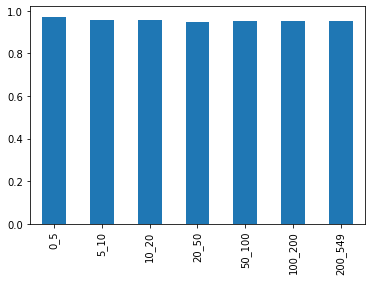

In [ ]:
metrics_clusters(recommender_recall, verbose=1, res=res_2)

In [ ]:
mean_absolute_error(y_true, y_hat_2) #MAE

0.6699155737655144

In [ ]:
mean_absolute_error(y_true, y_hat) #MAE

2.8910185483271644

0_5: 0.7785449411127977
5_10: 0.8350897728028546
10_20: 1.1112006122879072
20_50: 0.7210442210600503
50_100: 0.7176180111009548
100_200: 0.6477195553609002
200_549: 0.6786462289162642
ALL: 0.7730167308654665


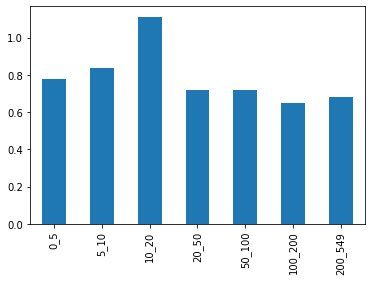

In [ ]:
# MSE
plt.rcParams["figure.figsize"] = (6,4)
res_dict = {}
for k,v in user_clusters.items():
  df_rec_pred_c = df_rec_pred_2[df_rec_pred_2.userID.apply(lambda x: x in v)].copy()
  res_dict[k] = mse(df_rec_pred_c.pred, df_rec_pred_c.rating)
  print(k+':', res_dict[k])
print('ALL:',mse(df_rec_pred_2.pred, df_rec_pred_2.rating))
pd.Series(res_dict).plot.bar()

0_5: 0.04070422535211267
5_10: 0.12442622950819673
10_20: 0.2543589743589743
20_50: 0.5694736842105265
50_100: 1.1396517412935323
100_200: 2.1309900990099004
200_549: 4.834347826086957
ALL: 1.706320261437909


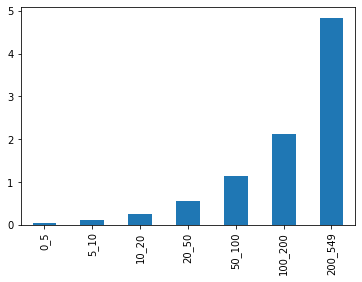

In [ ]:
# Prediction coverage
plt.rcParams["figure.figsize"] = (6,4)
res_dict = {}
for k,v in user_clusters.items():
  res_dict[k] = prediction_coverage(res_2.pred[v], catalog=train.movieID.unique()) 
  print(k+':',res_dict[k])
print('ALL:',prediction_coverage(res_2.pred, catalog=train.movieID.unique()))
pd.Series(res_dict).plot.bar()

Text(0.5, 1.0, 'MAP @ Top-N for Each User Cluster')

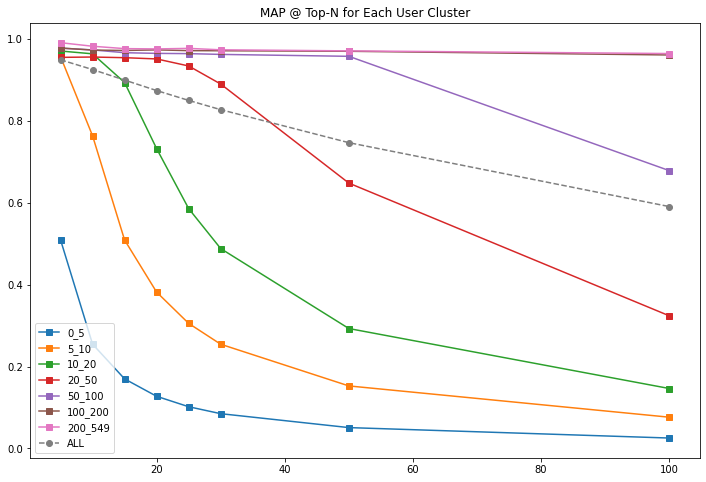

In [ ]:
plt.rcParams["figure.figsize"] = (12,8)
ks = [5,10,15,20,25,30,50,100]
for _,v in user_clusters.items():
  maps = {}
  for k in ks:
    maps[k] = mapk(res_2.pred[v], res_2.true[v], k=k)
  pd.Series(maps).plot(style='s-')
map_all = pd.Series([mapk(res_2.pred, res_2.true, k=k) for k in ks])
map_all.index=ks
map_all.plot(style='o--')
legends = list(user_clusters.keys())
legends.append('ALL')
plt.legend(legends)
plt.title(f"MAP @ Top-N for Each User Cluster")

Text(0.5, 1.0, 'MAR @ Top-N for Each User Cluster')

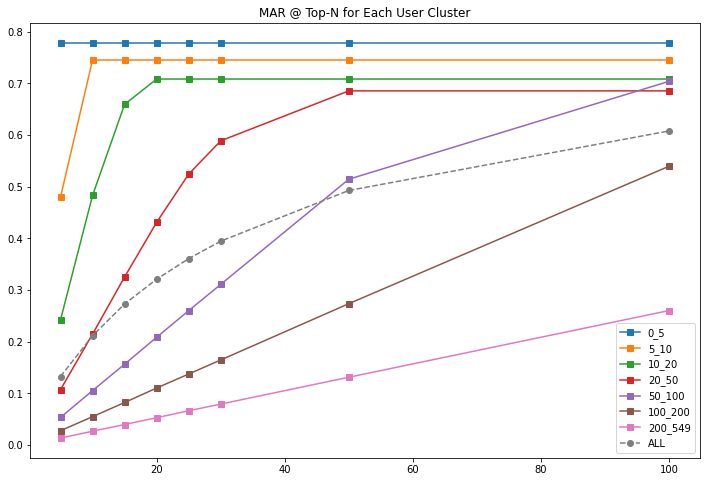

In [ ]:
plt.rcParams["figure.figsize"] = (12,8)
ks = [5,10,15,20,25,30,50,100]
for _,v in user_clusters.items():
  mars = {}
  for k in ks:
    mars[k] = mark(res_2.pred[v], res_2.true[v], k=k)
  pd.Series(mars).plot(style='s-')
mar_all = pd.Series([mark(res_2.pred, res_2.true, k=k) for k in ks])
mar_all.index=ks
mar_all.plot(style='o--')
plt.legend(legends)
plt.title(f"MAR @ Top-N for Each User Cluster")

Text(0.5, 1.0, 'Novelty @ Top-N for Each User Cluster')

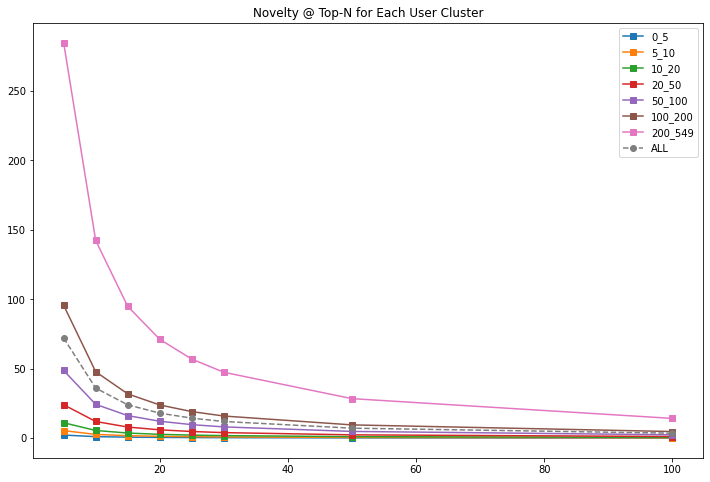

In [ ]:
plt.rcParams["figure.figsize"] = (12,8)
pop_dict = dict(train.movieID.value_counts())
for _,v in user_clusters.items():
  ns = {}
  for k in ks:
    ns[k] = novelty(res_2.pred[v], pop_dict, len(train.userID.unique()), n=k)[0]
  pd.Series(ns).plot(style='s-')
ns_all = pd.Series([novelty(res_2.pred, pop_dict, len(train.userID.unique()), n=k)[0] for k in ks])
ns_all.index=ks
ns_all.plot(style='o--')
plt.legend(legends)
plt.title(f"Novelty @ Top-N for Each User Cluster")

Text(0.5, 1.0, 'Prediction Coverage @ Top-N for Each User Cluster')

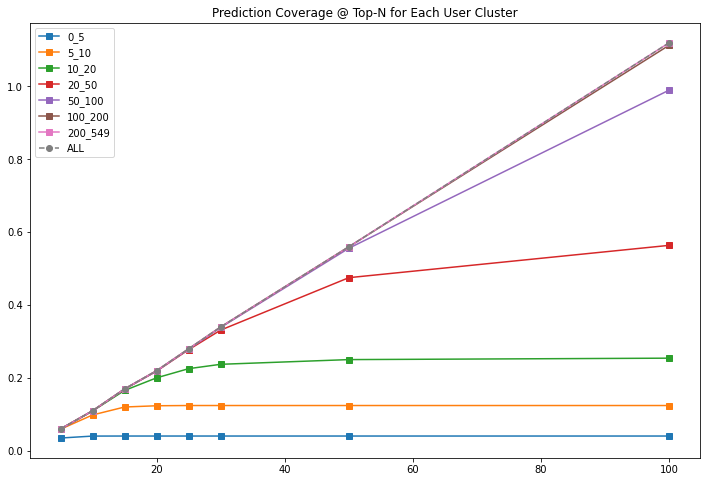

In [ ]:
plt.rcParams["figure.figsize"] = (12,8)
pop_dict = dict(train.movieID.value_counts())
for _,v in user_clusters.items():
  pc = {}
  for k in ks:
    pc[k] = prediction_coverage(res_2.pred[v], catalog=train.movieID.unique(), k=k)
  pd.Series(pc).plot(style='s-')
pc_all = pd.Series([prediction_coverage(res_2.pred[v], catalog=train.movieID.unique(), k=k) for k in ks])
pc_all.index=ks
pc_all.plot(style='o--')
plt.legend(legends)
plt.title(f"Prediction Coverage @ Top-N for Each User Cluster")

Text(0.5, 1.0, 'Prediction Coverage @ Top-N for Each User Cluster')

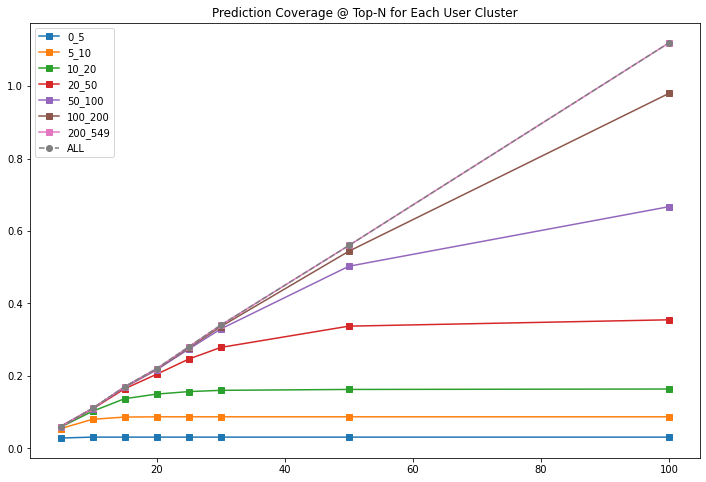

In [ ]:
recommender_precision(res_2.pred, res_2.true)

0.7193381699346405

In [ ]:
recommender_recall(res_2.pred, res_2.true)

0.9581303921568627

In [ ]:
mse(df_rec_pred_2.pred, df_rec_pred_2.rating)

0.7730167308654665

In [ ]:
prediction_coverage(res_2.pred, catalog=train.movieID.unique()) 

1.706320261437909

## Tagged data RecSys

In [ ]:
df_filtered = df.sort_values(by='timestamps')
df_filtered = df_filtered.sort_values(by=['timestamps'])
df_filtered = df_filtered.drop_duplicates(['userID','movieID'])
filtered_user = df_filtered.groupby('userID').count()['movieID']>2 # only select users with more than 2 items
df_filtered = df_filtered[df_filtered.userID.isin(filtered_user[filtered_user==True].keys())]
cols = df_filtered.filter(regex="[^timestamp]").columns

scaler = MinMaxScaler()
df_filtered = scaler.fit_transform(df_filtered.filter(regex="[^timestamp]"))
df_filtered = pd.DataFrame(df_filtered)
df_filtered.columns = cols
df_filtered['isTag'] = [1] * len(df_filtered)
df_filtered.userID = df_filtered.userID.astype('category').cat.codes.values
df_filtered.movieID = df_filtered.movieID.astype('category').cat.codes.values
df_filtered = df_filtered.sample(n=10000, random_state=1)
df_filtered

,userID,movieID,tagID,date_day,date_month,date_year,date_hour,date_minute,date_second,dayofweek_num,weekofyear,quarter,days_in_month,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,is_leap_year,isTag
14435,358,4929,0.264339,0.533333,0.090909,0.50,0.000000,0.254237,0.237288,0.833333,0.117647,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
15321,303,729,0.091360,0.200000,0.181818,0.50,1.000000,0.067797,0.355932,0.333333,0.176471,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
12731,578,8,0.947544,0.333333,1.000000,0.25,0.130435,0.627119,0.796610,0.000000,0.960784,1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
9382,660,184,0.003146,0.466667,0.636364,0.25,0.173913,0.881356,0.254237,0.166667,0.627451,0.666667,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
13962,300,4791,0.005566,0.066667,0.090909,0.50,0.869565,0.677966,0.254237,0.833333,0.078431,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21737,355,5513,0.067219,0.966667,1.000000,0.50,0.782609,0.813559,0.169492,1.000000,1.000000,1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
17249,414,5235,0.573935,0.366667,0.363636,0.50,0.913043,0.135593,0.644068,0.833333,0.352941,0.333333,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
4305,462,3811,0.041445,0.566667,0.090909,0.25,1.000000,0.627119,0.491525,0.833333,0.117647,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
15265,303,3917,0.070063,0.166667,0.181818,0.50,0.956522,0.627119,0.338983,0.166667,0.176471,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1


In [ ]:
# 按照时间顺序分割数据集为train/test set
train_size = int(len(df_filtered) * 0.8)
train, test = df_filtered.iloc[:train_size,:], df_filtered.iloc[train_size:,:]

train.reset_index(drop=True, inplace=True)
test.reset_index(drop=True, inplace=True)

train.shape, test.shape

((8000, 21), (2000, 21))

In [ ]:
randomID = list(train.movieID.values)
# randomID.append(randomID.pop(0))
randomID.reverse()
train_neg = train.copy()
train_neg['randomID'] = randomID
train_neg

,userID,movieID,tagID,date_day,date_month,date_year,date_hour,date_minute,date_second,dayofweek_num,weekofyear,quarter,days_in_month,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,is_leap_year,isTag,randomID
0,358,4929,0.264339,0.533333,0.090909,0.50,0.000000,0.254237,0.237288,0.833333,0.117647,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,2733
1,303,729,0.091360,0.200000,0.181818,0.50,1.000000,0.067797,0.355932,0.333333,0.176471,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,5775
2,578,8,0.947544,0.333333,1.000000,0.25,0.130435,0.627119,0.796610,0.000000,0.960784,1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1466
3,660,184,0.003146,0.466667,0.636364,0.25,0.173913,0.881356,0.254237,0.166667,0.627451,0.666667,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,2816
4,300,4791,0.005566,0.066667,0.090909,0.50,0.869565,0.677966,0.254237,0.833333,0.078431,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,5450
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,492,5450,0.037754,0.900000,1.000000,0.75,0.043478,1.000000,0.491525,1.000000,1.000000,1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,4791
7996,414,2816,0.036605,0.133333,0.363636,0.50,0.652174,0.847458,0.457627,0.833333,0.333333,0.333333,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,184
7997,204,1466,0.114049,0.200000,0.090909,0.25,0.043478,0.644068,0.220339,0.166667,0.098039,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,8
7998,301,5775,0.692643,0.933333,0.636364,0.75,0.695652,0.135593,0.101695,0.666667,0.666667,0.666667,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,729


In [ ]:
from random import choice
uniqueMIDs = set(train_neg['movieID'].unique())
for _,row in train_neg.iterrows():
  if len(train_neg[(train_neg['userID']==row['userID']) & (train_neg['movieID']==row['randomID'])]) > 0:
    currentIDs = set(train_neg[train_neg['userID']==row['userID']].movieID.values)
    train_neg.loc[_,'randomID'] = choice(list(uniqueMIDs - currentIDs)) 
    # print(_)##验证是否已经修改randomID

In [ ]:
train_neg['isTag'] = [0] * len(train_neg)
train_neg['movieID'] = train_neg['randomID']
train_neg = train_neg.iloc[:,:-1]
train_neg

,userID,movieID,tagID,date_day,date_month,date_year,date_hour,date_minute,date_second,dayofweek_num,weekofyear,quarter,days_in_month,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,is_leap_year,isTag
0,358,2733,0.264339,0.533333,0.090909,0.50,0.000000,0.254237,0.237288,0.833333,0.117647,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,303,5775,0.091360,0.200000,0.181818,0.50,1.000000,0.067797,0.355932,0.333333,0.176471,0.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,578,1466,0.947544,0.333333,1.000000,0.25,0.130435,0.627119,0.796610,0.000000,0.960784,1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,660,2816,0.003146,0.466667,0.636364,0.25,0.173913,0.881356,0.254237,0.166667,0.627451,0.666667,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,300,5450,0.005566,0.066667,0.090909,0.50,0.869565,0.677966,0.254237,0.833333,0.078431,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,492,4791,0.037754,0.900000,1.000000,0.75,0.043478,1.000000,0.491525,1.000000,1.000000,1.000000,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0
7996,414,184,0.036605,0.133333,0.363636,0.50,0.652174,0.847458,0.457627,0.833333,0.333333,0.333333,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
7997,204,8,0.114049,0.200000,0.090909,0.25,0.043478,0.644068,0.220339,0.166667,0.098039,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
7998,301,729,0.692643,0.933333,0.636364,0.75,0.695652,0.135593,0.101695,0.666667,0.666667,0.666667,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0


In [ ]:
train_comb = pd.concat([train, train_neg])
from sklearn.utils import shuffle
train_comb = shuffle(train_comb, random_state=42)
train_comb = train_comb.reset_index(drop=True)
train_comb

,userID,movieID,tagID,date_day,date_month,date_year,date_hour,date_minute,date_second,dayofweek_num,weekofyear,quarter,days_in_month,is_month_start,is_month_end,is_quarter_start,is_quarter_end,is_year_start,is_year_end,is_leap_year,isTag
0,772,2932,0.405796,0.233333,0.000000,0.50,0.956522,0.101695,0.525424,0.000000,0.019608,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,772,5010,0.406220,0.266667,0.000000,0.75,0.043478,0.610169,0.440678,0.333333,0.019608,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1
2,704,5062,0.067764,0.233333,0.545455,0.50,0.608696,0.711864,0.101695,1.000000,0.509804,0.666667,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
3,750,4872,0.036544,0.166667,0.090909,0.25,0.217391,0.067797,0.186441,0.000000,0.098039,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
4,299,5471,0.116409,0.033333,1.000000,0.25,0.739130,0.711864,0.406780,0.833333,0.921569,1.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,28,2934,0.279223,0.533333,0.000000,0.25,0.869565,0.084746,0.474576,0.166667,0.039216,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
15996,303,4814,0.086762,0.800000,0.090909,0.50,0.000000,0.186441,0.406780,1.000000,0.137255,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
15997,382,2783,0.045559,0.933333,0.818182,0.75,0.565217,0.288136,0.288136,0.333333,0.843137,1.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1
15998,222,2082,0.012887,0.533333,1.000000,0.50,0.826087,0.593220,0.644068,0.000000,0.980392,1.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [ ]:
train_comb.shape, test.shape #(41836,) (5230,)

((16000, 21), (2000, 21))

In [ ]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# vectors_train = PCA(n_components=2).fit_transform(train_comb.filter(regex="[^time_stamp]")) 
# vectors_test = PCA(n_components=2).fit_transform(test.filter(regex="[^time_stamp]")) 

# to scale ID
scaler_train = MinMaxScaler()
vectors_train = PCA(n_components=2).fit_transform(scaler_train.fit_transform(train_comb.filter(regex="[^time_stamp]"))) 
scaler_test = MinMaxScaler()
vectors_test = PCA(n_components=2).fit_transform(scaler_test.fit_transform(test.filter(regex="[^time_stamp]"))) 

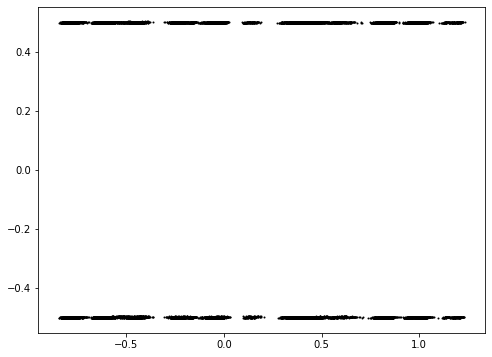

In [ ]:
plt.plot(vectors_train[:, 0], vectors_train[:, 1], 'k.', markersize=2)

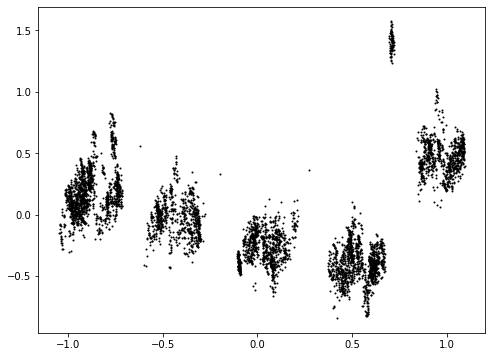

In [ ]:
plt.plot(vectors_test[:, 0], vectors_test[:, 1], 'k.', markersize=2)

In [ ]:
vectors_train[:, 0].max()

1.1755702962408416

#### EmbedFC Model OrigID

In [ ]:
scaler_train = MinMaxScaler()
vectors_train = PCA(n_components=2).fit_transform(scaler_train.fit_transform(train_comb.filter(regex="[^time_stamp]"))) 
scaler_test = MinMaxScaler()
vectors_test = PCA(n_components=2).fit_transform(scaler_test.fit_transform(test.filter(regex="[^time_stamp]"))) 

In [ ]:
n_movies, n_users = pd.Series(vectors_train[:, 0]).nunique(), pd.Series(vectors_train[:, 1]).nunique()
print(n_movies, n_users)

16000 16000


In [ ]:
 n_users, n_movies= train_comb.userID.nunique(), train_comb.movieID.nunique()

In [ ]:
# only ID
n_latent_factors_user = 20  # 5
n_latent_factors_movie = 20 # 8

movie_input = Input(shape=[1],name='Item')
movie_embedding = Embedding(n_movies, n_latent_factors_movie, name='Movie-Embedding')(movie_input)
movie_vec = Flatten(name='FlattenMovies')(movie_embedding)
movie_vec = Dropout(0.2, name='Dropout_movie')(movie_vec)


user_input = Input(shape=[1],name='User')
user_Embedding = Embedding(n_users, n_latent_factors_user,name='User-Embedding')(user_input)
user_vec = Flatten(name='FlattenUsers')(user_Embedding)
user_vec = Dropout(0.2, name='Dropout_user')(user_vec)


concat = concatenate([movie_vec, user_vec], name='Concat')
concat = Dropout(0.2, name='Dropout_concat')(concat)

# dense = Dense(200,name='FullyConnected')(concat)
# dense = Dropout(0.2, name='Dropout')(dense)
dense_2 = Dense(100, name='FullyConnected-1')(concat)
dense_2 = Dropout(0.2, name='Dropout2')(dense_2)
dense_3 = Dense(50, name='FullyConnected-2')(dense_2)
dense_3 = Dropout(0.2, name='Dropout3')(dense_3)
dense_4 = Dense(20, name='FullyConnected-3', activation='relu')(dense_3)


result = Dense(2, activation='softmax',name='Activation')(dense_4)
adam = Adam(lr=0.005)
model = Model([user_input, movie_input], result)
model.compile(optimizer="rmsprop", loss='binary_crossentropy',metrics=['accuracy'])
# model.summary()

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [ ]:
from tensorflow.keras.utils import to_categorical
history = model.fit([train_comb.userID, train_comb.movieID], to_categorical(train_comb.isTag), epochs=100, verbose=0,batch_size=256)

In [ ]:
pd.Series(y_pred).value_counts()

In [ ]:
from sklearn.metrics import *
y_pred = model.predict([test.userID, test.movieID])
y_pred = [np.argmax(i) for i in y_pred]
y_true = list(test.isTag)
print(classification_report(y_pred, y_true))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00      1038
           1       0.48      1.00      0.65       962

    accuracy                           0.48      2000
   macro avg       0.24      0.50      0.32      2000
weighted avg       0.23      0.48      0.31      2000



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#### EmbedFC Model ManualTime

In [ ]:
scaler_train = MinMaxScaler()
vectors_train = PCA(n_components=2).fit_transform(scaler_train.fit_transform(train_comb.filter(regex="[^time_stamp]"))) 
scaler_test = MinMaxScaler()
vectors_test = PCA(n_components=2).fit_transform(scaler_test.fit_transform(test.filter(regex="[^time_stamp]"))) 

n_movies, n_users = pd.Series(vectors_train[:, 0]).nunique(), pd.Series(vectors_train[:, 1]).nunique()
print(n_movies, n_users)

16000 16000


In [ ]:
# PCA-Reduced
import keras
from keras.layers import *
from keras.models import Model
from keras.optimizers import Adam
import matplotlib.pyplot as plt
from sklearn.metrics import *
from tensorflow.keras.utils import to_categorical

movie_input = Input(shape=[1],name='Item')
movie_vec = Dense(64, name='FullyConnected-00', activation='relu')(movie_input)
movie_vec = Dropout(0.2, name='Dropout_movie')(movie_vec)


user_input = Input(shape=[1],name='User')
user_vec = Dense(64, name='FullyConnected-01', activation='relu')(user_input)
user_vec = Dropout(0.2, name='Dropout_user')(user_vec)


concat = concatenate([movie_vec, user_vec], name='Concat')
# concat = Dropout(0.2, name='Dropout_concat')(concat)

dense_3 = Dense(64, name='FullyConnected-2', activation='relu')(concat)
dense_3 = Dropout(0.2, name='Dropout3')(dense_3)
dense_4 = Dense(32, name='FullyConnected-3', activation='relu')(dense_3)
dense_4 = Dropout(0.2, name='Dropout4')(dense_4)


result = Dense(2, activation='softmax',name='Activation')(dense_4)
# adam = Adam(lr=0.005)
model = Model([user_input, movie_input], result)
model.compile(optimizer='rmsprop', loss='binary_crossentropy',metrics=['accuracy'])
# model.summary()

In [ ]:
# PCA features - IDs
history = model.fit([vectors_train[:, 0], vectors_train[:, 1]], to_categorical(train_comb.isTag), epochs=100, verbose=0, batch_size=256)

Text(0, 0.5, 'Train Error')

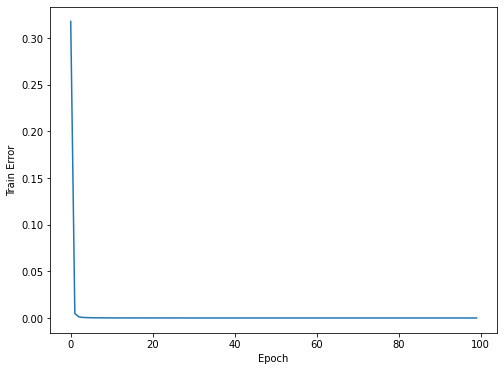

In [ ]:
pd.Series(history.history['loss']).plot(logy=False)
plt.xlabel("Epoch")
plt.ylabel("Train Error")

In [ ]:
# only user, movie, tag ID
y_pred = model.predict([vectors_test[:, 0], vectors_test[:, 1]])
y_pred = [np.argmax(i) for i in y_pred]
y_true = list(test.isTag)
print(classification_report(y_pred, y_true))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       975
           1       0.51      1.00      0.68      1025

    accuracy                           0.51      2000
   macro avg       0.26      0.50      0.34      2000
weighted avg       0.26      0.51      0.35      2000



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# with manual time-features
y_pred = model.predict([vectors_test[:, 0], vectors_test[:, 1]])
y_pred = [np.argmax(i) for i in y_pred]
y_true = list(test.isTag)
print(classification_report(y_pred, y_true))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       523
           1       0.74      1.00      0.85      1477

    accuracy                           0.74      2000
   macro avg       0.37      0.50      0.42      2000
weighted avg       0.55      0.74      0.63      2000



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#### EmbedFC Model TSFresh

In [ ]:
extracted_features.shape, extracted_features_movie.shape


((984, 4722), (5798, 4722))

In [ ]:
df_filtered.movieID.nunique(),df_filtered.userID.nunique()

(3868, 796)

In [ ]:
# scaler_train = MinMaxScaler()
# vectors_train = PCA(n_components=2).fit_transform(scaler_train.fit_transform(train_comb.filter(regex="[^time_stamp]").iloc[:,:3])) 
# scaler_test = MinMaxScaler()
# vectors_test = PCA(n_components=2).fit_transform(scaler_test.fit_transform(test.filter(regex="[^time_stamp]").iloc[:,:3])) 

# n_movies, n_users = pd.Series(vectors_train[:, 0]).nunique(), pd.Series(vectors_train[:, 1]).nunique()
# print(n_movies, n_users)

15977 15977


In [ ]:
vectors_200m = pd.DataFrame(PCA(n_components=20).fit_transform(extracted_features))  # 661-> 20
vectors_200u = pd.DataFrame(PCA(n_components=20).fit_transform(extracted_features_movie))  # 872-> 20
vectors_200m.index = extracted_features.index
vectors_200u.index = extracted_features_movie.index

# 转换为embedding 矩阵，用随机值填充没有的
n_latent_factors = 20
emb_mat_m = np.random.normal(0,1,(n_movies, n_latent_factors))
for i in vectors_200m.index:
  emb_mat_m[i] = vectors_200m.loc[i,:]

emb_mat_u = np.random.normal(0,1,(n_users, n_latent_factors))
for i in vectors_200u.index:
  emb_mat_u[i] = vectors_200u.loc[i,:]

emb_mat_m = pd.DataFrame(emb_mat_m)
emb_mat_u = pd.DataFrame(emb_mat_u)

scaler = MinMaxScaler()
emb_mat_m = scaler.fit_transform(emb_mat_m)
scaler = MinMaxScaler()
emb_mat_u = scaler.fit_transform(emb_mat_u)

In [ ]:
# emb weight
from keras.layers import *
from keras.models import Model


movie_input = Input(shape=[1],name='Item')
movie_embedding = Embedding(n_movies, n_latent_factors, weights=[emb_mat_m], trainable=True, name='Movie-Embedding')(movie_input)
movie_vec = Flatten(name='FlattenMovies')(movie_embedding)

user_input = Input(shape=[1],name='User')
user_embedding = Embedding(n_users, n_latent_factors, weights=[emb_mat_u], trainable=True, name='User-Embedding')(user_input)
user_vec = Flatten(name='FlattenUsers')(user_embedding)

concat = concatenate([movie_vec, user_vec], name='Concat')

dense_3 = Dense(64, name='FullyConnected-2', activation='relu')(concat)
dense_3 = Dropout(0.2, name='Dropout3')(dense_3)
dense_4 = Dense(32, name='FullyConnected-3', activation='relu')(dense_3)
dense_4 = Dropout(0.2, name='Dropout4')(dense_4)


result = Dense(2, activation='softmax',name='Activation')(dense_4)
model = Model([user_input, movie_input], result)
model.compile(optimizer='rmsprop', loss='binary_crossentropy',metrics=['accuracy'])

In [ ]:
# PCA features - IDs
history = model.fit([vectors_train[:, 0], vectors_train[:, 1]], train_comb.isTag, epochs=20, verbose=0, batch_size=256)

In [ ]:
y_pred = model.predict([vectors_test[:, 0], vectors_test[:, 1]])
pd.DataFrame(y_pred).mean()

0    1.448857
dtype: float32

In [ ]:
import keras
from keras.layers import *
from keras.models import Model
from keras.optimizers import Adam
import matplotlib.pyplot as plt
from sklearn.metrics import *
from tensorflow.keras.utils import to_categorical

n_movies = df_filtered.movieID.nunique()
n_users = df_filtered.userID.nunique()

n_latent_factors_user = 100
n_latent_factors_movie = 100

movie_input = Input(shape=[1],name='Item')
movie_embedding = Embedding(n_movies, n_latent_factors_movie, name='Movie-Embedding')(movie_input)
movie_vec = Flatten(name='FlattenMovies')(movie_embedding)
# movie_vec = Dropout(0.2, name='Dropout_movie')(movie_vec)


user_input = Input(shape=[1],name='User')
user_Embedding = Embedding(n_users, n_latent_factors_user,name='User-Embedding')(user_input)
user_vec = Flatten(name='FlattenUsers')(user_Embedding)
# user_vec = Dropout(0.2, name='Dropout_user')(user_vec)


concat = concatenate([movie_vec, user_vec], name='Concat')
# concat = Dropout(0.2, name='Dropout_concat')(concat)

# dense = Dense(200,name='FullyConnected')(concat)
# dense = Dropout(0.2, name='Dropout')(dense)
dense_2 = Dense(100, name='FullyConnected-1')(concat)
dense_2 = Dropout(0.2, name='Dropout2')(dense_2)
dense_3 = Dense(50, name='FullyConnected-2')(dense_2)
dense_3 = Dropout(0.2, name='Dropout3')(dense_3)
dense_4 = Dense(20, name='FullyConnected-3', activation='relu')(dense_3)


result = Dense(2, activation='softmax',name='Activation')(dense_4)
# adam = Adam(lr=0.005)
model = Model([user_input, movie_input], result)
model.compile(optimizer='rmsprop',loss= 'binary_crossentropy',metrics=['accuracy'])
model.summary()

Model: "model_8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Item (InputLayer)               [(None, 1)]          0                                            
__________________________________________________________________________________________________
User (InputLayer)               [(None, 1)]          0                                            
__________________________________________________________________________________________________
Movie-Embedding (Embedding)     (None, 1, 100)       583700      Item[0][0]                       
__________________________________________________________________________________________________
User-Embedding (Embedding)      (None, 1, 100)       85700       User[0][0]                       
____________________________________________________________________________________________

In [ ]:
n_movies = df_filtered.movieID.nunique()
n_users = df_filtered.userID.nunique()

movie_input = Input(shape=[1],name='Item')
movie_embedding = Embedding(n_movies, 100, name='Movie-Embedding')(movie_input)
movie_vec = Flatten(name='FlattenMovies')(movie_embedding)

user_input = Input(shape=[1],name='User')
user_embedding = Embedding(n_users, 100, name='User-Embedding')(user_input)
user_vec = Flatten(name='FlattenUsers')(user_embedding)

year_input = Input(shape=[1],name='Year')
year_embedding = Embedding(13, 5, name='Year-Embedding')(year_input)
year_vec = Flatten(name='FlattenYear')(year_embedding)

month_input = Input(shape=[1],name='Month')
month_embedding = Embedding(12+1, 5, name='Month-Embedding')(month_input)
month_vec = Flatten(name='FlattenMonth')(month_embedding)

day_input = Input(shape=[1],name='Day')
day_embedding = Embedding(7, 5, name='Day-Embedding')(day_input)
day_vec = Flatten(name='FlattenDay')(day_embedding)

week_input = Input(shape=[1],name='Week')
week_embedding = Embedding(53, 5, name='Week-Embedding')(week_input)
week_vec = Flatten(name='FlattenWeek')(user_embedding)

concat = concatenate([movie_vec, user_vec, year_vec, month_vec, day_vec, week_vec], name='Concat')
# concat = Dropout(0.2, name='Dropout_concat')(concat)

# dense = Dense(200,name='FullyConnected')(concat)
# dense = Dropout(0.2, name='Dropout')(dense)
dense_2 = Dense(200, name='FullyConnected-1')(concat)
dense_2 = Dropout(0.2, name='Dropout2')(dense_2)
dense_3 = Dense(50, name='FullyConnected-2')(dense_2)
dense_3 = Dropout(0.2, name='Dropout3')(dense_3)
dense_4 = Dense(20, name='FullyConnected-3', activation='relu')(dense_3)


result = Dense(2, activation='softmax',name='Activation')(dense_4)

model = Model([user_input, movie_input, year_input, month_input, day_input, week_input], result)
model.compile(optimizer='rmsprop',loss= 'binary_crossentropy',metrics=['accuracy'])
# model.summary()

In [ ]:
train_comb['date_year'] = train_comb['date_year'].astype('category').cat.codes.values
train_comb['date_month'] = train_comb['date_month'].astype('category').cat.codes.values
train_comb['weekofyear'] = train_comb['weekofyear'].astype('category').cat.codes.values
train_comb['dayofweek_num'] = train_comb['dayofweek_num'].astype('category').cat.codes.values
test['date_year'] = test['date_year'].astype('category').cat.codes.values
test['date_month'] = test['date_month'].astype('category').cat.codes.values
test['weekofyear'] = test['weekofyear'].astype('category').cat.codes.values
test['dayofweek_num'] = test['dayofweek_num'].astype('category').cat.codes.values

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-doc

In [ ]:
train_comb.userID = train_comb.userID.astype('category').cat.codes.values
train_comb.movieID = train_comb.movieID.astype('category').cat.codes.values
test.userID = test.userID.astype('category').cat.codes.values
test.movieID = test.movieID.astype('category').cat.codes.values

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:5170: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [ ]:
# only userId, movieID, 100-latent div
history = model.fit([train_comb.userID, train_comb.movieID], to_categorical(train_comb.isTag), epochs=100, verbose=1)

Epoch 1/100
1308/1308 [==============================] - 10s 6ms/step - loss: 0.6940 - accuracy: 0.4938
Epoch 2/100
1308/1308 [==============================] - 8s 6ms/step - loss: 0.6927 - accuracy: 0.5118
Epoch 3/100
1308/1308 [==============================] - 8s 6ms/step - loss: 0.6869 - accuracy: 0.5391
Epoch 4/100
1308/1308 [==============================] - 8s 6ms/step - loss: 0.6706 - accuracy: 0.5916
Epoch 5/100
1308/1308 [==============================] - 8s 6ms/step - loss: 0.6386 - accuracy: 0.6512
Epoch 6/100
1308/1308 [==============================] - 8s 6ms/step - loss: 0.6038 - accuracy: 0.6852
Epoch 7/100
1308/1308 [==============================] - 8s 6ms/step - loss: 0.5789 - accuracy: 0.7072
Epoch 8/100
1308/1308 [==============================] - 8s 6ms/step - loss: 0.5622 - accuracy: 0.7205
Epoch 9/100
1308/1308 [==============================] - 8s 6ms/step - loss: 0.5486 - accuracy: 0.7339
Epoch 10/100
1308/1308 [==============================] - 8s 6ms/step - 

Text(0, 0.5, 'Train Error')

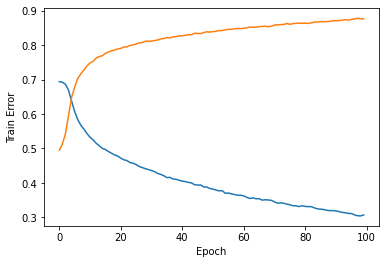

In [ ]:
# pure tag data with userID movieID and Time series 0-30
pd.Series(history.history['loss']).plot()
pd.Series(history.history['accuracy']).plot()
plt.xlabel("Epoch")
plt.ylabel("Train Error")

In [ ]:
# only userID and MoveID
import numpy as np
y_pred = model.predict([test.userID, test.movieID])
y_pred = [np.argmax(i) for i in y_pred]
y_true = list(test.isTag)
print(classification_report(y_pred, y_true))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00      3448
           1       0.34      1.00      0.51      1782

    accuracy                           0.34      5230
   macro avg       0.17      0.50      0.25      5230
weighted avg       0.12      0.34      0.17      5230



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# latent = 100/50
history = model.fit([train_comb.userID, train_comb.movieID, train_comb.date_year, train_comb.date_month, train_comb.dayofweek_num, train_comb.weekofyear], to_categorical(train_comb.isTag), epochs=100, verbose=1)

Epoch 1/100
1308/1308 [==============================] - 30s 8ms/step - loss: 0.6945 - accuracy: 0.5009
Epoch 2/100
1308/1308 [==============================] - 10s 8ms/step - loss: 0.6938 - accuracy: 0.4921
Epoch 3/100
1308/1308 [==============================] - 10s 8ms/step - loss: 0.6934 - accuracy: 0.4993
Epoch 4/100
1308/1308 [==============================] - 10s 8ms/step - loss: 0.6932 - accuracy: 0.4977
Epoch 5/100
1308/1308 [==============================] - 10s 8ms/step - loss: 0.6932 - accuracy: 0.4929
Epoch 6/100
1308/1308 [==============================] - 10s 8ms/step - loss: 0.6933 - accuracy: 0.4922
Epoch 7/100
1308/1308 [==============================] - 10s 8ms/step - loss: 0.6932 - accuracy: 0.4978
Epoch 8/100
1308/1308 [==============================] - 10s 8ms/step - loss: 0.6935 - accuracy: 0.4951
Epoch 9/100
1308/1308 [==============================] - 10s 8ms/step - loss: 0.6932 - accuracy: 0.5012
Epoch 10/100
1308/1308 [==============================] - 10s 8m

Text(0, 0.5, 'Train Error')

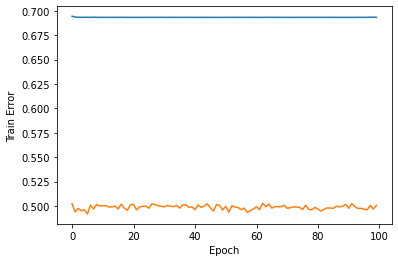

In [ ]:
# 100-latent div 未收敛
pd.Series(history.history['loss']).plot()
pd.Series(history.history['accuracy']).plot()
plt.xlabel("Epoch")
plt.ylabel("Train Error")

In [ ]:
# latent layer = 3
history = model.fit([train_comb.userID, train_comb.movieID, train_comb.date_year, train_comb.date_month, train_comb.dayofweek_num, train_comb.weekofyear], to_categorical(train_comb.isTag), epochs=100, verbose=1)

Epoch 1/100
1308/1308 [==============================] - 5s 4ms/step - loss: 0.5333 - accuracy: 0.7423
Epoch 2/100
1308/1308 [==============================] - 5s 4ms/step - loss: 0.5321 - accuracy: 0.7410
Epoch 3/100
1308/1308 [==============================] - 5s 4ms/step - loss: 0.5317 - accuracy: 0.7433
Epoch 4/100
1308/1308 [==============================] - 5s 4ms/step - loss: 0.5316 - accuracy: 0.7423
Epoch 5/100
1308/1308 [==============================] - 5s 4ms/step - loss: 0.5301 - accuracy: 0.7443
Epoch 6/100
1308/1308 [==============================] - 5s 4ms/step - loss: 0.5284 - accuracy: 0.7450
Epoch 7/100
1308/1308 [==============================] - 5s 4ms/step - loss: 0.5303 - accuracy: 0.7425
Epoch 8/100
1308/1308 [==============================] - 5s 4ms/step - loss: 0.5268 - accuracy: 0.7458
Epoch 9/100
1308/1308 [==============================] - 5s 4ms/step - loss: 0.5272 - accuracy: 0.7449
Epoch 10/100
1308/1308 [==============================] - 5s 4ms/step - l

Text(0, 0.5, 'Train Error')

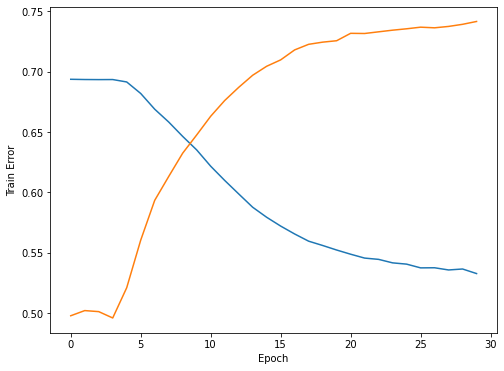

In [ ]:
# pure tag data with userID movieID and Time series 0-30
pd.Series(history.history['loss']).plot()
pd.Series(history.history['accuracy']).plot()
plt.xlabel("Epoch")
plt.ylabel("Train Error")

Text(0, 0.5, 'Train Error')

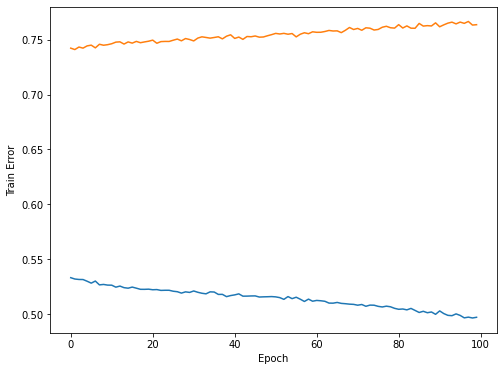

In [ ]:
# pure tag data with userID movieID and Time series 30-130
pd.Series(history.history['loss']).plot()
pd.Series(history.history['accuracy']).plot()
plt.xlabel("Epoch")
plt.ylabel("Train Error")

Text(0, 0.5, 'Train Error')

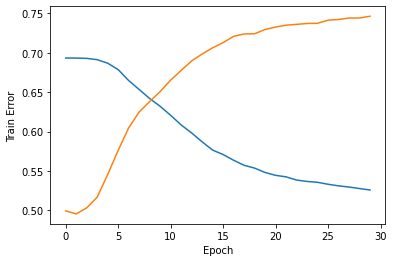

In [ ]:
# pure tag data with userID movieID
pd.Series(history.history['loss']).plot()
pd.Series(history.history['accuracy']).plot()
plt.xlabel("Epoch")
plt.ylabel("Train Error")

In [ ]:
# only userID and MoveID - latent div=3
import numpy as np
y_pred = model.predict([test.userID, test.movieID])
y_pred = [np.argmax(i) for i in y_pred]
y_true = list(test.isTag)
print(classification_report(y_pred, y_true))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00      2722
           1       0.48      1.00      0.65      2508

    accuracy                           0.48      5230
   macro avg       0.24      0.50      0.32      5230
weighted avg       0.23      0.48      0.31      5230



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# userID and MoveID with time in tagging
import numpy as np
y_pred = model.predict([test.userID, test.movieID, test.date_year, test.date_month, test.dayofweek_num, test.weekofyear])
y_pred = [np.argmax(i) for i in y_pred]
y_true = list(test.isTag)
print(classification_report(y_pred, y_true))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00      3016
           1       0.42      1.00      0.59      2214

    accuracy                           0.42      5230
   macro avg       0.21      0.50      0.30      5230
weighted avg       0.18      0.42      0.25      5230



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
